This notebook aims to conduct feature engineering for our PD Model. Order of feature engineering is as followed: 

1) Creation of Features 
2) Feature Selection via IV  <-> WoE binning selected features

This sequence is chosen due to the following reasons: 
- Reduce chance of discarding features, which may only become useful after feature engineering
- Generating interaction features allow me to rank / select variables which are relevant and useful for PD Modeling
- Multicollinearity checks can be conducted once, instead of being repeated multiple times 


# 0. Import Libraries 

In [35]:

# === Standard libraries ===
import os


# === WandB Logging  ===
import wandb
wandb.login(key=os.getenv("WANDB_API_KEY"))


# === Spark Session & Functions ===
from init_spark import start_spark
spark = start_spark()
from pyspark.sql.functions import (
    col, when, count, desc, isnan, isnull, lit, length, trim, lower, upper, to_date, concat_ws,  regexp_extract, mean 
)
from pyspark.sql.types import (
    StructType, StructField, StringType, DoubleType, IntegerType, DateType, NumericType, FloatType, LongType
)


# === Pandas Dataframe & WoE Binning === 
import pandas as pd
from tabulate import tabulate
from optbinning import OptimalBinning
import numpy as np 

# == Visualisation 
import matplotlib.pyplot as plt
import seaborn as sns 
import seaborn as sns
import matplotlib.pyplot as plt

# === Machine Learning === 
from sklearn.linear_model import LogisticRegression as SkLogisticRegression
from sklearn.metrics import (
    roc_auc_score, f1_score, precision_score, recall_score, accuracy_score, classification_report, 
    confusion_matrix, precision_recall_curve, ConfusionMatrixDisplay
)

# === Load Environment Variables ===
from dotenv import load_dotenv
load_dotenv()

# == Global Functions ==
from functions import * 
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/lunlun/.netrc


4.0.0


25/08/10 19:20:36 WARN SparkSession: Using an existing Spark session; only runtime SQL configurations will take effect.


In [36]:
# ============ Constants ======================

TARGET_COL = "default_status"
SAMPLE_FRAC = 0.1
SEED = 42

IV_THRESHOLDS = {
    "useless (< 0.02)": 0.02,
    "weak (< 0.1)": 0.1,
    "medium (< 0.3)": 0.3,
    "strong (< 0.5)": 0.5,
}

# === Feature Categorisation === 
iv_categories = {
    "useless (< 0.02)": [],
    "weak (< 0.1)": [],
    "medium (< 0.3)": [],
    "strong (< 0.5)": [],
    "suspicious": [],
    "no_variation": [],
}

In [37]:
# ============ Reusable Functions ======================

# == 1. Feature Engineering == 

def add_ratio_with_flag(df, numerator, denominator, ratio_col, flag_col, fill_value=-1):
    """
    Adds flag column to indicate invalid value upon division. Adds engineered feature column, and fills -1 upon invalid 
    division operation. 
    
    Parameters 
    ----------
    df: str 
        Spark Dataframe
        
    numerator: str 
        Numerator Column Name
    denominator: str 
        Denominator Column Name
    
    ratio_col: str 
        Engineered Feature Name (Create Yourself)
        
    flag_col: str 
        For e.g. annual_inc/loan_ratio_invalid
        
    fill_value: int 
        Default: -1 (Placeholder in flag column, if invalid division operation)
        
    Returns 
    ------- 
    Spark Dataframe with new columns (flag and divided column)
    """
    # ==  invalid denom (null or <= 0) -> 0 or -1 will be in flag columnis == 
    df = df.withColumn(
    flag_col,
    when((col(denominator).isNull()) | (col(denominator) <= 0), 1)  # invalid → 1
    .otherwise(0)                                                  # valid → 0
)
    
    # == safe ratio: real divide only when valid, else sentinel == 
    df = df.withColumn(ratio_col, when(col(flag_col) == 0, col(numerator) / col(denominator)).otherwise(lit(fill_value)))
    return df


# == 2. Feature Selection (WoE & IV) == 

def get_numerical_cols(df, target_col):
    """Gets all numerical columns, excluding target column"""
    return [
        f.name for f in df.schema.fields
        if isinstance(f.dataType, NumericType)
        and f.name != target_col
    ]

def get_categorical_cols(df, target_col):
    return [
        f.name for f in df.schema.fields
        if isinstance(f.dataType, StringType)
        and f.name != target_col
    ]
        
def classify_iv(feature, iv_score):
    """Adds 1 feature into respective IV categories of iv_categories dictionary"""
    for label, threshold in IV_THRESHOLDS.items():
        if iv_score < threshold:
            iv_categories[label].append((feature, iv_score))
            return
        
    iv_categories["suspicious"].append((feature, iv_score))
    
def first_bin_and_classify_feature(feature, x, y, dtype="numerical", 
                             
                             monotonic_trend_type='auto'):
    """
        Sample first before usage. Ensure only train_df is fed into optbinning
        
        Conducts Optimal Binning on a feature (for the 1st time) -> Outputs WoE table & Plot (to observe monotonic trend)
        Categorises 1 feature into `iv_categories` dictionary
        Inputs: 
        - feature: name of feature (String)
        - x: features (Series) 
        - y: default_status (Series)
        - dtype: numerical (continuous & discrete & ordinal variables) / nominal (strings) 
        - monotonic_trend_type= can set to auto_asc_dsc or auto
    """
    
    # Fit binning with automatic solver 
    optb = OptimalBinning(
        name=feature,
        dtype=dtype,
        monotonic_trend=monotonic_trend_type,
        min_bin_size=0.01 , # min bin size is 1% (majority of our features have >= 1% outliers ... )
        solver="cp"
    )
    optb.fit(x, y)
    bin_table = optb.binning_table.build()
    
    #  Format binning table to display bins WoE & IV
    bin_df = pd.DataFrame({
        "Bin": bin_table["Bin"].astype(str),
        "Count": round(bin_table["Count"], 4),
        "Default Rate (%)": round(bin_table["Event rate"], 4),
        "WOE": bin_table["WoE"],
        "IV": bin_table["IV"]
    })
    
    # Get total IV for feature 
    bin_df = bin_df[~bin_df["Bin"].str.contains("Total", na=False)]
    total_iv = bin_df.iloc[-1]["IV"]
    print(f"✅ Total IV for {feature}: {total_iv:.4f}")

    
    # Add feature to iv_categories
    classify_iv(feature, total_iv)
    
    
    # Print binning table 
    print(tabulate(bin_df, headers="keys", tablefmt="fancy_grid", showindex=False))
    
    # Plot curve 
    optb.binning_table.plot(metric="woe", figsize=(7,4)) 
    
def tx_grade(df): 
    # == Grade = Ordinal -> Dtype = `numerical` ==
    grade_map = {
        "A": 1,
        "B": 2,
        "C": 3,
        "D": 4,
        "E": 5,
        "F": 6,
        "G": 7
    }
    df["grade_numeric"] = df["grade"].map(grade_map)
    
    return df

def woe_bin_transform(df, non_mono_cols, target_col=TARGET_COL, monotonic='auto'): 
    """
    Transforms variables to WoE using OptimalBinning fitted on input df (train).
    Optionally returns dictionary of fitted binners for reuse on test data.
    """
    
    excluded_columns = ['id', 'issue_d', 'default_status', 'earliest_cr_line']
    loop_cols = [feature for feature in df.columns if feature not in excluded_columns]
    
    optb_dict = {}

    for column in loop_cols: 
        # == Check if we should enforce monotonic trend on current feature == 
        if column in non_mono_cols: 
            monotonic_trend = 'auto_asc_desc'
        else:
            monotonic_trend = monotonic

        # == Determine dtype of current column == 
        if df[column].dtype == 'object': 
            dtype = 'categorical'
        elif pd.api.types.is_numeric_dtype(df[column]):
            dtype = 'numerical'
        else:
            continue  # skip unknown types

        optb = OptimalBinning(name=column, dtype=dtype, monotonic_trend=monotonic_trend, solver='cp')

        try:
            optb.fit(df[column], df[target_col])
            df[column + "_woe"] = optb.transform(df[column].to_numpy(), metric="woe")
            df = df.drop(column, axis=1)
            optb_dict[column] = optb  
            
        except Exception as e:
            print(f"❌ Error fitting {column}: {e}")

    return (df, optb_dict) 

def apply_woe_transform(df, optb_dict):
    """Meant to apply woe transform to a test_df using predefined trained optbinners"""
    for column, optb in optb_dict.items():
        df[column + "_woe"] = optb.transform(df[column].to_numpy(), metric="woe")
        df = df.drop(columns=[column])
    return df

def get_updated_iv_categories(iv_categories, train_df): 
    
    updated_iv_categories = {}
    for key, value in iv_categories.items(): 
        new_list = []
        if len(value) > 0 and key != 'no_variation': 
            for feature, iv_value in value: 
                if feature in train_df.columns: 
                    new_list.append((feature, iv_value)) 
            updated_iv_categories[key] = new_list
        else: 
            continue
    
    return updated_iv_categories

def plot_iv_by_category(iv_categories):
    # === 1. Flatten into a clean DataFrame ===
    rows = []
    for category, items in iv_categories.items():
        for it in items:
            if isinstance(it, (tuple, list)) and len(it) >= 2:
                feature, iv = it[0], it[1]
                rows.append({"Feature": feature, "IV": float(iv), "Category": category})
            elif isinstance(it, str):
                rows.append({"Feature": it, "IV": 0.0, "Category": category})

    df_iv = pd.DataFrame(rows).sort_values(by='Feature')

    # === 2. Create faceted plots, showing only relevant features in each ===
    g = sns.catplot(
        data=df_iv,
        kind="bar",
        x="IV",
        y="Feature",
        col="Category",
        col_wrap=2,
        height=6,
        aspect=1.2,
        sharex=False,       # <== allow different x scales
        sharey=False,       # <== allow different features per facet
        palette="Set2"
    )
    
    g.figure.subplots_adjust(top=0.9, wspace=0.9)

    # === 3. Annotate bars ===
    for ax in g.axes.flat:
        for bar in ax.patches:
            width = bar.get_width()
            if width > 0:
                y = bar.get_y() + bar.get_height() / 2
                ax.text(width + 0.002, y, f"{width:.3f}", va='center', fontsize=8)

    # === 4. Final polish ===
    g.set_titles(col_template="{col_name}")
    g.set_xlabels("IV Score")
    g.set_ylabels("Feature")
    g.figure.suptitle("Information Value (IV) by Feature Category", fontsize=16)
    plt.show()
    return g

In [38]:
# == Remove all existing runs every time I run this notebook == 
NOTEBOOK_RUN_NAME = 'PD Model Building II'
api = wandb.Api()
for run in api.runs(f"wlunlun1212-singapore-management-university/Credit Risk Modeling"):                      
    if run.group == NOTEBOOK_RUN_NAME:
        run.delete()

In [39]:
df = spark.read.format("delta")\
    .load("../data/gold/feature_selection_next")
    
df.limit(10).toPandas()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,...,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,credit_history_years,fico_score
0,7369532,33425.0,33425.0,60,15.10,796.94,C,4,RENT,75000.0,...,100.0,0.0,0.0,0.0,11649.0,5657.0,5000.0,0.0,10,742.0
1,6965099,7000.0,7000.0,36,18.25,253.95,D,4,OWN,50000.0,...,86.0,0.0,0.0,0.0,40127.0,4598.0,8400.0,27627.0,21,672.0
2,6975765,20000.0,20000.0,36,6.03,608.72,A,10,MORTGAGE,200000.0,...,98.0,0.0,0.0,0.0,527579.0,25040.0,51900.0,43306.0,40,782.0
3,6919540,2000.0,2000.0,36,9.71,64.27,B,10,MORTGAGE,40000.0,...,96.0,0.0,0.0,0.0,63733.0,9832.0,9600.0,19683.0,12,742.0
4,7091151,6075.0,6075.0,36,12.35,202.80,B,4,MORTGAGE,50000.0,...,88.0,0.0,0.0,0.0,168962.0,27368.0,4500.0,35241.0,17,752.0
5,6835512,8800.0,8800.0,36,15.88,308.87,C,8,RENT,60000.0,...,100.0,100.0,1.0,0.0,39203.0,19942.0,6000.0,31703.0,18,662.0
6,7089001,6500.0,6500.0,36,18.85,237.78,D,3,RENT,44000.0,...,98.0,100.0,1.0,0.0,79552.0,75059.0,2300.0,76552.0,10,662.0
7,6819237,15850.0,15850.0,60,13.68,366.18,C,3,MORTGAGE,64000.0,...,93.0,100.0,0.0,0.0,386747.0,18234.0,10000.0,13465.0,16,712.0
8,7369220,11300.0,11300.0,36,11.99,375.27,B,10,RENT,34500.0,...,100.0,0.0,1.0,0.0,19898.0,12306.0,9300.0,10598.0,10,672.0
9,7048791,35000.0,35000.0,60,15.22,836.70,C,10,MORTGAGE,84308.0,...,98.0,0.0,0.0,0.0,219294.0,190674.0,20500.0,192694.0,26,777.0


In [40]:
# 1) Convert to numeric timestamp
df_ts = df.withColumn("issue_ts", unix_timestamp(col("issue_d")))

# 2) Compute the 7th percentile of that timestamp
quantiles = df_ts.approxQuantile("issue_ts", [0.8], 0.01)
cut_ts = quantiles[0]  # e.g. 1672531200

# 3) Convert back to a human date
cut_date = (
    df_ts
    .select(from_unixtime(lit(cut_ts), "yyyy-MM-dd").alias("cut_date"))
    .first()["cut_date"]
)

print(f"Splitting at ≈ {cut_date} ... ")

# 4) Train-test split
train_df = df.filter(col("issue_d") < cut_date) # train using 80% of the data before cut-off data at 80% 
test_df  = df.filter(col("issue_d") >= cut_date)
df = df.withColumn('issue_d', to_date(col('issue_d'), "yyyy-MM-dd"))
df = df.orderBy(col('issue_d').asc())
train_df = df.where(  col('issue_d') <  cut_date   )
test_df = df.where(  col('issue_d') >=  cut_date     )

print("Train Dataset Proportion:")
train_df.groupBy(col('default_status')).count().show()

print("Test Dataset Proportion:")
test_df.groupBy(col('default_status')).count().show()

CUT_DATE = pd.to_datetime(cut_date)  # or pd.to_datetime(...) — same result


Splitting at ≈ 2016-10-01 ... 
Train Dataset Proportion:
+--------------+------+
|default_status| count|
+--------------+------+
|             1|182891|
|             0|847420|
+--------------+------+

Test Dataset Proportion:
+--------------+------+
|default_status| count|
+--------------+------+
|             1| 53127|
|             0|219647|
+--------------+------+



# 1. Feature Engineering
Now, I will be creating interaction feature from base columns based on domain logic. Interaction features capture the joint effect of features, e.g. When a borrower has high `loan_amnt`, it seems OK. When he has a low `income`, he might have a higher risk. But when he has both a high `loan_amnt` and a low `income`, this may be a huge red flag. As such, combining features is extremely important for credit risk modeling, since I want my model to capture such nuances. 

We can categorise the above features into the 5 Cs in credit risk. The following categories are often assessed by credit risk modelers to check if they are eligible for a loan.

| **C**                                                                                                                            | **Relevant variables**                                                                                                                                                                                                                                                                                                                                               | **Why this mapping matters**                                                                                                                       |
| -------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------ | --------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Character**<br><span style="font-size:0.85em; font-weight:400">Willing-to-pay: past behaviour & credit‐seeking patterns</span> | `fico_score`, `delinq_2yrs`, `pub_rec`, `acc_now_delinq`, `collections_12_mths_ex_med`, `chargeoff_within_12_mths`, `inq_last_6mths`, `mths_since_recent_inq`, `mo_sin_rcnt_tl`, `mo_sin_rcnt_rev_tl_op`, `mo_sin_old_il_acct`, `earliest_cr_line`, `credit_history_years`, `num_accts_ever_120_pd`, `num_tl_120dpd_2m`, `num_tl_90g_dpd_24m`, `num_tl_op_past_12m`, `num_bc_tl`, `num_il_tl`, `pct_tl_nvr_dlq` | Records of delinquencies, recency of new accounts and enquiries, and depth of credit history reveal a borrower’s **intent** and reliability.         |
| **Capacity**<br><span style="font-size:0.85em; font-weight:400">Ability-to-pay: income, leverage & utilisation</span>            | `annual_inc`, `dti`, `revol_util`, `loan_amnt`, `total_bal_ex_mort`, `proportion_satisfac_accounts`, `proportion_satisfac_bc_tl`, `acc_open_past_24mths`, `bc_open_to_buy`, `total_acc`                                                                                                                                                     | These features quantify **cash-flow pressure**: debt service vs income and how heavily existing lines are used.                                     |
| **Capital**<br><span style="font-size:0.85em; font-weight:400">Net worth / borrower’s own stake</span>                           | `total_rev_hi_lim`, `tot_hi_cred_lim`, `num_bc_tl`, `revol_bal`                                                                                                                                                                                                                                                                                                                   | Higher total limits and more bank-card trades can proxy unencumbered liquidity or long-standing credit lines acting as “soft” capital reserves.      |
| **Collateral**<br><span style="font-size:0.85em; font-weight:400">Assets pledged (or proxies) for debt obligations</span>        | `home_ownership`, `mort_acc`                                                                                                                                                                                                                                                                                                   | Availability of collateral lowers borrower’s risk in defaulting.                                                                                     |
| **Conditions**<br><span style="font-size:0.85em; font-weight:400">External & loan-specific terms</span>                          | `term`, `grade`, `verification_status`, `issue_d`, `initial_list_status`, `application_type`, `installment`, `int_rate`, `pymnt_plan`                                                                                                                                                                                        | Economic cycle at origination (`issue_d`), lender-set terms (`grade`, `term`), document quality (`verification_status`) and channel flags influence default **independent** of borrower traits. |


### 1.1 Within 'C' Interaction

In [41]:

# ============================ Within 'C' Interaction Features ============================

# =======================
#       DIVISION
# =======================

specs = [
    # == A. Character ==
    ("fico_score", "delinq_2yrs",             "fico_score/delinq_2yrs"),
    ("fico_score", "acc_now_delinq",          "fico_score/acc_now_delinq"),
    ("fico_score", "inq_last_6mths",          "fico_score/inq_last_6mths"),
    ("delinq_2yrs","credit_history_years",       "delinq_2yrs/credit_history"),
    ("num_accts_ever_120_pd","credit_history_years","late_pymt_hist"),

    # == B. Capacity ==
    ("loan_amnt",  "annual_inc",              "loan_amnt/annual_inc"),
    ("revol_util", "annual_inc",              "revol_util/annual_inc"),
    ('acc_open_past_24mths', "total_acc", "acc_op_past_24mths/total_acc"), 

    # == C. Capital ==
    ("bc_open_to_buy", "annual_inc",          "bc_open_to_buy/annual_inc"),
]

for num, den, ratio in specs:
    df = add_ratio_with_flag(
        df,
        numerator=num,
        denominator=den,
        ratio_col=ratio,
        flag_col=f"{ratio}_invalid",   # e.g., "loan_amnt/annual_inc_invalid"
    )
    
# =======================
#       PRODUCT
# =======================

# == A. Character == 
df = df.withColumn('inq_last6mths_x_tl_op_past_12m', col('inq_last_6mths') * col('num_tl_op_past_12m') )

# == B. Capacity == 
df = df.withColumn('dti_x_revol_util', col('dti') * col('revol_util'))

# =======================
#       REST 
# =======================
df = df.withColumn('avail_ratio', lit(1) - col('bc_util'))

df = (
    df
    .withColumn("delinq2yrs_flag", (F.col("delinq_2yrs") > 0).cast("int"))
    .withColumn("pubrec_flag", (F.col("pub_rec") > 0).cast("int"))
    .withColumn("acc_now_delinq_flag", (F.col("acc_now_delinq") > 0).cast("int"))
)


Explanation for creation of the above features are explained below (Within 'C'): 
- **Character**
    - `fico_score/delinq_2yrs`: High credit score relative to few past delinquencies signals strong repayment character.
    - `fico_score/acc_now_delinq`: Low fico scores with high number of accounts currently delinquent signals high risk 
    - `fico_score/inq_last_6mths`: Low fico score with high credit inquries signal financial desperation 
    - `delinq_2yrs/credit_hist`: High number of recent delinquencies, with short credit history has higher risk 
    - `inq_last6mths_x_tl_op_past_12m`: Shows aggressive credit seeking 
    - `late_pymt_hist`: Checks chronic late payments 


- **Capacity** 
    - `dti_x_revol_util`: High dti and high utilisation rates of current tradelines signal higher risk 
    - `loan_amnt/annual_inc`: Measures how much loan amount is relative to income levels
    - `revol_util/annual_inc`: Low income and high credit utilisation is risky 
    - `acc_op_past_24mths/total_acc`: Recent credit expansion / seeking behaviour may indicate risk 

- **Capital**
    - `bc_open_to_buy/annual_inc`: Checks buffer capacity to repay existing loans 

- **Rest**
    - `avail_ratio`: Signifies remaining credit proportion borrower can use 
    - **Flags**: Any of the following records in one's credit history signfifies a red flag


### 1.2 Across 'C' Interaction Features

In [42]:

# ========================= Across 'C' Interaction Features ==================================

# =======================
#       PRODUCT
# =======================

# == A. Character x Capacity == 
df = df.withColumn("tl_op12m_x_inq6m", col("num_tl_op_past_12m") * col("inq_last_6mths"))
df = df.withColumn("dti_x_inq", col("dti") * col("inq_last_6mths"))

# == C. Capacity x Condition == 
df = df.withColumn('dti_x_term', col('dti') * col('term'))
df = df.withColumn('term_x_revol_util', col('term') * col('revol_util')) 


# =======================
#       DIVISION
# =======================

specs1 = [
    # Character × Capacity
    ("dti", "fico_score", "dti/fico_ratio"),

    # Capacity × Capital
    ("loan_amnt", "tot_hi_cred_lim", "loan_amnt/tot_hi_cred_lim"),
    ('bc_open_to_buy', 'total_rev_hi_lim', 'bc_open_to_buy/total_rev_hi_lim'), 


    # Capacity × Condition
    ("fico_score", "int_rate", "fico_score/int_rate"),
]


for num, den, ratio in specs1:
    df = add_ratio_with_flag(
        df,
        numerator=num,
        denominator=den,
        ratio_col=ratio,
        flag_col=f"{ratio}_invalid",   # e.g., "loan_amnt/annual_inc_invalid"
    )
    


# == Safe Division not required (Capacity x Condition) == 
df = df.withColumn('installment/annual_inc/12', col('installment') / (col('annual_inc')/12))
df = df.withColumn('installment/annual_inc/12_x_term', col('installment') / (col('annual_inc')/lit(12)) * col('term'))

Explanation for creation of the above features are explained below (Within 'C'): 

- **Character × Capacity**
    - `tl_op12m_x_inq6m`: Lots of new tradelines and recent inquiries signal aggressive borrowing and potential financial stress.  
    - `dti_x_inq` : High debt-to-income plus many recent inquiries combines weak capacity with urgent credit need.  
    - `dti/fico_ratio` : High DTI when FICO is low flags heavy leverage on a weaker credit profile → higher default risk.  

- **Capacity × Capital**
    - `loan_amnt/tot_hi_cred_lim` : Large requested loan relative to total credit limit indicates stretching beyond capacity, reducing repayment ability.  
    - `bc_open_to_buy/total_rev_hi_lim`: Percentage of remaining revolving credit available to use 


- **Capacity × Condition**
    - `dti_x_term` : High debt burden locked into a longer term increases exposure to shocks over time.  
    - `term_x_revol_util` : High revolving utilization sustained over a long term suggests prolonged reliance on credit and less buffer.  
    - `installment/annual_inc` : Payment-to-Income (PTI) shows affordability; higher PTI leaves less room for essentials and emergencies.  
    - `installment/annual_inc_x_term` : PTI extended over a longer term compounds financial strain.  
    - `fico_score/int_rate` : Combines borrower quality and risk-based pricing; lower FICO and/or higher rate signals elevated risk.  



In [43]:
train_pdf , test_pdf = sample_split_order(df, 0.1, CUT_DATE, 'issue_d')
run_model_checkpoint(train_pdf, test_pdf, 'log_reg_feat_eng', model_type='Logistic Regression', run_group=NOTEBOOK_RUN_NAME)

train_pdf has 104804 rows, 102 columns
test_pdf has 25595 rows, 102 columns



✅ Best F1 Score = 0.4144 at threshold = 0.49

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8876    0.6192    0.7295     20627
     Default     0.2991    0.6745    0.4144      4968

    accuracy                         0.6300     25595
   macro avg     0.5933    0.6469    0.5720     25595
weighted avg     0.7734    0.6300    0.6684     25595



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.62997
Best Threshold,0.48636
F1 Score,0.41439
Gini,0.39607
Model Type,Logistic Regression


In [44]:
df1 = df 

# 2. Feature Importance Inspection (WoE & IV)

After creating the interaction features, I will now be selecting features which are the most relevant (i.e. separates non-defaulters and defaulters well) and useful for our PD Model. We will be the utilising the `optbinning` library to observe monotonic trends of WoE, observe IV and WoE binning of variables. I will be following this guideline to determine strength of different variables. 

![Feature Selection](https://media.licdn.com/dms/image/v2/D5612AQEnsMrGYt9wxw/article-inline_image-shrink_1500_2232/article-inline_image-shrink_1500_2232/0/1659097050621?e=1757548800&v=beta&t=4GwB73k9LWlDDgdydkU2boqr8GAnIr-Qc73Yem58PwI)

### 2.1 Numerical Features IV 

train_pdf has 104804 rows, 102 columns
test_pdf has 25595 rows, 102 columns

🔍 Feature: loan_amnt
✅ Total IV for loan_amnt: 0.0441
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 3537.50)      │    5476 │             0.1317 │ 0.3601914838783997    │ 0.00601721  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3537.50, 7012.50)   │   17004 │             0.1401 │ 0.2884654191218736    │ 0.0122774   │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7012.50, 9012.50)   │    9979 │             0.142  │ 0.272670493198069     │ 0.00647193  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9012.50, 10012.50)  

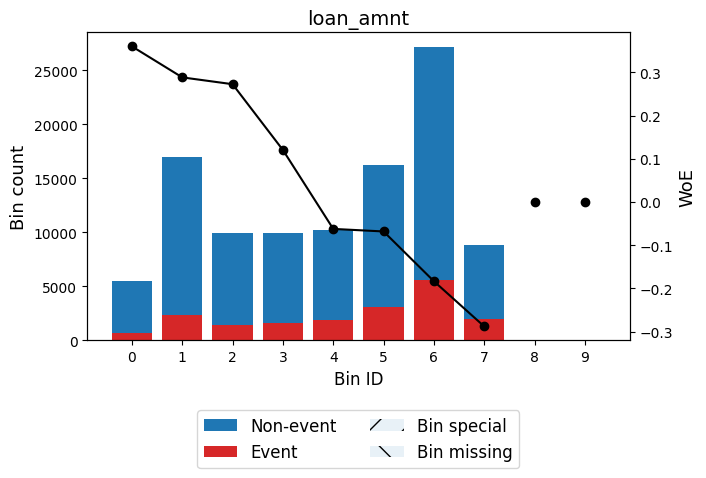


🔍 Feature: funded_amnt
✅ Total IV for funded_amnt: 0.0442
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3537.50)      │    5479 │             0.1316 │ 0.36082219976181196  │ 0.00604032  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3537.50, 7012.50)   │   17017 │             0.1402 │ 0.2878904329321179   │ 0.0122402   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7012.50, 9012.50)   │    9982 │             0.1419 │ 0.2738435301055091   │ 0.00652713  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9012.50, 10012.50)  │    9912 │             0.1616 │ 0.12008540640504739  │ 0.00131164  │
├──────────

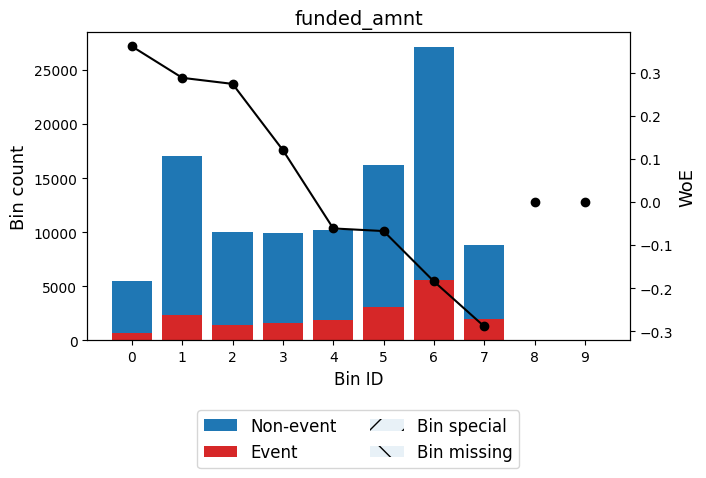


🔍 Feature: term
✅ Total IV for term: 0.2166
╒═══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                 │        IV │
╞═══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 48.00) │   79741 │             0.1378 │ 0.3073841596637701  │ 0.0649606 │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [48.00, inf)  │   25063 │             0.3082 │ -0.7174954188198741 │ 0.151631  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│               │  104804 │             0.

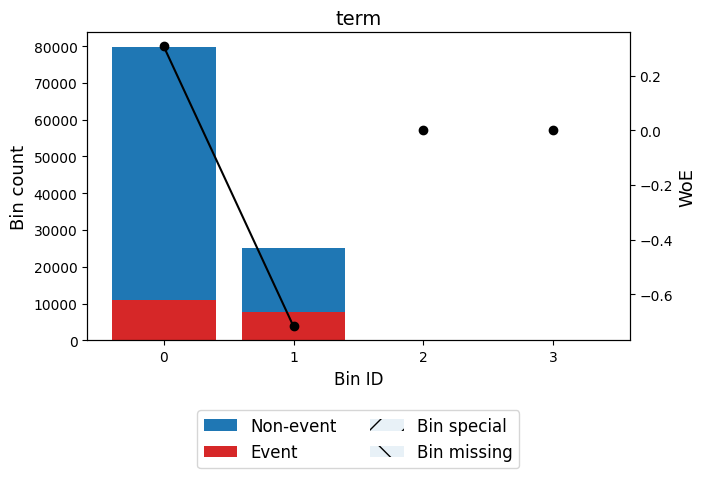


🔍 Feature: int_rate
✅ Total IV for int_rate: 0.4606
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 6.83)   │    6504 │             0.0337 │ 1.830728037391705    │ 0.112228    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.83, 8.12)   │    9878 │             0.0622 │ 1.187774917849492    │ 0.088844    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.12, 8.96)   │    5541 │             0.0919 │ 0.7650034280136118   │ 0.0239076   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.96, 9.73)   │    5272 │             0.1032 │ 0.6361869584138495   │ 0.0164455   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

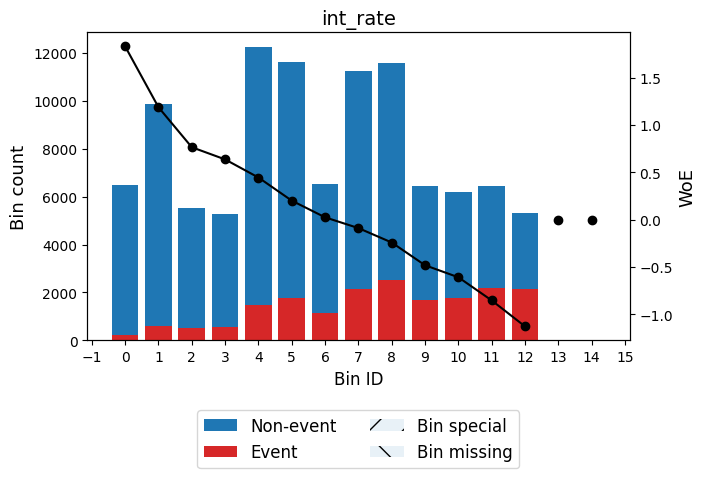


🔍 Feature: installment
✅ Total IV for installment: 0.0323
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 133.59)   │    6926 │             0.1255 │ 0.415505427899413    │ 0.00993921  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [133.59, 193.38) │    9206 │             0.1352 │ 0.32929773637362825  │ 0.00854372  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [193.38, 251.58) │    9826 │             0.1502 │ 0.20680445886834153  │ 0.00374731  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [251.58, 337.48) │   18833 │             0.1732 │ 0.03731917912488525  │ 0.000247273 │
├──────────────────┼─────────┼────────────────────┼

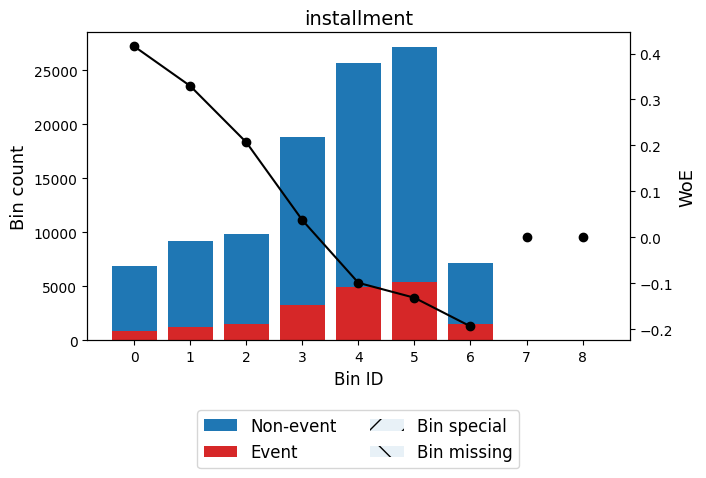


🔍 Feature: emp_length
✅ Total IV for emp_length: 0.0014
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   14983 │             0.1821 │ -0.023756076817281757 │ 8.12978e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │    9515 │             0.1723 │ 0.043612507199044526  │ 0.00017027  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50) │    8341 │             0.171  │ 0.05269828930847553   │ 0.00021729  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 4.50) │    6213 │             0.163  │ 0.10962104650469318   │ 0.000687467 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────

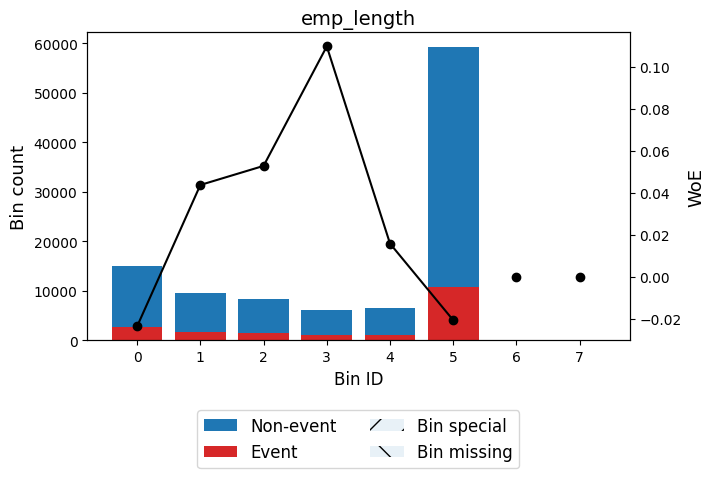


🔍 Feature: annual_inc
✅ Total IV for annual_inc: 0.0258
╒═══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 30059.00)      │    7601 │             0.2083 │ -0.19068815650716364  │ 0.00280035  │
├───────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [30059.00, 45752.50)  │   18623 │             0.2031 │ -0.15931246172779967  │ 0.00474279  │
├───────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [45752.50, 60829.46)  │   22288 │             0.1904 │ -0.07881435502172907  │ 0.00135462  │
├───────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [60829.46, 75642.10)  │   17893 │             0.1825 │ -0.026818212459464252 │ 0.00012

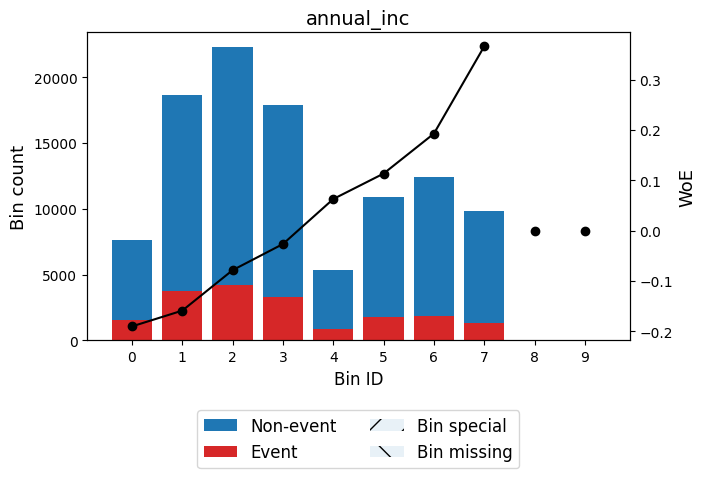


🔍 Feature: dti
✅ Total IV for dti: 0.0961
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 5.90)   │    6691 │             0.1155 │ 0.5093534305565908   │ 0.0139746   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.90, 10.77)  │   14825 │             0.1244 │ 0.42542827096031344  │ 0.0222279   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10.77, 12.78) │    8458 │             0.1392 │ 0.2961780333182924   │ 0.0064212   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12.78, 14.31) │    6978 │             0.1516 │ 0.19583476164366465  │ 0.00239507  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤


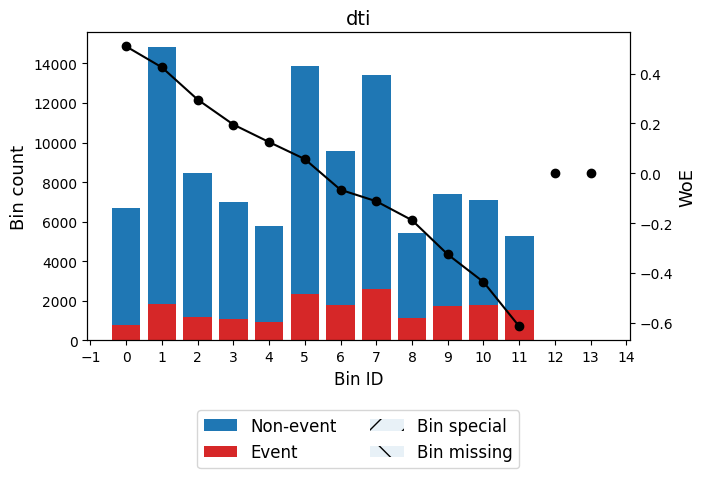


🔍 Feature: delinq_2yrs
✅ Total IV for delinq_2yrs: 0.0024
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   13415 │             0.1895 │ -0.07278987456779196 │ 0.00069413  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, inf)  │    6940 │             0.1993 │ -0.13531801220097894 │ 0.00126565  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Miss

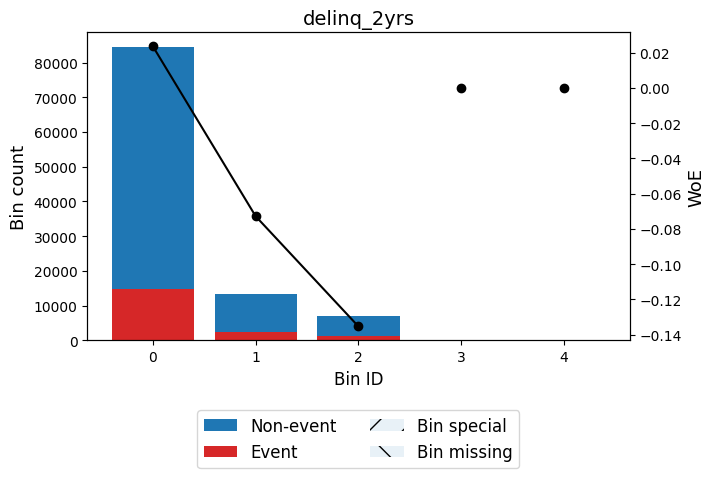


🔍 Feature: inq_last_6mths
✅ Total IV for inq_last_6mths: 0.0293
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   59397 │             0.1589 │ 0.1402112562715041   │ 0.0106445  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   28829 │             0.1909 │ -0.08184613362490567 │ 0.00189138 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10780 │             0.2191 │ -0.2552578012429336  │ 0.00725807 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    5798 │             0.2432 │ -0.3908375157932351  │ 0.00952657 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special  

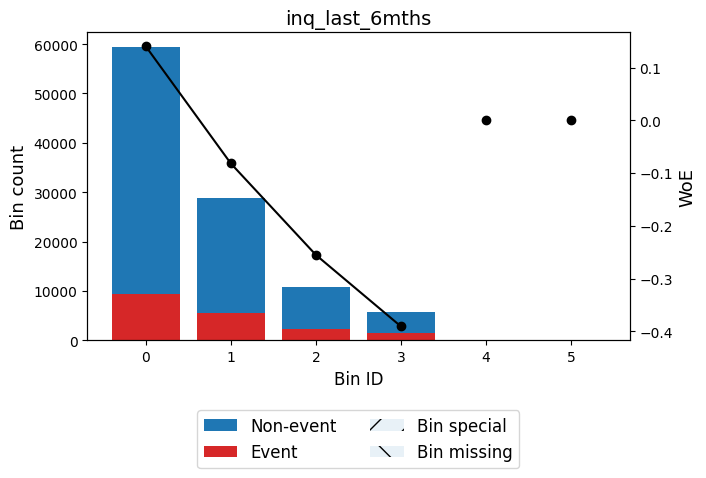


🔍 Feature: open_acc
✅ Total IV for open_acc: 0.0168
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 5.50)   │    8822 │             0.1429 │ 0.2649770457772085    │ 0.00541719  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 6.50)   │    6554 │             0.1565 │ 0.15803698590064896   │ 0.00148343  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)   │    8072 │             0.162  │ 0.11699382418518489   │ 0.00101489  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 8.50)   │    8823 │             0.1688 │ 0.0682949621311204    │ 0.000384078 │
├────────────────┼─────────┼────────────────────┼──────────────────

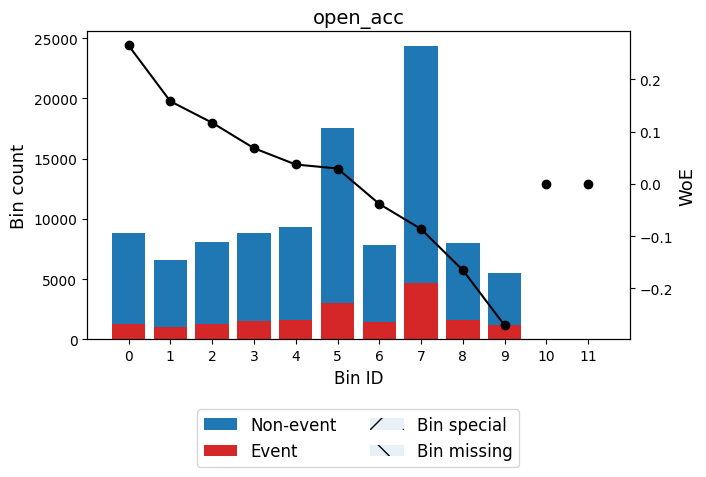


🔍 Feature: pub_rec
✅ Total IV for pub_rec: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87730 │             0.1735 │ 0.034913284973516534 │ 0.00100893 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17074 │             0.2046 │ -0.16821056251890565 │ 0.00486098 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │  104804 

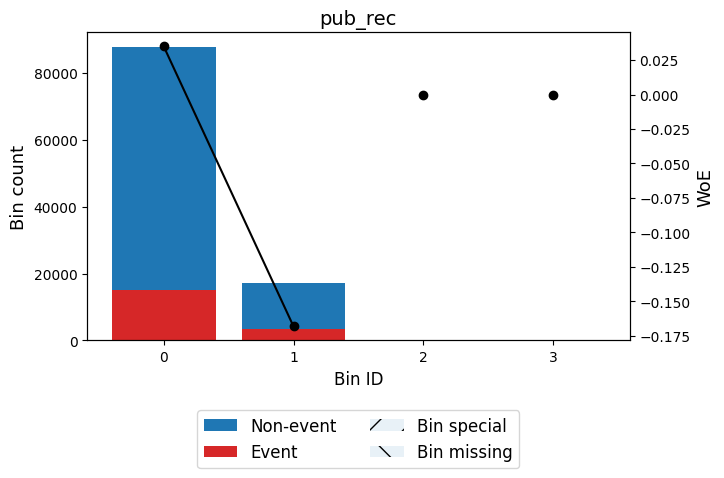


🔍 Feature: revol_bal
✅ Total IV for revol_bal: 0.0043
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2782.50)      │    8339 │             0.1626 │ 0.11281808052955244   │ 0.00097629  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2782.50, 5974.50)   │   16372 │             0.1743 │ 0.029603677334763212  │ 0.000135603 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5974.50, 9009.50)   │   16205 │             0.18   │ -0.009815672390732555 │ 1.49445e-05 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9009.50, 12141.50)  │   14323 │             0.181  │ -0.01631622178258696  │ 3.65737e-05 │
├────

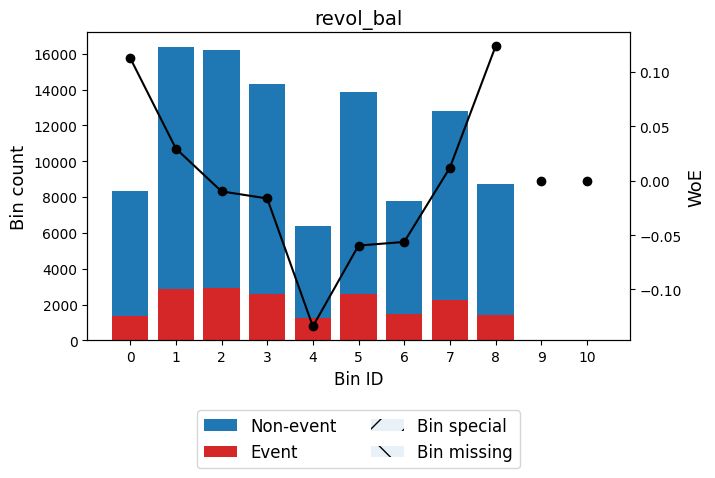


🔍 Feature: revol_util
✅ Total IV for revol_util: 0.0216
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 17.85)  │    8679 │             0.131  │ 0.3659728302516243    │ 0.00982613  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [17.85, 27.55) │    8244 │             0.149  │ 0.21668507152878935   │ 0.00344026  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [27.55, 33.95) │    7289 │             0.1609 │ 0.12522236457933555   │ 0.00104706  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [33.95, 38.05) │    5334 │             0.1669 │ 0.08196733421719293   │ 0.000332986 │
├────────────────┼─────────┼────────────────────┼──────────────

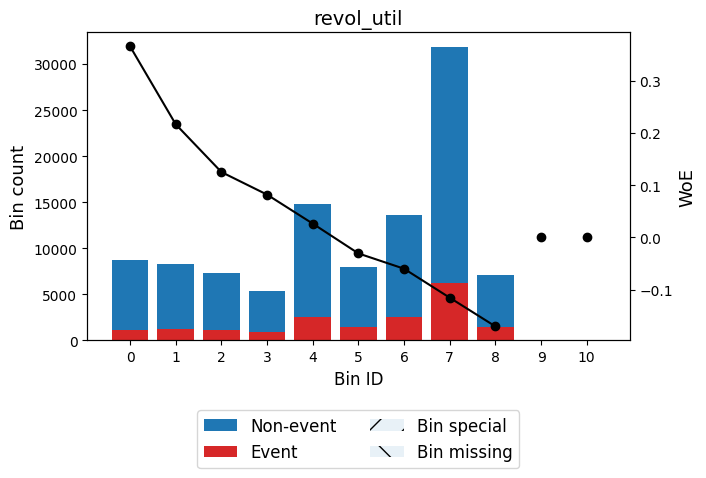


🔍 Feature: total_acc
✅ Total IV for total_acc: 0.0035
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11.50)  │   10331 │             0.1633 │ 0.10779228126466633   │ 0.00110596  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11.50, 14.50) │    8685 │             0.1687 │ 0.0688783566195621    │ 0.000384485 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [14.50, 21.50) │   25336 │             0.1748 │ 0.02606249218814294   │ 0.000162834 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [21.50, 36.50) │   43357 │             0.1809 │ -0.016127072469403814 │ 0.000108153 │
├────────────────┼─────────┼────────────────────┼────────────────

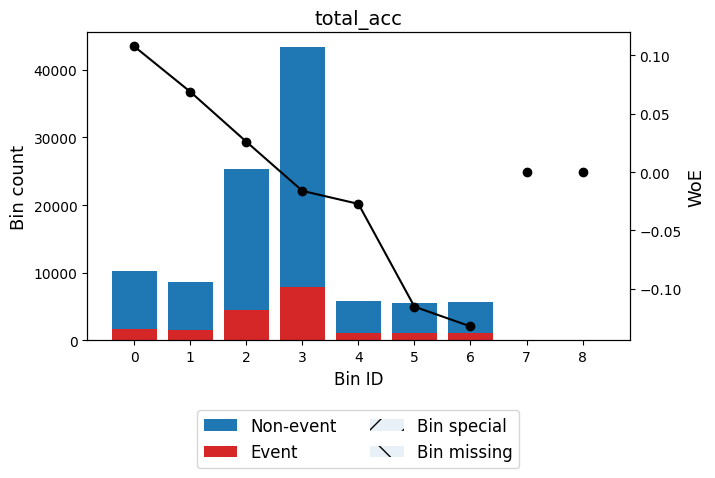


🔍 Feature: collections_12_mths_ex_med
✅ Total IV for collections_12_mths_ex_med: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


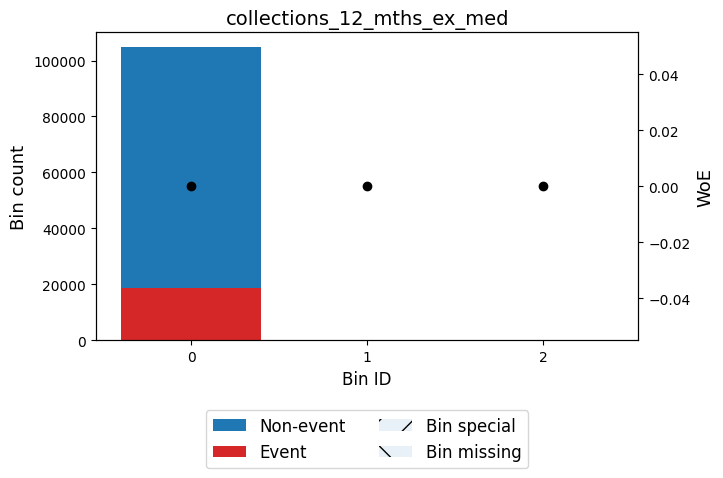


🔍 Feature: acc_now_delinq
✅ Total IV for acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


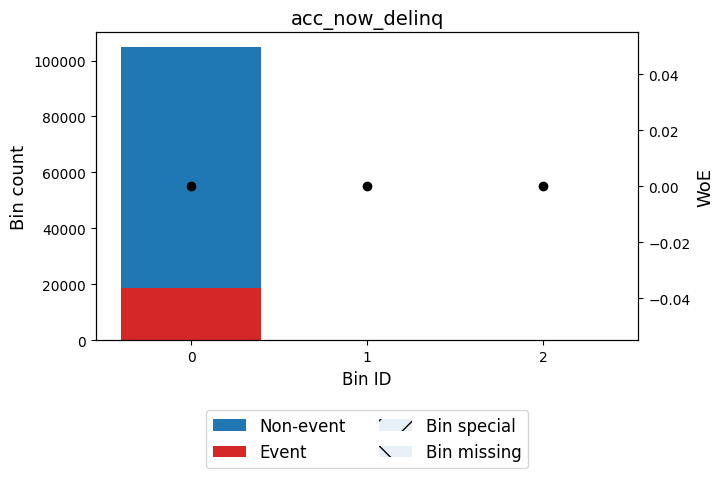


🔍 Feature: tot_cur_bal
✅ Total IV for tot_cur_bal: 0.0301
╒════════════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                    │          IV │
╞════════════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 14981.50)       │   10231 │             0.1639 │ 0.10327117314750311    │ 0.0010068   │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [14981.50, 20807.50)   │    5534 │             0.1883 │ -0.06496526027112037   │ 0.000227527 │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [20807.50, 31143.00)   │    9926 │             0.1979 │ -0.1264243391702906    │ 0.0015757   │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [31143.00, 40964.50)   │    7582 │             0.2043 │ -0.1664865

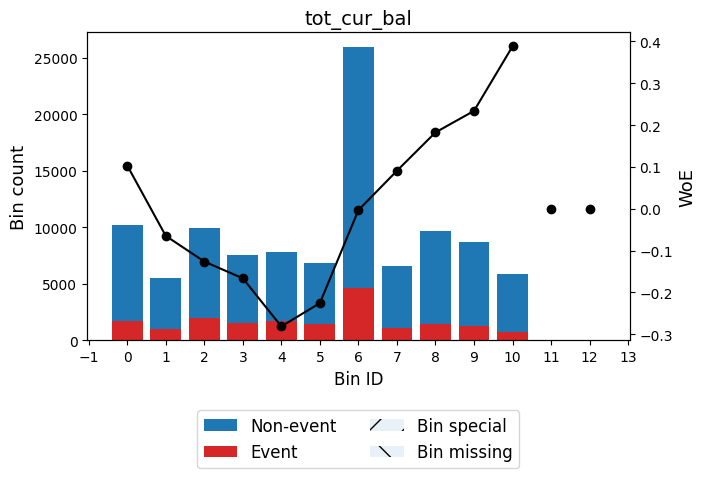


🔍 Feature: total_rev_hi_lim
✅ Total IV for total_rev_hi_lim: 0.0148
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 9025.00)      │   11098 │             0.1957 │ -0.1128013896807527  │ 0.00139655  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9025.00, 21153.50)  │   31741 │             0.1909 │ -0.08207973502380961 │ 0.00209448  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [21153.50, 23939.00) │    6234 │             0.1885 │ -0.06622066610246513 │ 0.000266415 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23939.00, 38407.50) │   29300 │             0.1768 │ 0.012114961771451105 │ 4.08734e-05 │
├

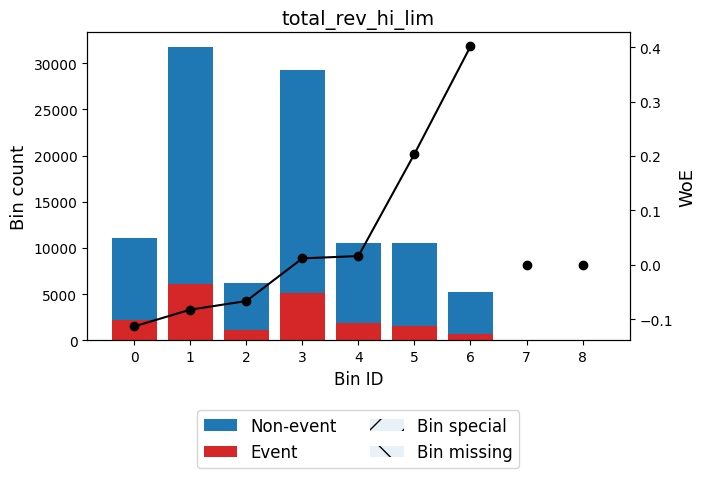


🔍 Feature: acc_open_past_24mths
✅ Total IV for acc_open_past_24mths: 0.0869
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   13578 │             0.1206 │ 0.4602967687174364   │ 0.0235506   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   13190 │             0.1382 │ 0.3041095711919053   │ 0.010529    │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   15035 │             0.1577 │ 0.14933016167930058  │ 0.00304712  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   18518 │             0.1645 │ 0.09868844991721759  │ 0.00166665  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

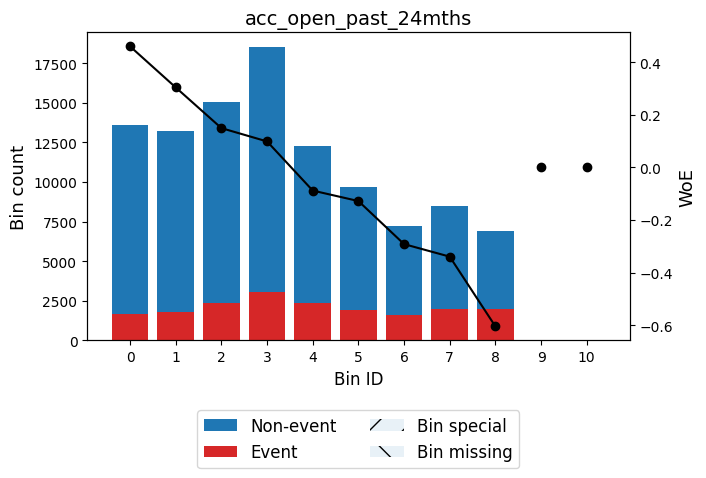


🔍 Feature: avg_cur_bal
✅ Total IV for avg_cur_bal: 0.0354
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 7248.50)      │   48575 │             0.2006 │ -0.14329738859067453  │ 0.00995894  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7248.50, 13811.50)  │   22803 │             0.1807 │ -0.014360497699876573 │ 4.5077e-05  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13811.50, 20170.00) │   11389 │             0.1654 │ 0.092299445970079     │ 0.000898482 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [20170.00, 24124.00) │    5342 │             0.1513 │ 0.198676418730237     │ 0.00188536  │
├

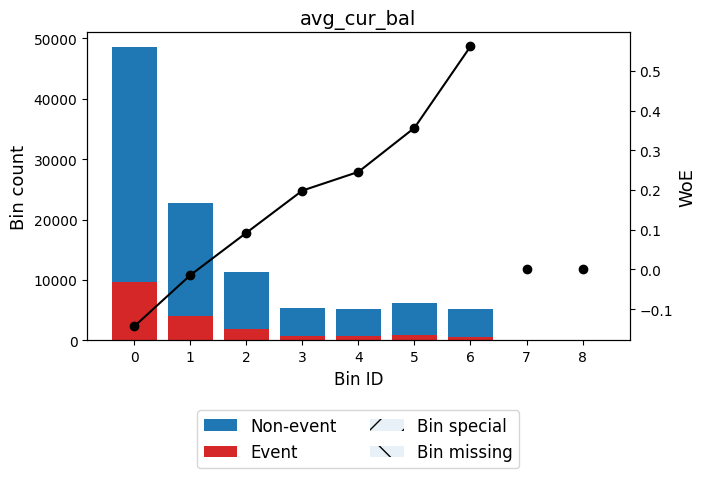


🔍 Feature: bc_open_to_buy
✅ Total IV for bc_open_to_buy: 0.0459
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 205.50)       │    6865 │             0.235  │ -0.3456081965186639  │ 0.00870457  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [205.50, 1029.50)    │   14093 │             0.2042 │ -0.16596479430914668 │ 0.00390315  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1029.50, 1606.50)   │    6796 │             0.202  │ -0.15247031274305245 │ 0.00158193  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1606.50, 3396.50)   │   15678 │             0.1973 │ -0.12315994021103949 │ 0.00235952  │
├────

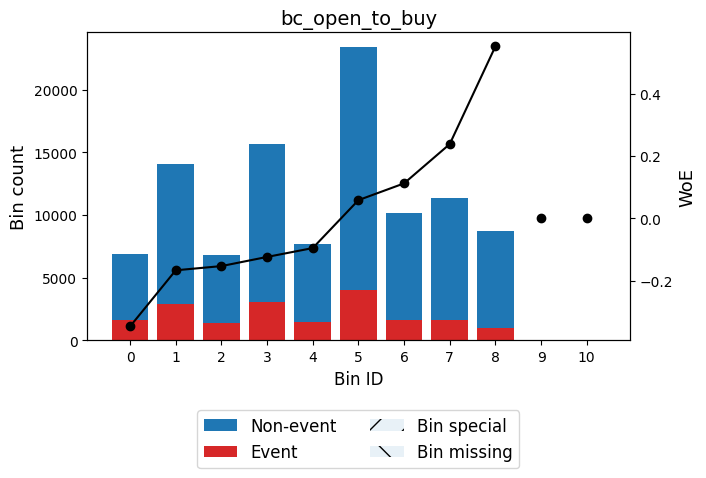


🔍 Feature: bc_util
✅ Total IV for bc_util: 0.0277
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 14.95)  │    6633 │             0.1411 │ 0.2799581691866615   │ 0.00452382  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14.95, 37.15) │   14382 │             0.1486 │ 0.2195933602509783   │ 0.0061579   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37.15, 46.15) │    8251 │             0.1637 │ 0.10455499880900998  │ 0.000831917 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [46.15, 63.35) │   23537 │             0.1677 │ 0.07594208145959724  │ 0.00126375  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───────

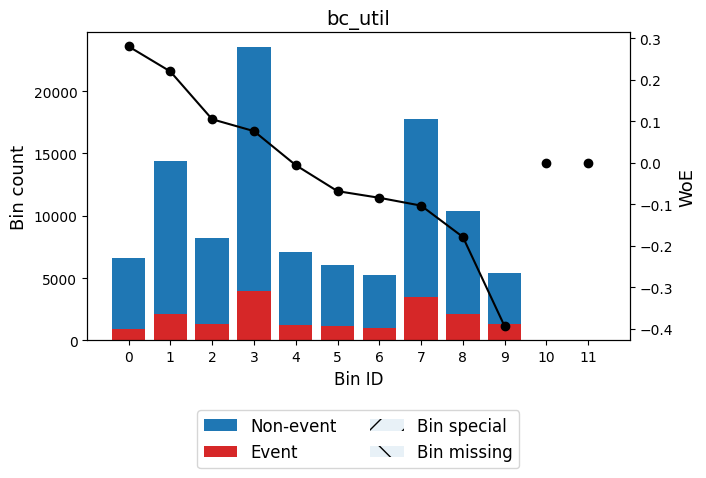


🔍 Feature: chargeoff_within_12_mths
✅ Total IV for chargeoff_within_12_mths: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


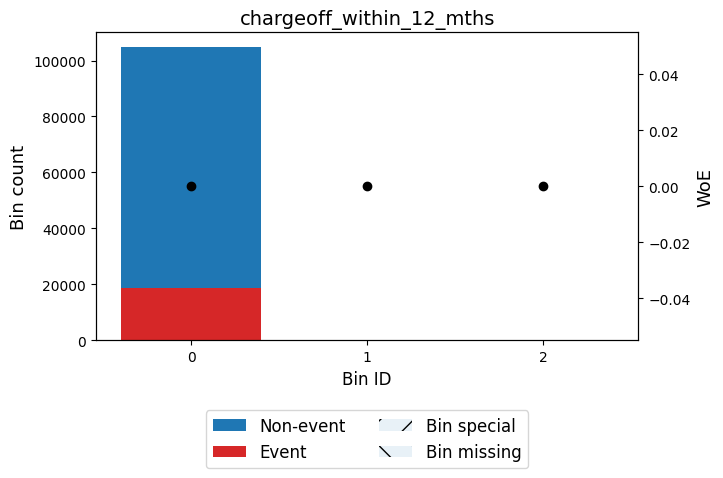


🔍 Feature: delinq_amnt
✅ Total IV for delinq_amnt: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


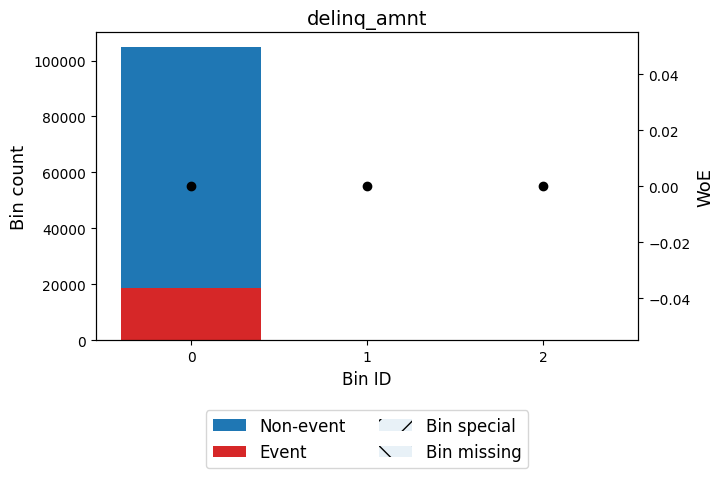


🔍 Feature: mo_sin_old_il_acct
✅ Total IV for mo_sin_old_il_acct: 0.0064
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 47.50)    │    7491 │             0.2037 │ -0.1628622311285277   │ 0.00199592  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [47.50, 127.50)  │   38153 │             0.1863 │ -0.05173159205664857  │ 0.000990482 │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [127.50, 129.50) │   11698 │             0.1557 │ 0.1647016673643773    │ 0.00286942  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [129.50, 198.50) │   40896 │             0.1732 │ 0.036684966371827166  │ 0.000518967 │
├──────────────────┼───────

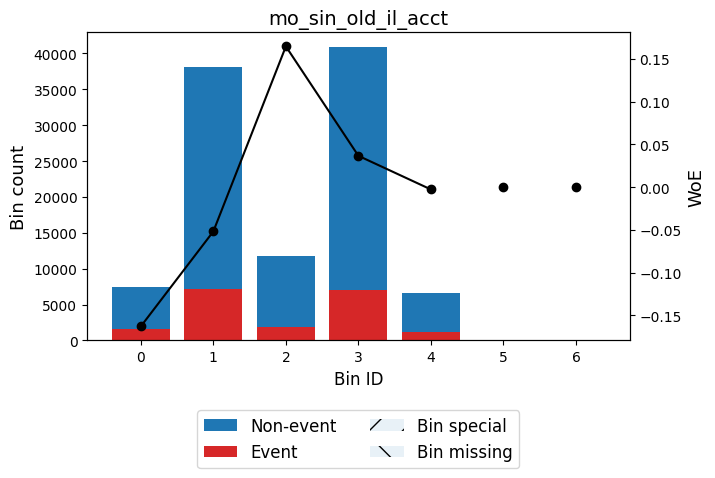


🔍 Feature: mo_sin_old_rev_tl_op
✅ Total IV for mo_sin_old_rev_tl_op: 0.0170
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 63.50)    │    6032 │             0.2291 │ -0.3127858595623554  │ 0.00620417  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [63.50, 112.50)  │   15289 │             0.1968 │ -0.1197572287450539  │ 0.00217327  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [112.50, 133.50) │   11113 │             0.1927 │ -0.09386417326455243 │ 0.000962564 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [133.50, 159.50) │   13301 │             0.1859 │ -0.04892117276534402 │ 0.000308529 │
├──────────────────┼─────────┼───

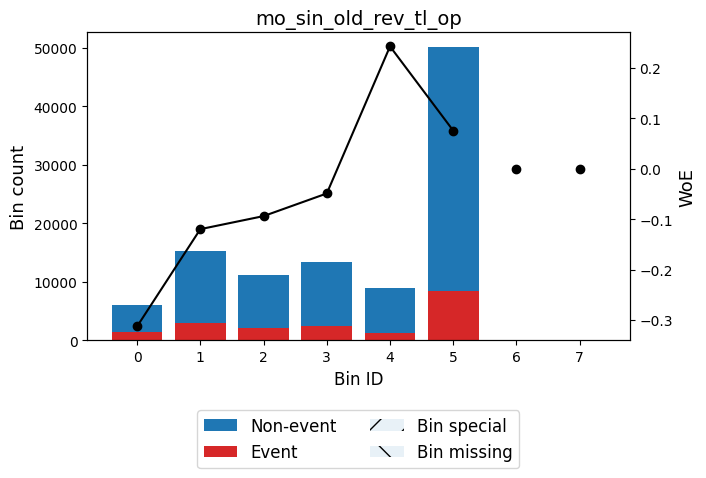


🔍 Feature: mo_sin_rcnt_rev_tl_op
✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0310
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50)   │    8005 │             0.2167 │ -0.24135241257013518 │ 0.00479823  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50)   │   15732 │             0.2086 │ -0.19285372357332453 │ 0.0059323   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    6977 │             0.1921 │ -0.08943895867952412 │ 0.000547917 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 7.50)   │   16772 │             0.1889 │ -0.06885796062337257 │ 0.00077564  │
├────────────────┼─────────┼────────────────────┼──

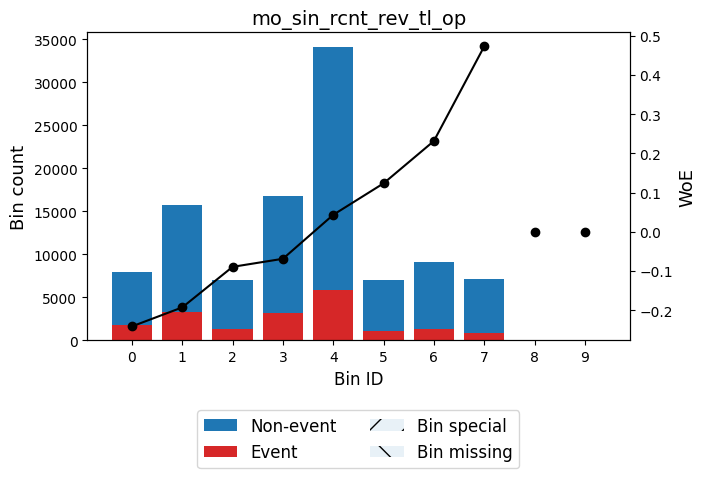


🔍 Feature: mo_sin_rcnt_tl
✅ Total IV for mo_sin_rcnt_tl: 0.0389
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50)   │   10043 │             0.2173 │ -0.24444941641540163 │ 0.00618109  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50)   │   10953 │             0.211  │ -0.20716764759864437 │ 0.00478705  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)   │   10669 │             0.2104 │ -0.20374210017868521 │ 0.00450526  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    9466 │             0.1918 │ -0.08805198615679921 │ 0.000720191 │
├────────────────┼─────────┼────────────────────┼────────────────

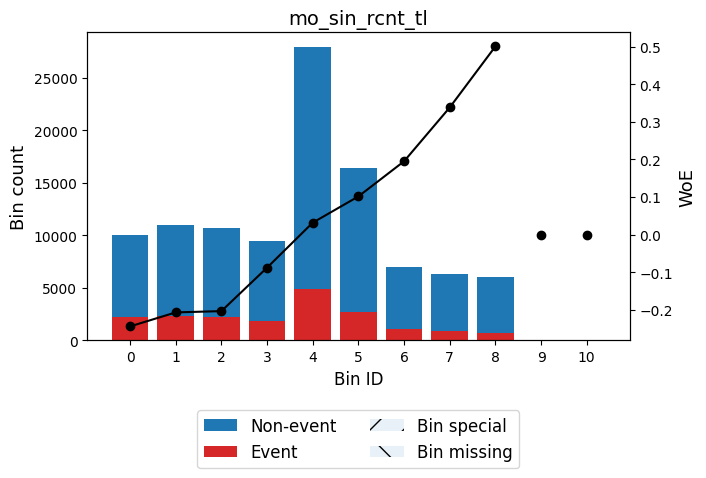


🔍 Feature: mort_acc
✅ Total IV for mort_acc: 0.0214
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   39685 │             0.203  │ -0.15830833312752235 │ 0.00997663  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36235 │             0.173  │ 0.03871102064305232  │ 0.000511676 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   10892 │             0.1638 │ 0.10417376022753344  │ 0.00109034  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50) │   12304 │             0.1465 │ 0.23589719268653409  │ 0.00604652  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, inf

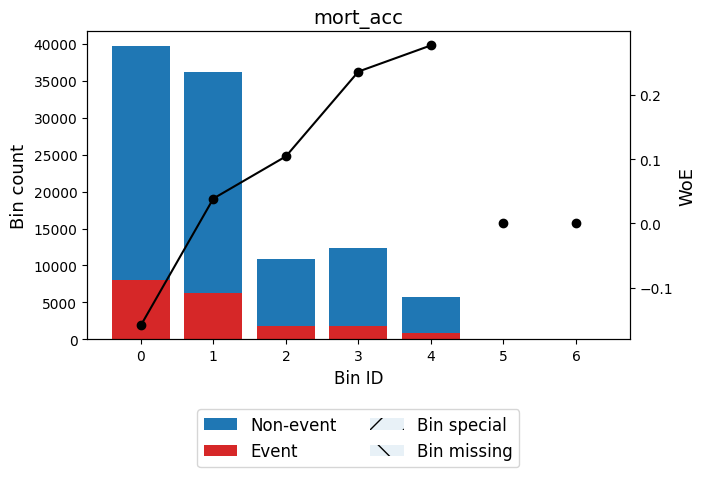


🔍 Feature: mths_since_recent_bc
✅ Total IV for mths_since_recent_bc: 0.0282
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   13533 │             0.2161 │ -0.2373711982265394  │ 0.00783685  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 7.50)   │   16970 │             0.1995 │ -0.1365090173020691  │ 0.00315072  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 10.50)  │   10220 │             0.191  │ -0.08258319998752084 │ 0.00068279  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10.50, 12.50) │    5991 │             0.1866 │ -0.05395296468768018 │ 0.000169294 │
├────────────────┼─────────┼────────────────────┼────

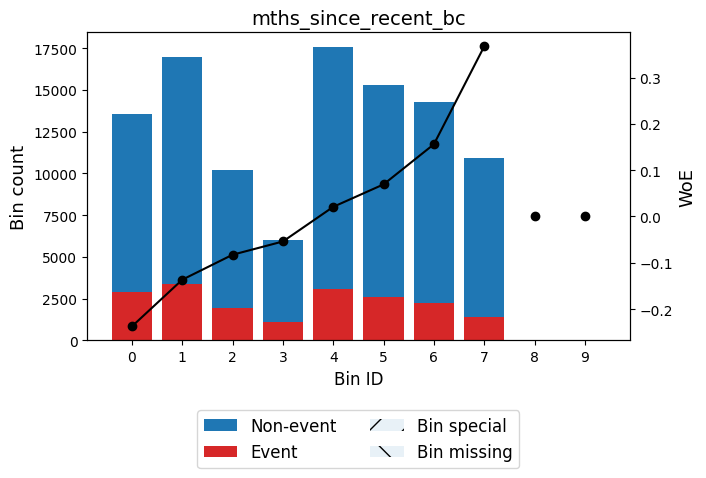


🔍 Feature: mths_since_recent_inq
✅ Total IV for mths_since_recent_inq: 0.0269
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50)  │    8180 │             0.2187 │ -0.2528874076745793  │ 0.00540183 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50)  │   10454 │             0.2132 │ -0.22049611156843807 │ 0.0051969  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50)  │    8124 │             0.2056 │ -0.17424488661503568 │ 0.00248647 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50)  │    7276 │             0.203  │ -0.1584488684710812  │ 0.00183248 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼

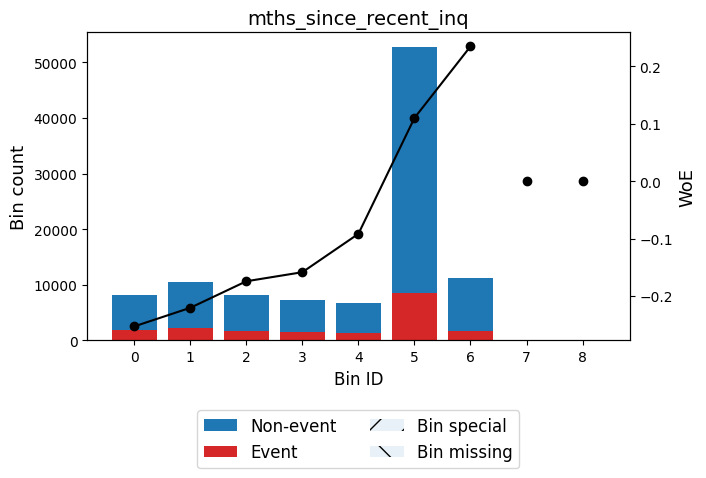


🔍 Feature: num_accts_ever_120_pd
✅ Total IV for num_accts_ever_120_pd: 0.0035
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   81603 │             0.1739 │ 0.03209372894523099  │ 0.000793733 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   23201 │             0.1949 │ -0.10795048362432214 │ 0.0026698   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─

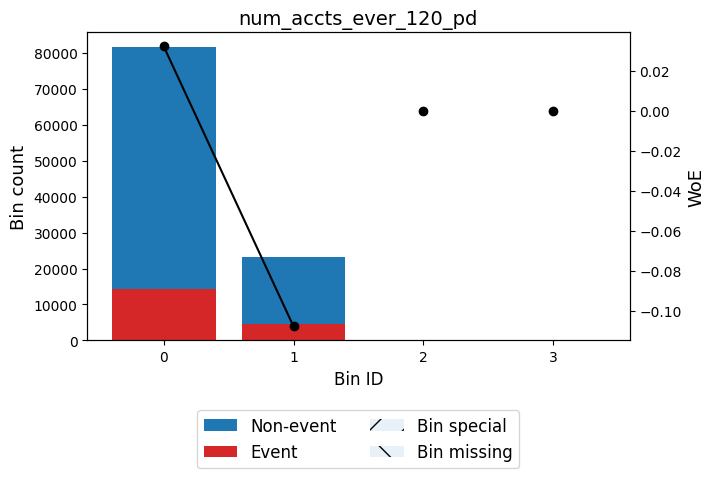


🔍 Feature: num_actv_bc_tl
✅ Total IV for num_actv_bc_tl: 0.0125
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   12449 │             0.1664 │ 0.08553524471595875  │ 0.000845298 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50) │   47696 │             0.1666 │ 0.08397084421178613  │ 0.00312281  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   16625 │             0.1833 │ -0.0318280179402588  │ 0.000162342 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 5.50) │   11305 │             0.1884 │ -0.0657609395968417  │ 0.000476373 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤


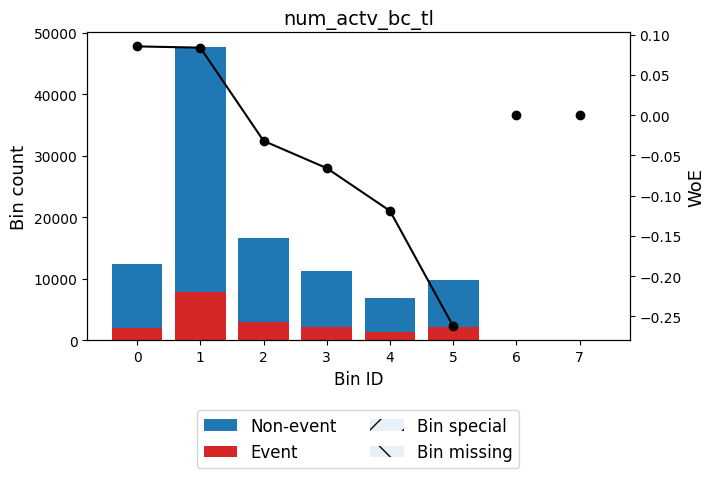


🔍 Feature: num_actv_rev_tl
✅ Total IV for num_actv_rev_tl: 0.0358
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   11650 │             0.1435 │ 0.26024080096019375   │ 0.00691124  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50)  │   13432 │             0.1555 │ 0.16579397718633482   │ 0.0033374   │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 5.50)  │   36000 │             0.1664 │ 0.08511763975322362   │ 0.00242095  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 6.50)  │   11855 │             0.1838 │ -0.03533881703084396  │ 0.000142871 │
├───────────────┼─────────┼────────────────────┼───────────────

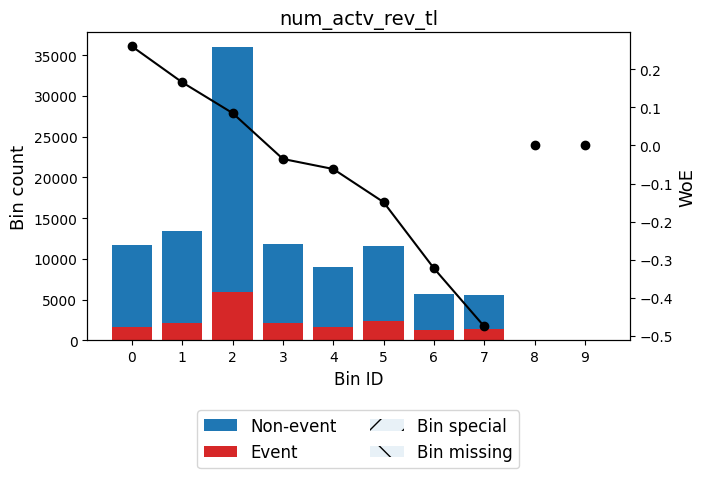


🔍 Feature: num_bc_sats
✅ Total IV for num_bc_sats: 0.0047
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │    7011 │             0.1823 │ -0.02517875584523943 │ 4.2754e-05  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50) │   31180 │             0.1735 │ 0.034840577989741384 │ 0.000357099 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   22204 │             0.1646 │ 0.09852597728148704  │ 0.00199193  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 6.50) │   23641 │             0.1851 │ -0.0442468428984899  │ 0.000447921 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.5

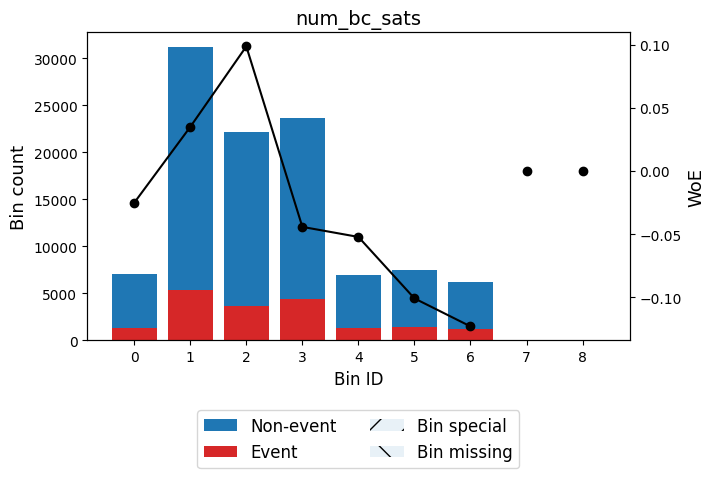


🔍 Feature: num_bc_tl
✅ Total IV for num_bc_tl: 0.0034
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)   │    5919 │             0.1921 │ -0.08965569954840813  │ 0.000467118 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50)   │    6862 │             0.183  │ -0.030215969119552488 │ 6.03603e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 6.50)   │   28084 │             0.1814 │ -0.019125391598317165 │ 9.86204e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)   │   15787 │             0.1615 │ 0.12126900248661054   │ 0.00212962  │
├────────────────┼─────────┼────────────────────┼────────────────

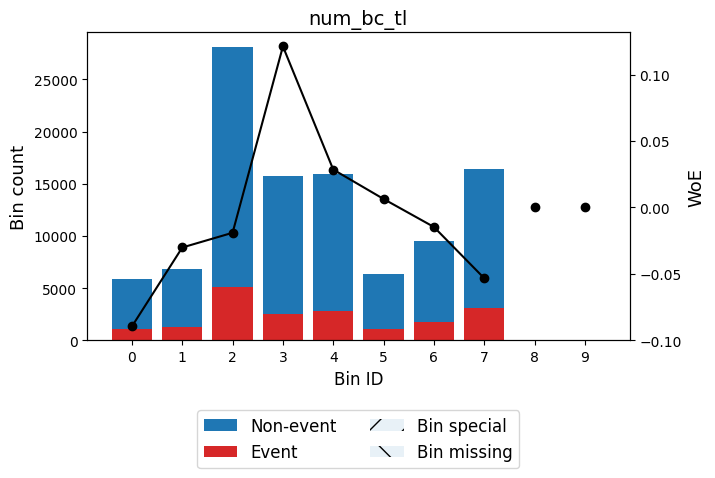


🔍 Feature: num_il_tl
✅ Total IV for num_il_tl: 0.0068
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 6.50)   │   48311 │             0.1732 │ 0.03720628109785662   │ 0.000630504 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)   │   13238 │             0.1592 │ 0.13834751987289495   │ 0.00231115  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 11.50)  │   19095 │             0.184  │ -0.036475325191165586 │ 0.000245252 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11.50, 17.50) │   13824 │             0.1887 │ -0.06783619199856172  │ 0.000620273 │
├────────────────┼─────────┼────────────────────┼────────────────

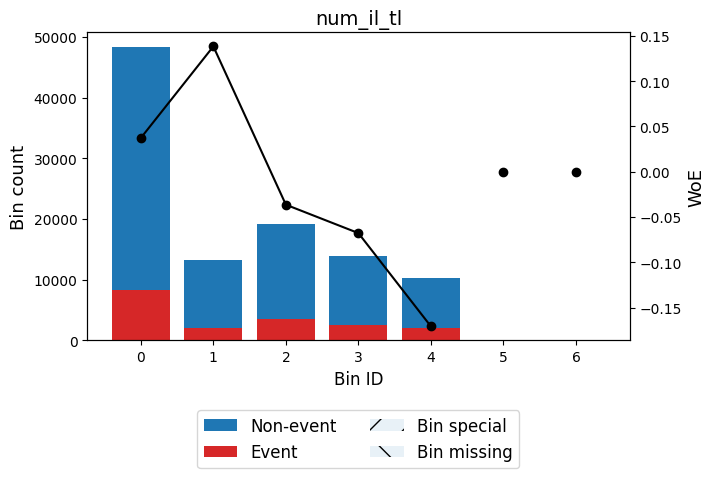


🔍 Feature: num_op_rev_tl
✅ Total IV for num_op_rev_tl: 0.0182
╒════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                    │          IV │
╞════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 3.50)   │    9014 │             0.1579 │ 0.14807466211077402    │ 0.00179701  │
├────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [3.50, 4.50)   │    8691 │             0.1582 │ 0.1454886455939428     │ 0.00167405  │
├────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [4.50, 7.50)   │   38284 │             0.1655 │ 0.09174057272687586    │ 0.00298432  │
├────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [7.50, 8.50)   │    9377 │             0.1788 │ -0.0019075077975756471 │ 3.2575e-07  │
├────────────────┼─────────┼───────────────────

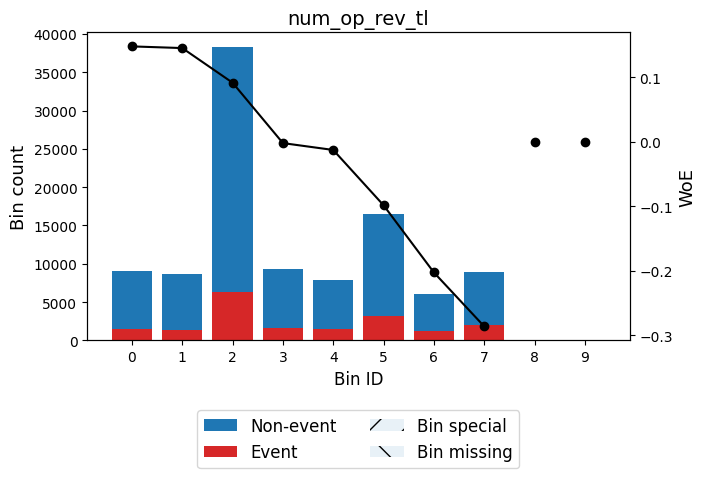


🔍 Feature: num_rev_accts
✅ Total IV for num_rev_accts: 0.0051
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 8.50)   │   21627 │             0.1746 │ 0.027272926966018796  │ 0.000152147 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [8.50, 12.50)  │   22295 │             0.1732 │ 0.03714921447323105   │ 0.000290084 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [12.50, 13.50) │   11950 │             0.16   │ 0.13210672278739044   │ 0.00190622  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13.50, 18.50) │   22335 │             0.182  │ -0.02327472642600048  │ 0.00011631  │
├────────────────┼─────────┼────────────────────┼────────

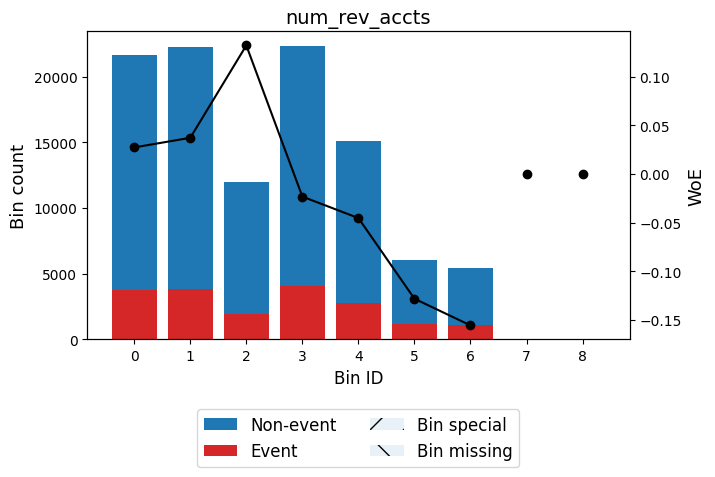


🔍 Feature: num_rev_tl_bal_gt_0
✅ Total IV for num_rev_tl_bal_gt_0: 0.0353
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   11656 │             0.1432 │ 0.2629382487651575   │ 0.00705251  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)  │   13512 │             0.1564 │ 0.1592955398045799   │ 0.00310592  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50)  │   36145 │             0.1665 │ 0.08434609989884767  │ 0.00238744  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 6.50)  │   11923 │             0.1854 │ -0.04620402137430868 │ 0.000246483 │
├───────────────┼─────────┼────────────────────┼─────────────────

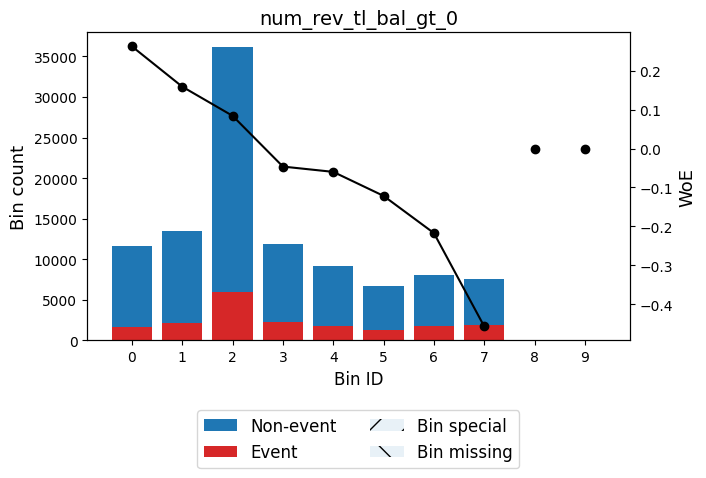


🔍 Feature: num_sats
✅ Total IV for num_sats: 0.0171
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 5.50)   │    8039 │             0.1443 │ 0.25393193360946187  │ 0.00455022  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 6.50)   │    6089 │             0.1577 │ 0.14961134911124452  │ 0.00123859  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.50, 7.50)   │    7569 │             0.1648 │ 0.09717359327938468  │ 0.000660797 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 11.50)  │   39450 │             0.1696 │ 0.06265304359710155  │ 0.00144795  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

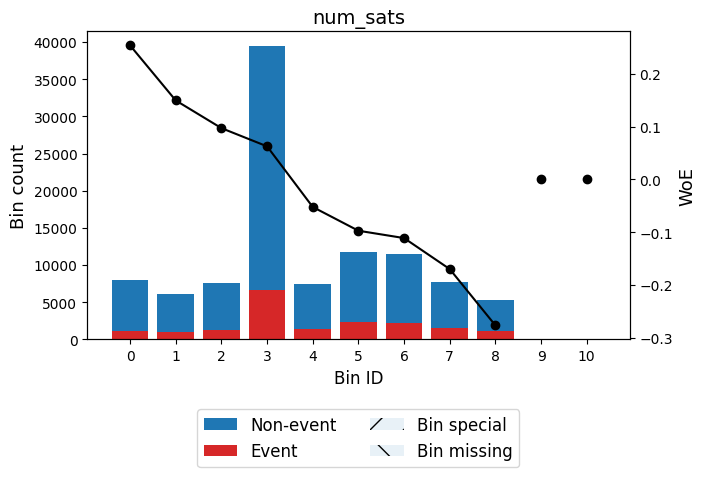


🔍 Feature: num_tl_120dpd_2m
✅ Total IV for num_tl_120dpd_2m: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


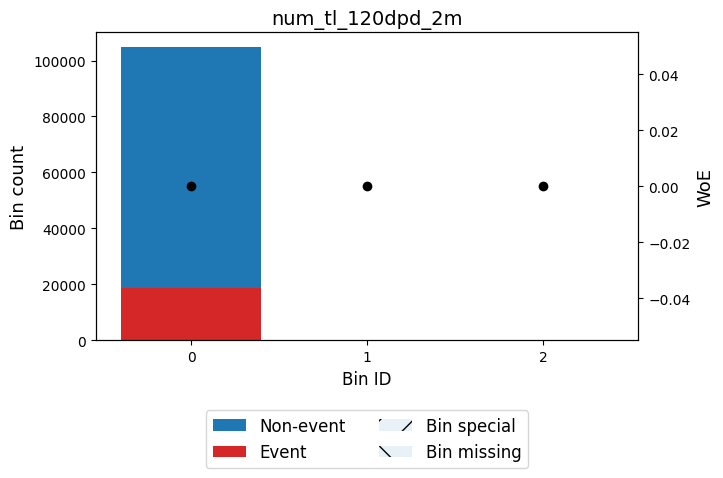


🔍 Feature: num_tl_30dpd
✅ Total IV for num_tl_30dpd: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


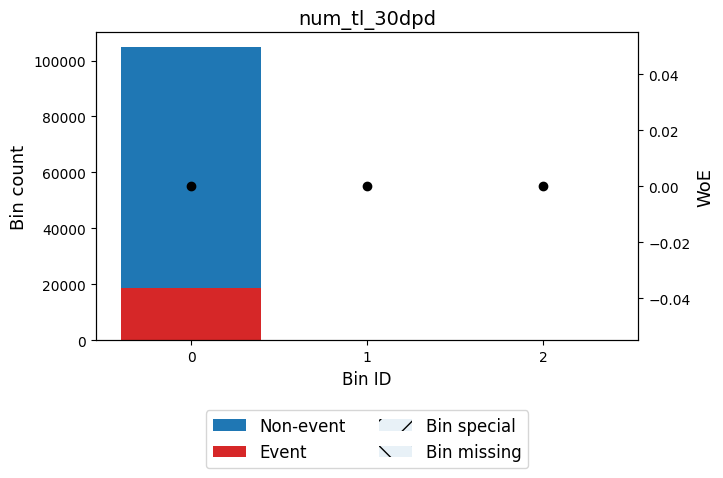


🔍 Feature: num_tl_90g_dpd_24m
✅ Total IV for num_tl_90g_dpd_24m: 0.0008
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   99030 │             0.1776 │ 0.006829472481352683 │ 4.39753e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │    5774 │             0.1957 │ -0.1127629227047462  │ 0.000726087 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────

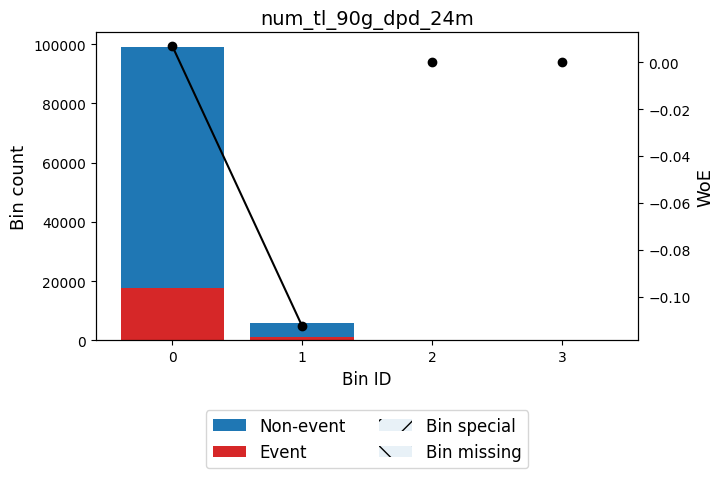


🔍 Feature: num_tl_op_past_12m
✅ Total IV for num_tl_op_past_12m: 0.0655
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   16652 │             0.1316 │ 0.36097595620318357  │ 0.0183727  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   24475 │             0.1527 │ 0.1872474814661902   │ 0.00770192 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   29117 │             0.169  │ 0.06630969446027568  │ 0.00119566 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50) │   16292 │             0.2096 │ -0.19848554907239913 │ 0.00651879 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [

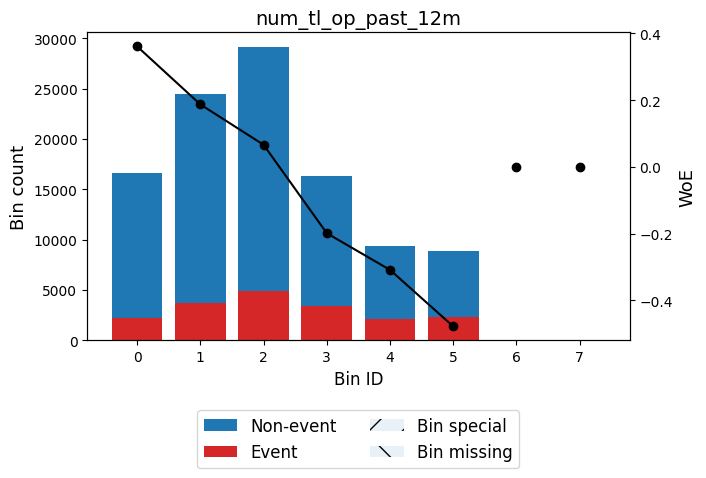


🔍 Feature: pct_tl_nvr_dlq
✅ Total IV for pct_tl_nvr_dlq: 0.0065
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 96.25)  │   42767 │             0.1878 │ -0.06196037668289489 │ 0.00159792  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [96.25, 97.75) │    6146 │             0.1856 │ -0.04758901192889664 │ 0.000134846 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [97.75, 97.85) │    6780 │             0.142  │ 0.272365178296494    │ 0.00438781  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [97.85, inf)   │   49111 │             0.1746 │ 0.02693557227269494  │ 0.000337041 │
├────────────────┼─────────┼────────────────────┼────────────────

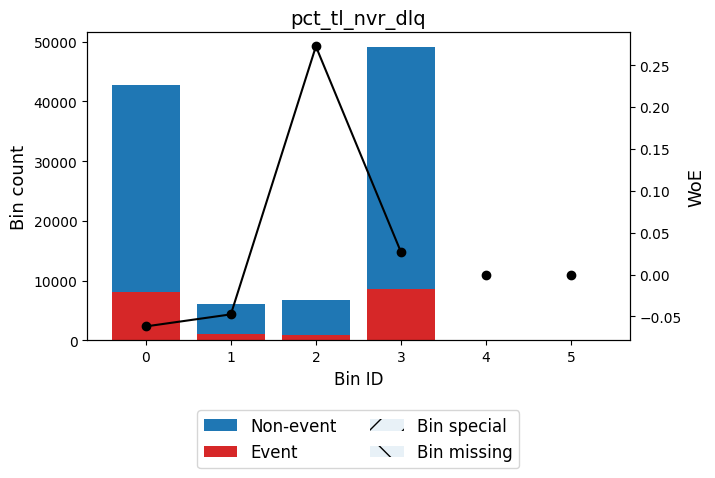


🔍 Feature: percent_bc_gt_75
✅ Total IV for percent_bc_gt_75: 0.0298
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 4.90)   │   21299 │             0.1422 │ 0.27090648452867305   │ 0.0136435   │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.90, 26.40)  │   13246 │             0.164  │ 0.10283026251294447   │ 0.00129257  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [26.40, 44.05) │   18220 │             0.1671 │ 0.0804214388171316    │ 0.00109547  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [44.05, 52.75) │   11977 │             0.1823 │ -0.025051478103823133 │ 7.22978e-05 │
├────────────────┼─────────┼────────────────────┼──

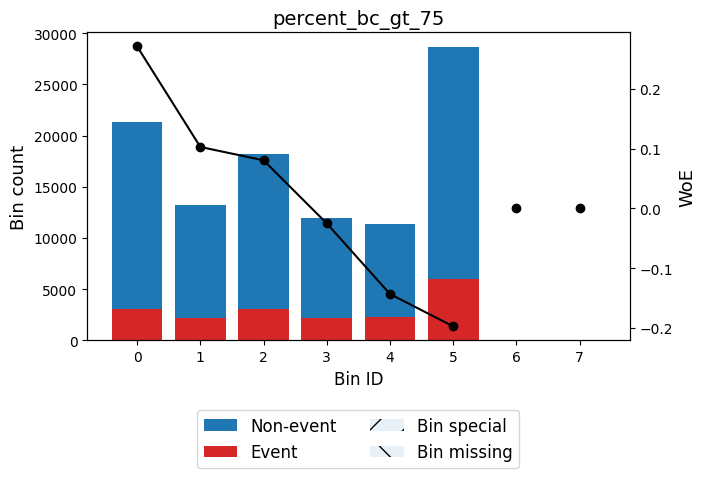


🔍 Feature: pub_rec_bankruptcies
✅ Total IV for pub_rec_bankruptcies: 0.0036
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   92574 │             0.1753 │ 0.022490862788275612 │ 0.000443585 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   12230 │             0.2034 │ -0.16064944019420535 │ 0.00316847  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

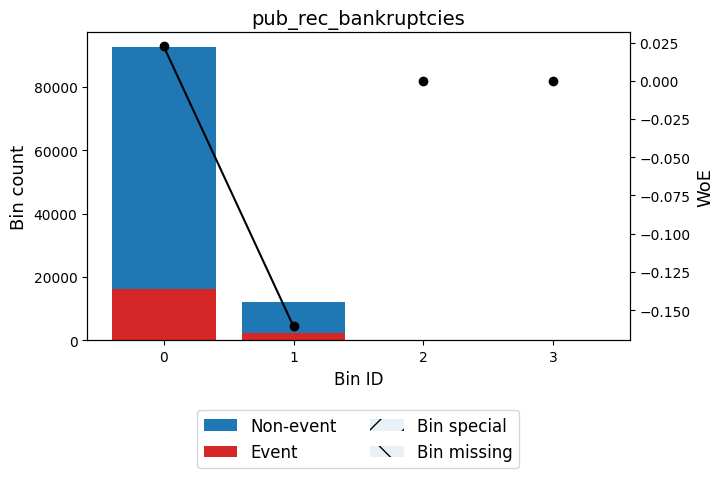


🔍 Feature: tax_liens
✅ Total IV for tax_liens: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


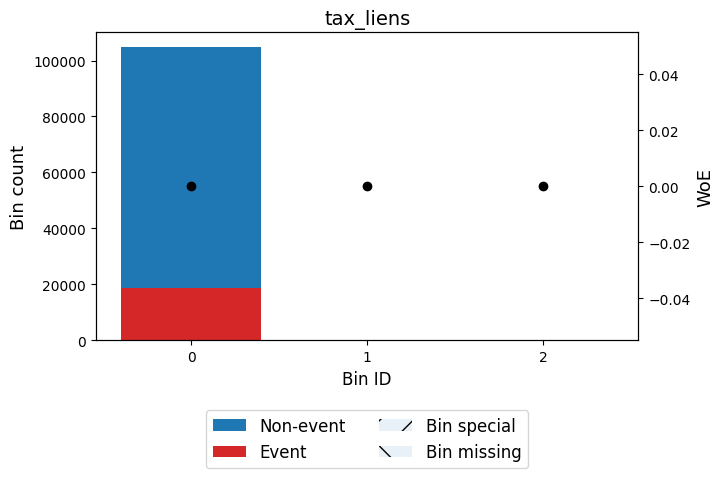


🔍 Feature: tot_hi_cred_lim
✅ Total IV for tot_hi_cred_lim: 0.0304
╒════════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 19793.50)       │    5250 │             0.1749 │ 0.025465863684248857  │ 3.22207e-05 │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [19793.50, 46920.50)   │   17579 │             0.1938 │ -0.10068530549174581  │ 0.00175573  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [46920.50, 63731.50)   │    9940 │             0.2129 │ -0.21845293507967867  │ 0.00484721  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [63731.50, 111203.50)  │   16075 │             0.2056 │ -0.17445915

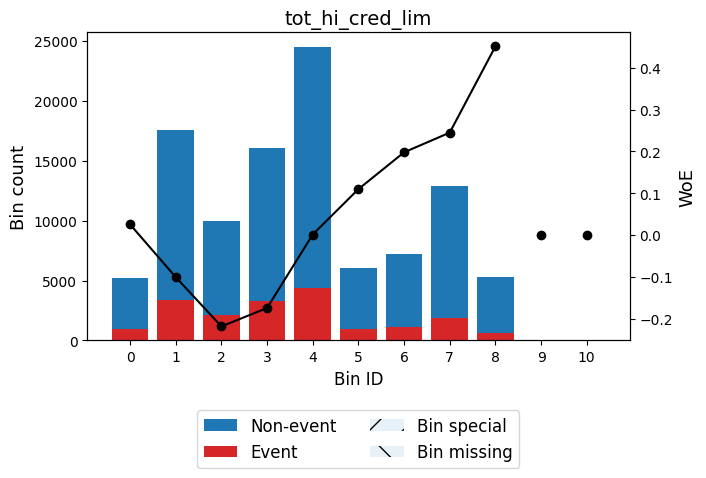


🔍 Feature: total_bal_ex_mort
✅ Total IV for total_bal_ex_mort: 0.0103
╒═══════════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                    │          IV │
╞═══════════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 9589.50)       │    7761 │             0.1446 │ 0.2517271888203758     │ 0.00432011  │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [9589.50, 18598.50)   │   13041 │             0.1634 │ 0.1069670929123574     │ 0.00137516  │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [18598.50, 40964.50)  │   38520 │             0.1748 │ 0.026095229933231323   │ 0.000248187 │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [40964.50, 45505.50)  │    5299 │             0.2032 │ -0.15999

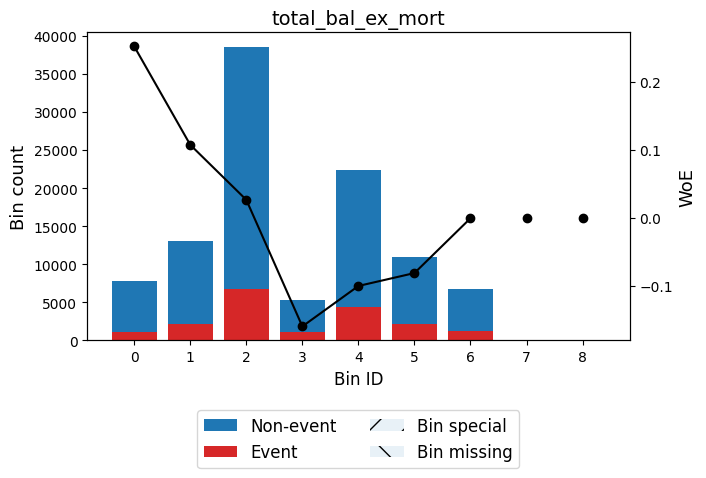


🔍 Feature: total_bc_limit
✅ Total IV for total_bc_limit: 0.0292
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2712.50)      │    6205 │             0.2131 │ -0.21950731016611336 │ 0.00305611  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2712.50, 4275.50)   │    5260 │             0.2067 │ -0.18090776034579892 │ 0.00173894  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4275.50, 11041.00)  │   26708 │             0.2001 │ -0.14038852757296283 │ 0.00525091  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11041.00, 14717.50) │   11629 │             0.1869 │ -0.05614644040473871 │ 0.000356125 │
├────

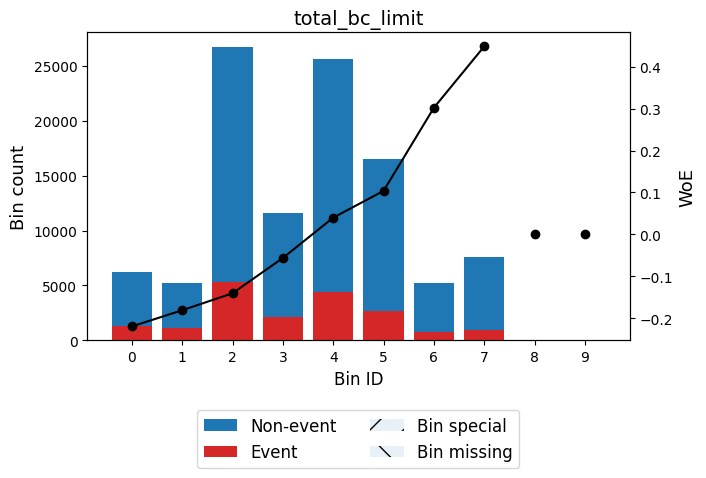


🔍 Feature: total_il_high_credit_limit
✅ Total IV for total_il_high_credit_limit: 0.0080
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 30337.50)     │   47869 │             0.1739 │ 0.03217500162385045   │ 0.000467959 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [30337.50, 31297.00) │    7756 │             0.1423 │ 0.26985625965963567   │ 0.00493154  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [31297.00, 41458.50) │   12045 │             0.1813 │ -0.018691828348608386 │ 4.03959e-05 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [41458.50, 73537.00) │   22112 │             0.1906 │ -0.079844

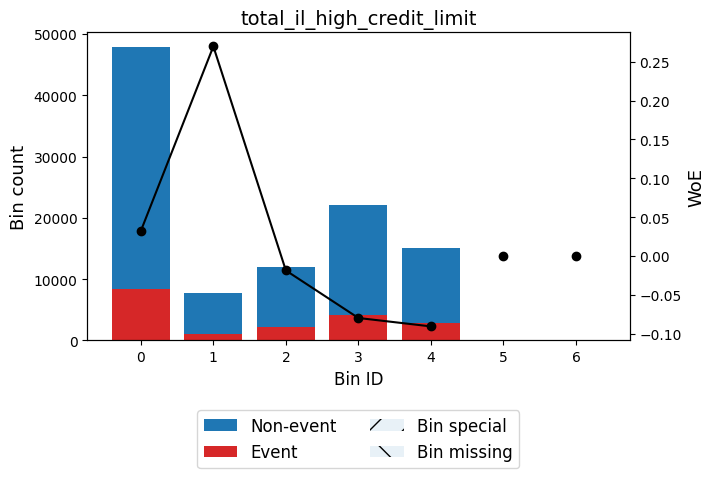


🔍 Feature: credit_history_years
✅ Total IV for credit_history_years: 0.0064
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 9.50)   │   17713 │             0.1845 │ -0.039951196895700036 │ 0.00027323  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, 10.50)  │    6425 │             0.2033 │ -0.16013127719493503  │ 0.00165356  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [10.50, 12.50) │   14606 │             0.1904 │ -0.07871599468997315  │ 0.000885482 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [12.50, 13.50) │    7438 │             0.1863 │ -0.05215445865774382  │ 0.000196292 │
├────────────────┼─────────┼───────────────

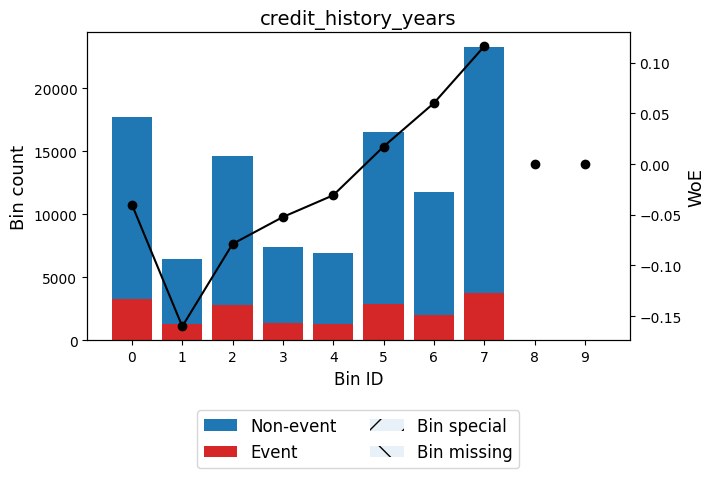


🔍 Feature: fico_score
✅ Total IV for fico_score: 0.1182
╒══════════════════╤═════════╤════════════════════╤═════════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                     │          IV │
╞══════════════════╪═════════╪════════════════════╪═════════════════════════╪═════════════╡
│ (-inf, 664.50)   │    9266 │             0.241  │ -0.37885396934828175    │ 0.0142558   │
├──────────────────┼─────────┼────────────────────┼─────────────────────────┼─────────────┤
│ [664.50, 669.50) │    9141 │             0.2319 │ -0.3286317844649511     │ 0.0104275   │
├──────────────────┼─────────┼────────────────────┼─────────────────────────┼─────────────┤
│ [669.50, 674.50) │    9350 │             0.219  │ -0.2548367777599583     │ 0.00627372  │
├──────────────────┼─────────┼────────────────────┼─────────────────────────┼─────────────┤
│ [674.50, 679.50) │    8279 │             0.2123 │ -0.21527041466806196    │ 0.00391664  │
├──────────────────┼───

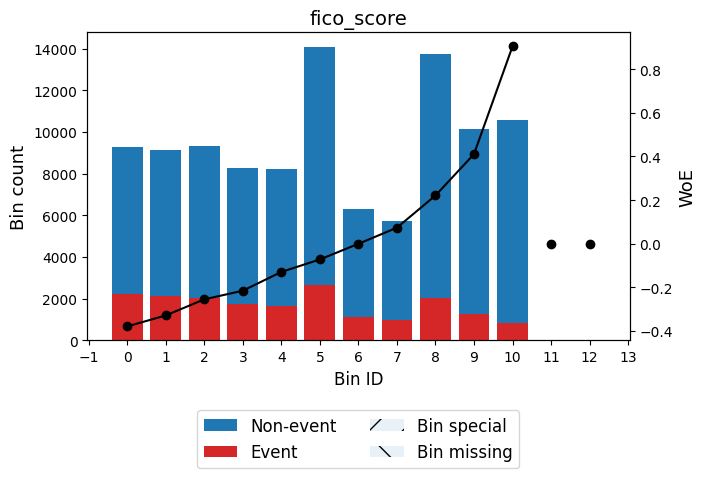


🔍 Feature: fico_score/delinq_2yrs_invalid
✅ Total IV for fico_score/delinq_2yrs_invalid: 0.0022
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   20355 │             0.1928 │ -0.09437877300133724 │ 0.00178274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────

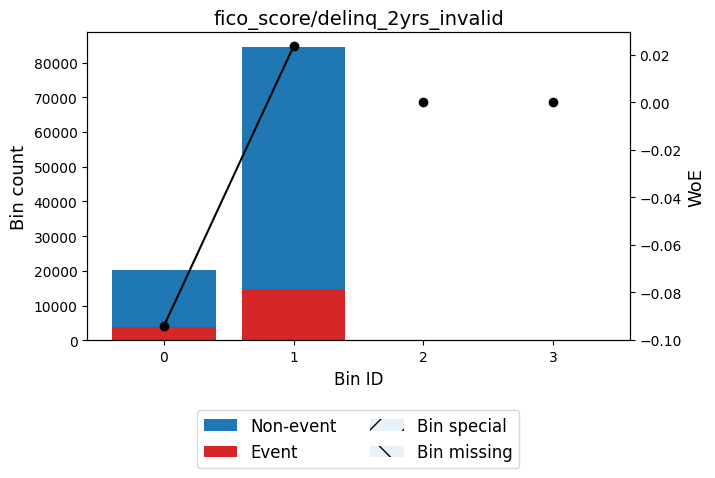


🔍 Feature: fico_score/delinq_2yrs
✅ Total IV for fico_score/delinq_2yrs: 0.0064
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 40.31)    │   84453 │             0.1751 │ 0.023678670051362927 │ 0.000448372 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40.31, 398.50)  │    6935 │             0.1993 │ -0.13531475690215    │ 0.00126468  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [398.50, 684.50) │    7610 │             0.2126 │ -0.21688692623752348 │ 0.00365623  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, inf)    │    5806 │             0.1593 │ 0.13719030455858028  │ 0.000997133 │
├──────────────────┼─────────

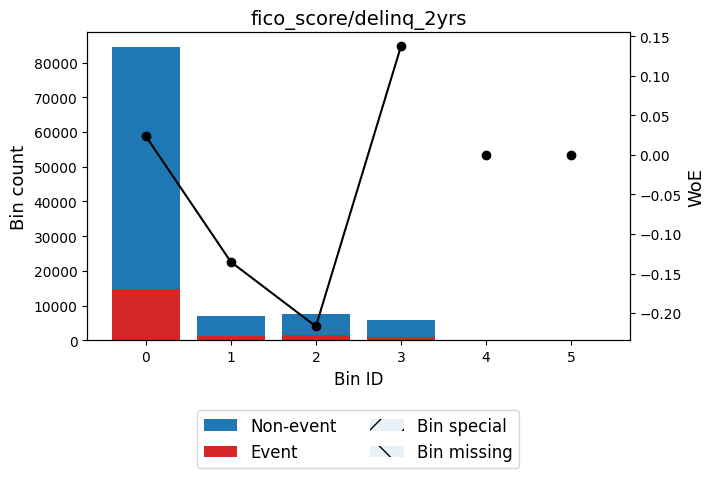


🔍 Feature: fico_score/acc_now_delinq_invalid
✅ Total IV for fico_score/acc_now_delinq_invalid: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


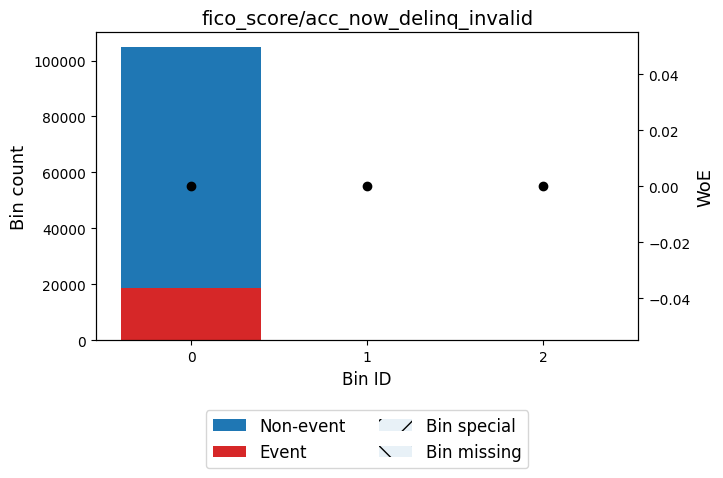


🔍 Feature: fico_score/acc_now_delinq
✅ Total IV for fico_score/acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


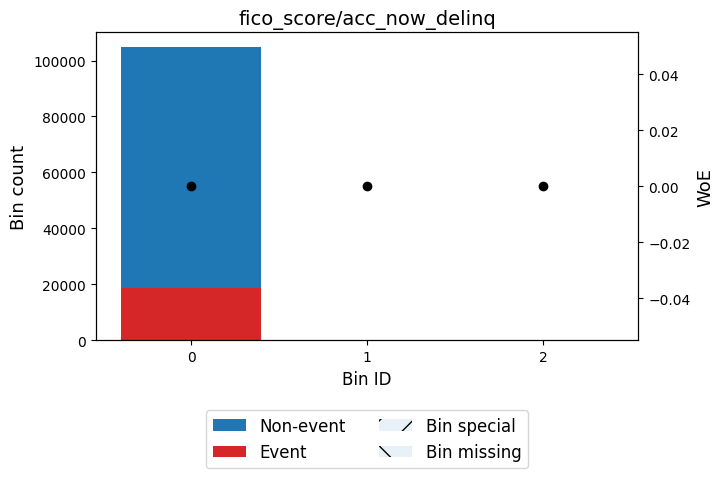


🔍 Feature: fico_score/inq_last_6mths_invalid
✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0233
╒══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │        IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 0.50) │   45407 │             0.2043 │ -0.1662650630220437 │ 0.0126225 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [0.50, inf)  │   59397 │             0.1589 │ 0.1402112562715041  │ 0.0106445 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────

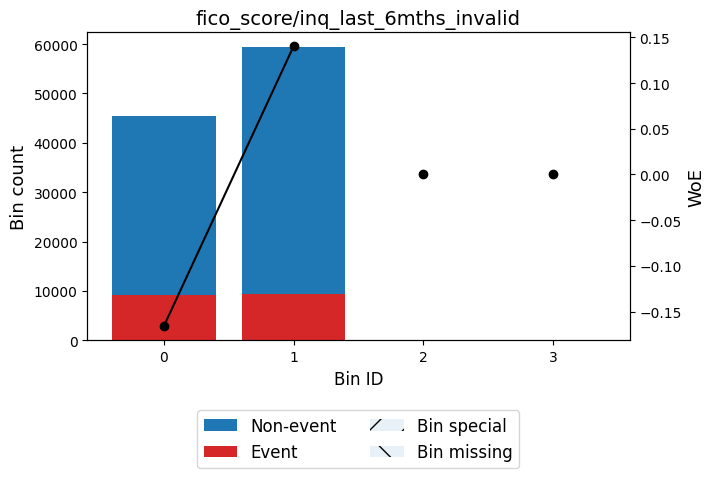


🔍 Feature: fico_score/inq_last_6mths
✅ Total IV for fico_score/inq_last_6mths: 0.0538
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 112.42)   │   59430 │             0.1589 │ 0.140367891525212    │ 0.0106737  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [112.42, 241.50) │    5269 │             0.2564 │ -0.4613850932718546  │ 0.0123104  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [241.50, 344.75) │    6519 │             0.2428 │ -0.38888784811193045 │ 0.0105986  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [344.75, 684.50) │   17811 │             0.216  │ -0.23726391265954438 │ 0.0103045  │
├──────────────────┼─────────┼───

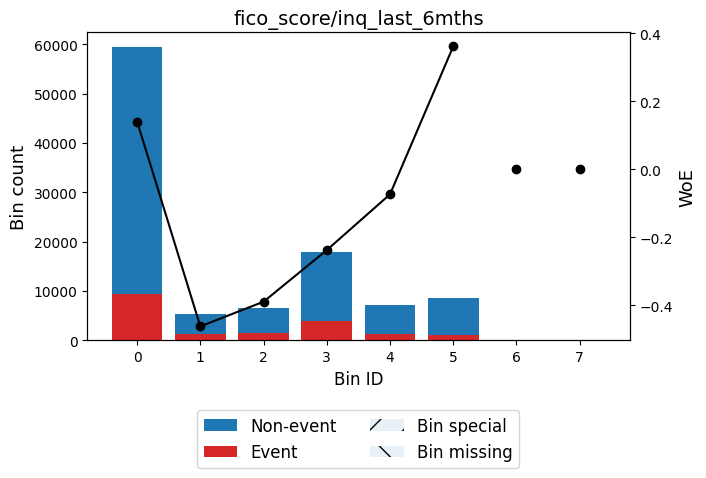


🔍 Feature: delinq_2yrs/credit_history_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: delinq_2yrs/credit_history
✅ Total IV for delinq_2yrs/credit_history: 0.0033
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.04) │   85962 │             0.1752 │ 0.023296084192024225  │ 0.000441809 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.04, 0.07) │    7435 │             0.1817 │ -0.021304038397157443 │ 3.24186e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.07, 0.12) │    5742 │             0.1968 │ -0.11967738413357853  │ 0.000815094 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.12, inf)  │    5665 │             0.2074 │ -0.1855

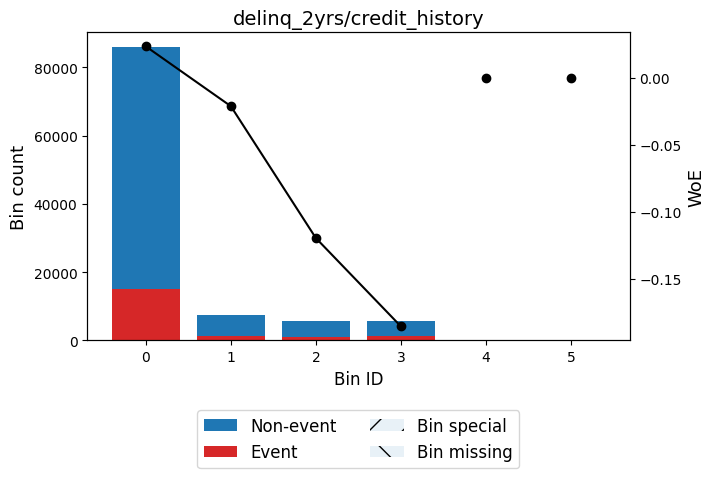


🔍 Feature: late_pymt_hist_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: late_pymt_hist
✅ Total IV for late_pymt_hist: 0.0042
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.06) │   86345 │             0.1741 │ 0.030776023063922908 │ 0.000772636 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.10) │    8292 │             0.2021 │ -0.1530403981546431  │ 0.00194496  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, inf)  │   10167 │             0.1973 │ -0.12289733286877991 │ 0.00152348  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────

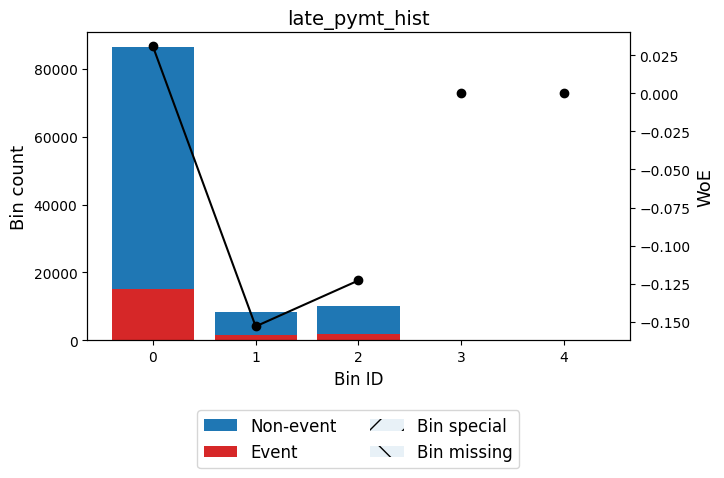


🔍 Feature: loan_amnt/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/annual_inc
✅ Total IV for loan_amnt/annual_inc: 0.1310
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.07) │    7839 │             0.1086 │ 0.5794161888644309    │ 0.0206834   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.07, 0.10) │    7883 │             0.1168 │ 0.4966406782999355    │ 0.0157208   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.10, 0.12) │    7350 │             0.1287 │ 0.38631415124858504   │ 0.00920852  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.12, 0.14) │    7284 │             0.1385 │ 0.3014923898302335    │ 0

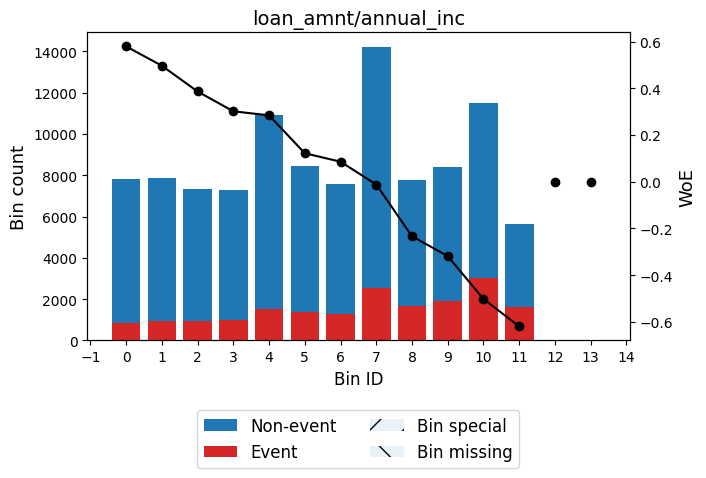


🔍 Feature: revol_util/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: revol_util/annual_inc
✅ Total IV for revol_util/annual_inc: 0.0473
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    6146 │             0.1176 │ 0.48887387086615375  │ 0.011908    │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │    9225 │             0.1345 │ 0.3354006789705508   │ 0.00886335  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │    8127 │             0.1486 │ 0.2191837971879087   │ 0.00346722  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   11470 │             0.1533 │ 0.1830640812380151   │ 0.003454

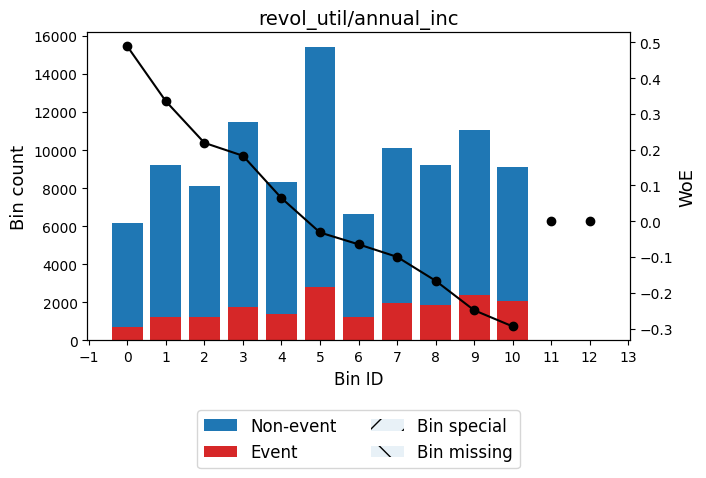


🔍 Feature: acc_op_past_24mths/total_acc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: acc_op_past_24mths/total_acc
✅ Total IV for acc_op_past_24mths/total_acc: 0.0686
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.04) │    6484 │             0.1144 │ 0.520092263697487    │ 0.0140676   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.07) │    6211 │             0.1232 │ 0.43663948559102694  │ 0.00977238  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.07, 0.11) │   13640 │             0.1408 │ 0.2828502442930343   │ 0.00948669  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.11, 0.12) │    5906 │             0.1551 │ 0.16905347

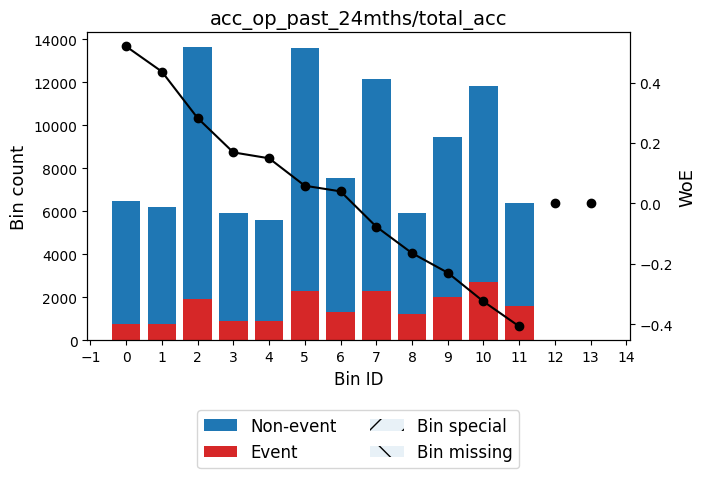


🔍 Feature: bc_open_to_buy/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/annual_inc
✅ Total IV for bc_open_to_buy/annual_inc: 0.0252
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5353 │             0.2341 │ -0.3406750560198113   │ 0.00658547  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.01) │    9948 │             0.2036 │ -0.1619211323915395   │ 0.00261926  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.01, 0.03) │   13203 │             0.195  │ -0.10847886003427454  │ 0.00153447  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.03, 0.04) │   10568 │             0.1911 │ -0.0835215

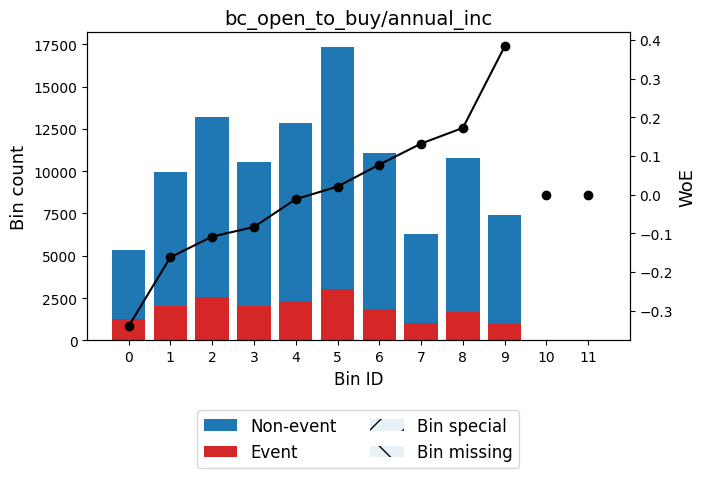


🔍 Feature: inq_last6mths_x_tl_op_past_12m
✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.50) │   63059 │             0.1589 │ 0.14020439288368314   │ 0.0112997   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.50, 1.50) │    5976 │             0.1596 │ 0.13479851445310187   │ 0.000991635 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼─────────────────

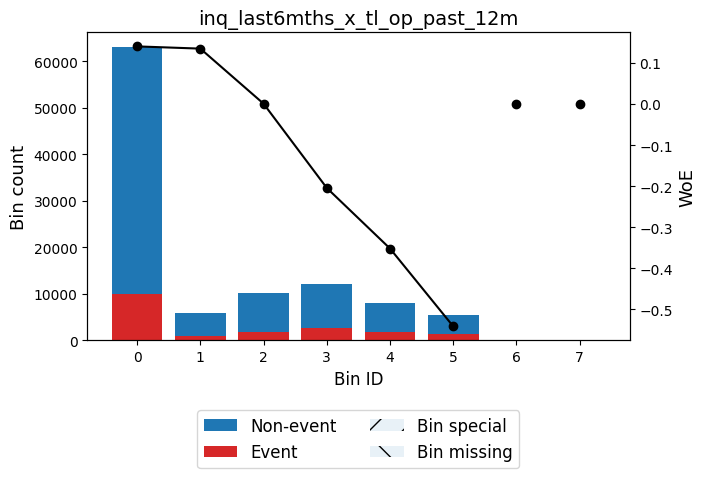


🔍 Feature: dti_x_revol_util
✅ Total IV for dti_x_revol_util: 0.0832
╒════════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                    │          IV │
╞════════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 163.02)     │    8083 │             0.1184 │ 0.481580600896685      │ 0.0152351   │
├────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [163.02, 296.60)   │    7210 │             0.1226 │ 0.44184498741180867    │ 0.0115957   │
├────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [296.60, 451.05)   │    9634 │             0.1353 │ 0.3291928450339221     │ 0.00893555  │
├────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [451.05, 536.59)   │    5492 │             0.1444 │ 0.2531604236518257     │ 0.00309051  │
├

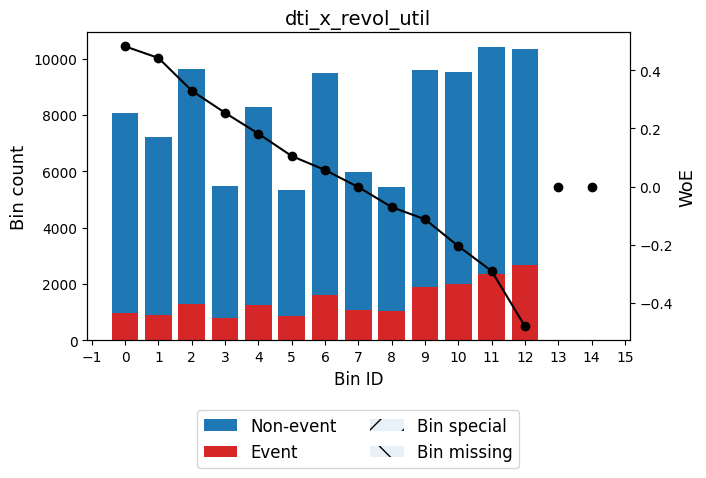


🔍 Feature: avail_ratio
✅ Total IV for avail_ratio: 0.0277
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, -96.85)   │    5422 │             0.2438 │ -0.3942801215353744  │ 0.00907543  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-96.85, -91.15) │   10420 │             0.2063 │ -0.17895468692011351 │ 0.00336882  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-91.15, -77.95) │   17792 │             0.1942 │ -0.10345934852537653 │ 0.00187791  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-77.95, -73.65) │    5269 │             0.1913 │ -0.08458564894754383 │ 0.00036953  │
├──────────────────┼─────────┼────────────────────┼

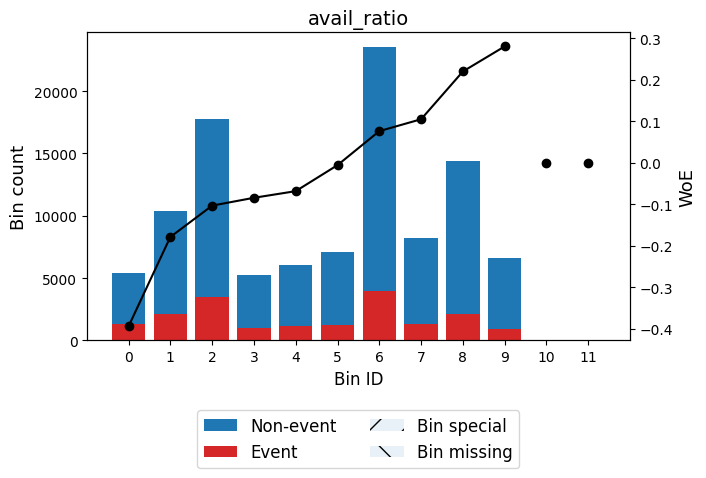


🔍 Feature: delinq2yrs_flag
✅ Total IV for delinq2yrs_flag: 0.0022
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   20355 │             0.1928 │ -0.09437877300133724 │ 0.00178274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

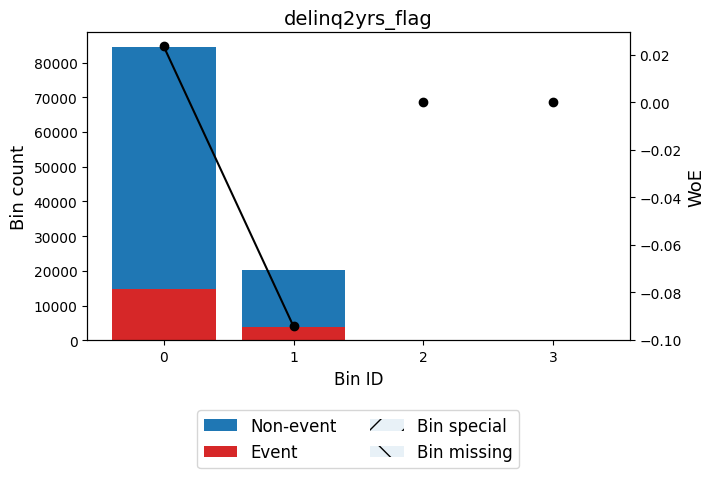


🔍 Feature: pubrec_flag
✅ Total IV for pubrec_flag: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87730 │             0.1735 │ 0.034913284973516534 │ 0.00100893 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17074 │             0.2046 │ -0.16821056251890565 │ 0.00486098 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │ 

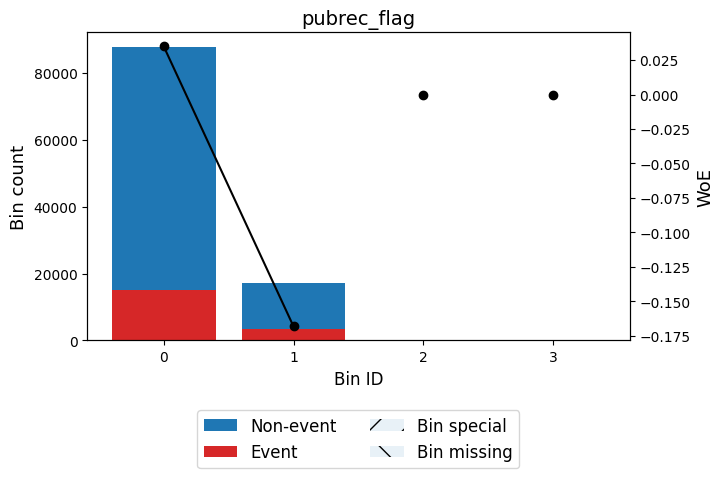


🔍 Feature: acc_now_delinq_flag
✅ Total IV for acc_now_delinq_flag: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


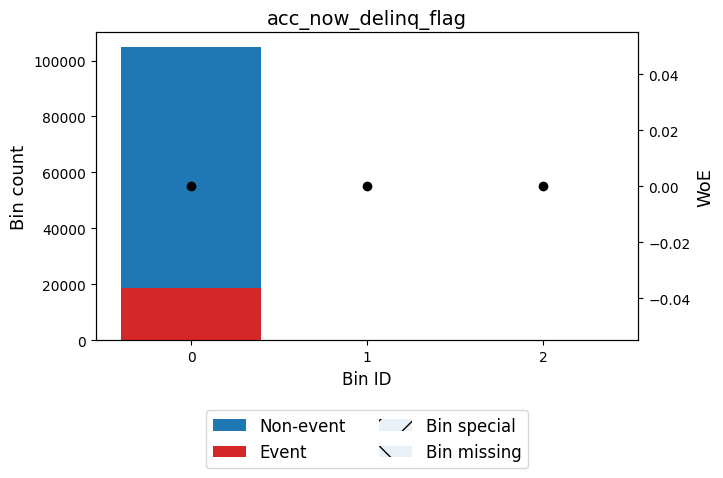


🔍 Feature: tl_op12m_x_inq6m
✅ Total IV for tl_op12m_x_inq6m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.50) │   63059 │             0.1589 │ 0.14020439288368314   │ 0.0112997   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.50, 1.50) │    5976 │             0.1596 │ 0.13479851445310187   │ 0.000991635 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼

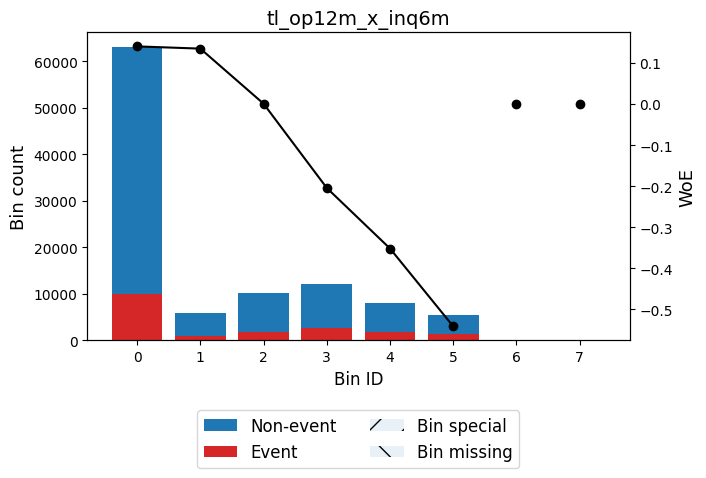


🔍 Feature: dti_x_inq
✅ Total IV for dti_x_inq: 0.0581
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 11.44)  │   66656 │             0.1564 │ 0.15936751661064052  │ 0.0153353   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.44, 15.48) │    5623 │             0.1666 │ 0.08352998301317682  │ 0.000364353 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.48, 19.35) │    5629 │             0.1833 │ -0.03221610405142217 │ 5.63225e-05 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [19.35, 23.56) │    5591 │             0.193  │ -0.0954155258963818  │ 0.000500655 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───

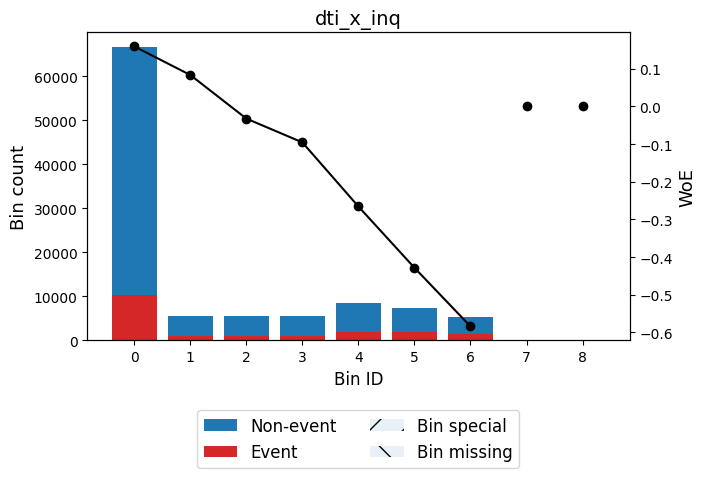


🔍 Feature: dti_x_term
✅ Total IV for dti_x_term: 0.2288
╒════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 261.66)     │    8907 │             0.1031 │ 0.6375021300454096    │ 0.0278869   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [261.66, 426.42)   │   13604 │             0.1099 │ 0.5657014171134374    │ 0.0343768   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [426.42, 549.90)   │   13331 │             0.1302 │ 0.3728690006531945    │ 0.0156306   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [549.90, 653.58)   │   11368 │             0.1442 │ 0.25490346241545603   │ 0.00648172  │
├────────────────────┼─

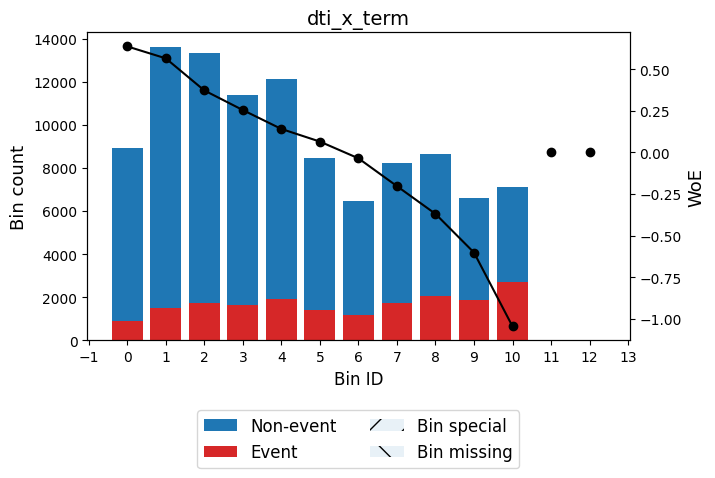


🔍 Feature: term_x_revol_util
✅ Total IV for term_x_revol_util: 0.1246
╒════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 582.60)     │    6828 │             0.1134 │ 0.530781262175795     │ 0.0153727   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [582.60, 877.20)   │    5609 │             0.1323 │ 0.3547624128499318    │ 0.00598995  │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [877.20, 1145.40)  │    6866 │             0.1356 │ 0.3262416759505593    │ 0.00626078  │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1145.40, 1369.80) │    6772 │             0.1421 │ 0.27220004536410847   │ 0.00437756  │
├────────

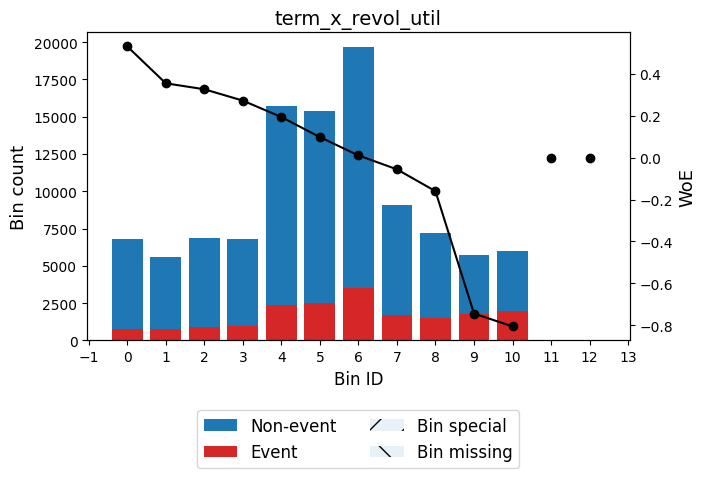


🔍 Feature: dti/fico_ratio_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: dti/fico_ratio
✅ Total IV for dti/fico_ratio: 0.1127
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.01) │    7646 │             0.112  │ 0.5448144905948578   │ 0.0180496   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.01) │    8634 │             0.1209 │ 0.4576507481309495   │ 0.0148171   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.02) │    6737 │             0.1248 │ 0.4213164200800825   │ 0.00992067  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.02) │    9153 │             0.1386 │ 0.3004848467420811   │ 0.00714204  │
├──────────────

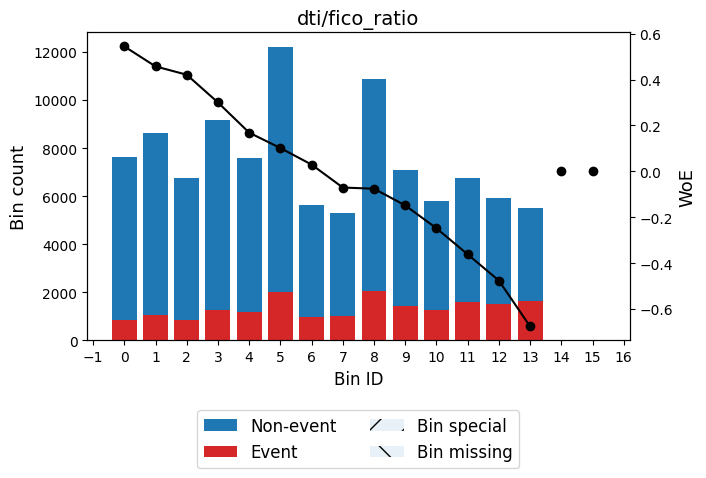


🔍 Feature: loan_amnt/tot_hi_cred_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/tot_hi_cred_lim
✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0721
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.03) │    8417 │             0.1103 │ 0.5620374696470245    │ 0.0210212   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.03, 0.04) │    7721 │             0.1249 │ 0.42112163512548695   │ 0.0113599   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.04, 0.06) │   10727 │             0.1356 │ 0.3258718515978529    │ 0.0097605   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.06, 0.07) │    5653 │             0.1535 │ 0.18092823

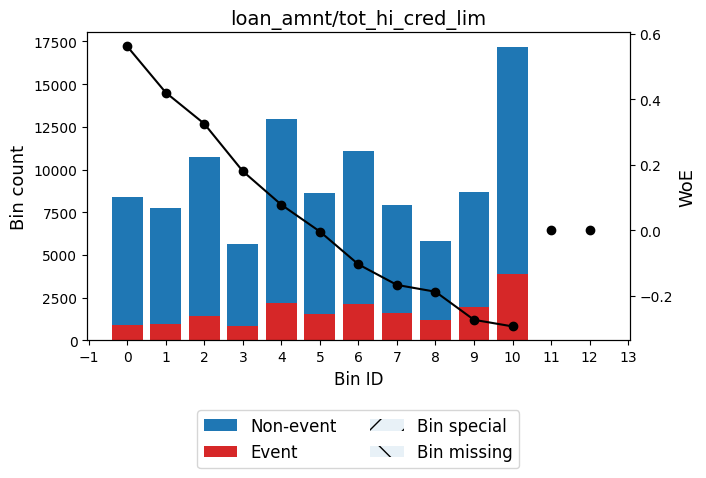


🔍 Feature: bc_open_to_buy/total_rev_hi_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/total_rev_hi_lim
✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0406
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.01) │    6277 │             0.241  │ -0.37912813712930715 │ 0.00967199  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.03) │    6069 │             0.2101 │ -0.20170239641433896 │ 0.00251017  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.10) │   18273 │             0.204  │ -0.1644089325809146  │ 0.004964    │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, 0.13) │    5552 │             0.1972 │ -

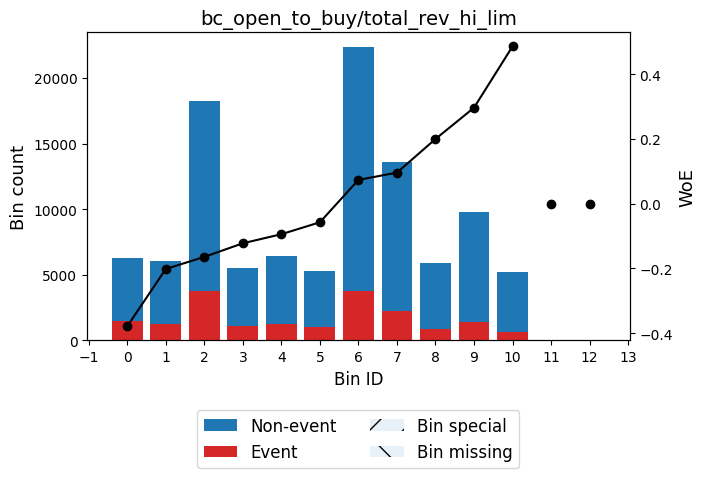


🔍 Feature: fico_score/int_rate_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: fico_score/int_rate
✅ Total IV for fico_score/int_rate: 0.4643
╒═════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 33.89)   │    7586 │             0.3894 │ -1.076292797654636    │ 0.111984    │
├─────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [33.89, 37.96)  │    7681 │             0.3131 │ -0.7405030225187984   │ 0.0497831   │
├─────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [37.96, 40.76)  │    5827 │             0.2727 │ -0.5451347815246135   │ 0.0194516   │
├─────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [40.76, 43.47)  │    5403 │             0.2408 

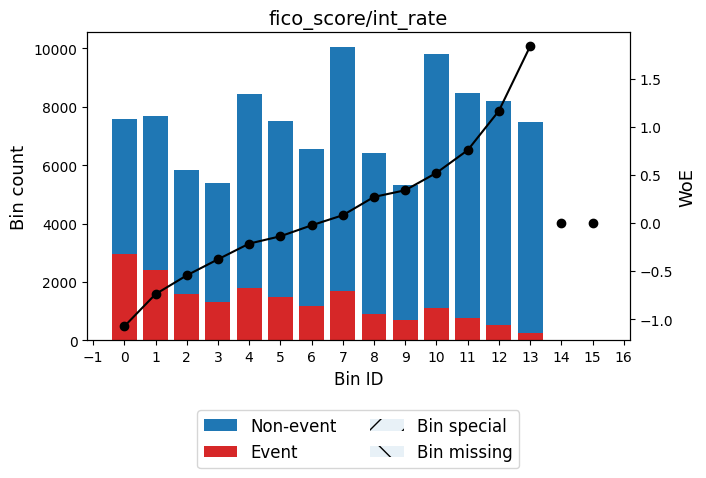


🔍 Feature: installment/annual_inc/12
✅ Total IV for installment/annual_inc/12: 0.0944
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.02) │    5313 │             0.1071 │ 0.5946341527350887   │ 0.0146875   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.03) │    5288 │             0.1114 │ 0.550557461635087    │ 0.0127226   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.04) │   11558 │             0.1315 │ 0.3615462025584151   │ 0.0127902   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.05) │    6705 │             0.1374 │ 0.3112693737671517   │ 0.00559383  │
├──────────────┼─────────┼────────────────────┼────────────────

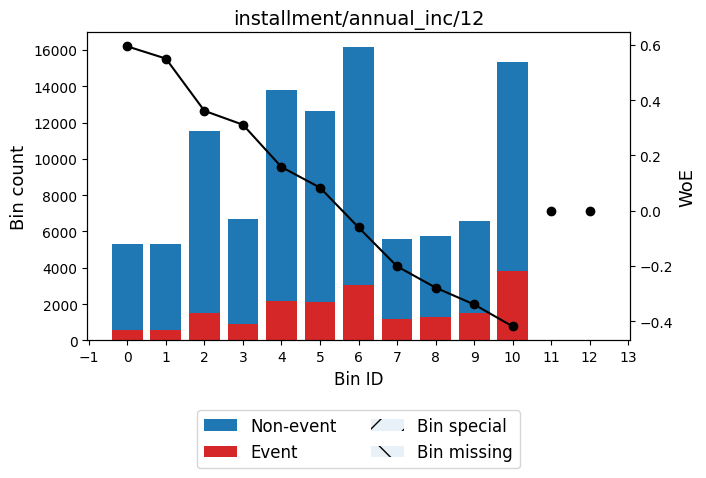


🔍 Feature: installment/annual_inc/12_x_term
✅ Total IV for installment/annual_inc/12_x_term: 0.2242
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.08) │    9865 │             0.1028 │ 0.6405061880016065    │ 0.0311459   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.08, 1.82) │   15839 │             0.115  │ 0.5142147260270122    │ 0.0336593   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.82, 2.41) │   13950 │             0.1315 │ 0.36190616551457566   │ 0.015466    │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.41, 2.84) │    9739 │             0.1438 │ 0.25834971466749335   │ 0.0056975   │
├──────────────┼─────────┼─────────────

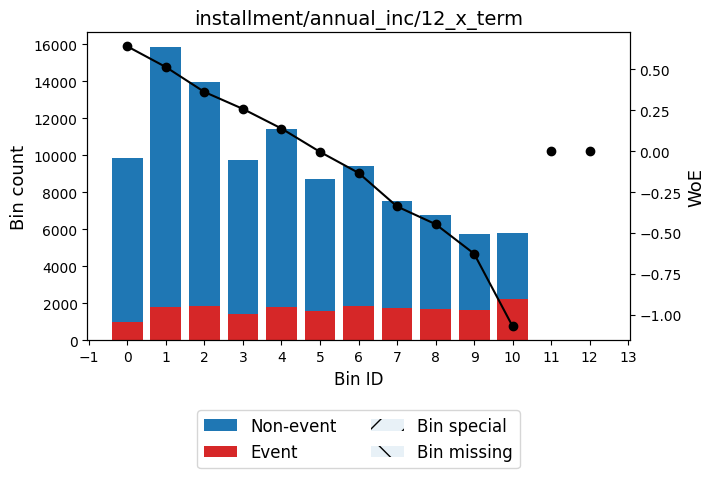

✅ Total IV for grade_numeric: 0.4525
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 1.50) │   18877 │             0.0546 │ 1.325128834626995   │ 0.201688   │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1.50, 2.50) │   31160 │             0.1206 │ 0.4609103760436568  │ 0.0541789  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [2.50, 3.50) │   28917 │             0.2002 │ -0.1412528792558112 │ 0.00575698 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [3.50, 4.50) │   15265 │             0.2702 │ -0.5326451391036483 │ 0.0484834  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.50, inf)  │   10585 │             0.3789 │ -1

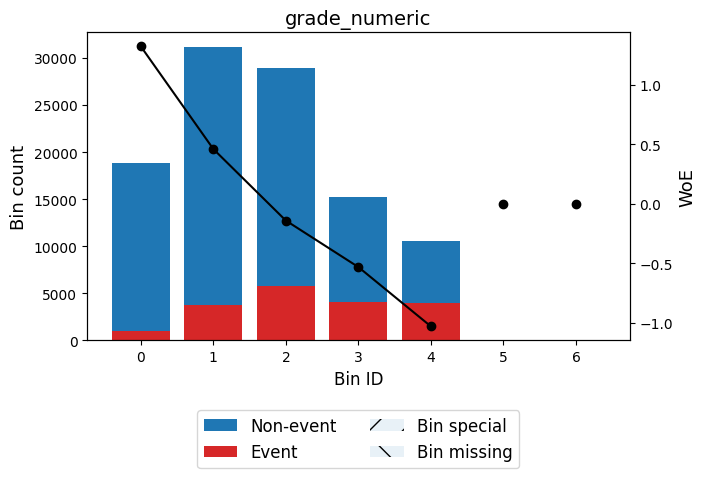

In [45]:
# ========================================== Train - Test Split ==========================================
numerical_cols1 = get_numerical_cols(df1, TARGET_COL)

train_df1 , test_df1 = sample_split_order(initial_df=df1, sample_frac=0.1, cut_off_date=CUT_DATE, date_col='issue_d')

# == Observe IV of Numerical Variables == 
for feature in numerical_cols1:
    if feature == "id":
        continue

    print(f"\n🔍 Feature: {feature}")

    if train_df1[feature].nunique() < 2:
        print("⚠️ Not enough variation. Skipping.")
        iv_categories["no_variation"].append(feature)
        continue

    x, y = train_df1[feature], train_df1[TARGET_COL]
    first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto')

    
train_df1 = tx_grade(train_df1)

first_bin_and_classify_feature('grade_numeric', train_df1['grade_numeric'], train_df1[TARGET_COL], dtype='numerical',monotonic_trend_type='auto' )


### 2.2 Categorical Features IV 

✅ Total IV for home_ownership: 0.0191
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ ['MORTGAGE']     │   52035 │             0.1595 │ 0.13577182825312417  │ 0.00875683  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['OWN']          │   10814 │             0.1765 │ 0.013912018181872599 │ 1.98813e-05 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['OTHER' 'RENT'] │   41955 │             0.2027 │ -0.1567237930897296  │ 0.0103321   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special          │       0 │             0      │ 0.0                  │ 0           │
├──────────────────┼─────────┼────────────────────┼─────────────────────

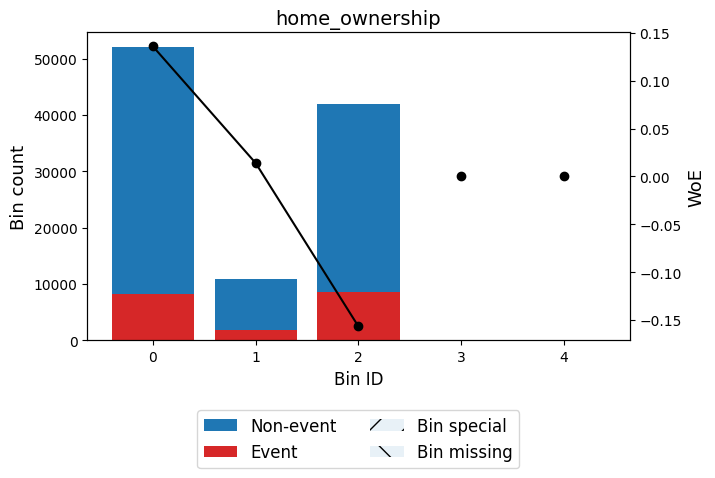

✅ Total IV for verification_status: 0.0523
╒═════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                 │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ ['Not Verified']    │   31272 │             0.131  │ 0.36592108062639706  │ 0.0353959  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Source Verified'] │   40129 │             0.1879 │ -0.06269531681687956 │ 0.00153549 │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Verified']        │   33403 │             0.2118 │ -0.21205578570440453 │ 0.0153188  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special             │       0 │             0      │ 0.0                  │ 0          │
├─────────────────────┼─────────┼──────────────

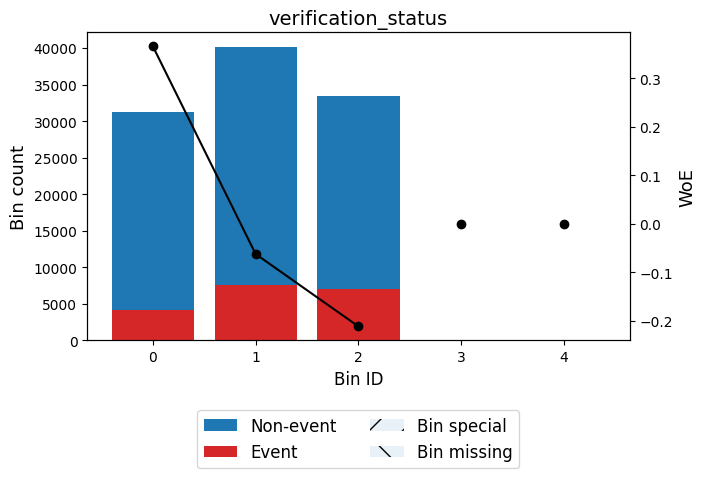

✅ Total IV for initial_list_status: 0.0005
╒═════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin     │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ ['f']   │   48197 │             0.175  │ 0.024256915944856905  │ 0.000268484 │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ ['w']   │   56607 │             0.1816 │ -0.020358927477206246 │ 0.00022534  │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Special │       0 │             0      │ 0.0                   │ 0           │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Missing │       0 │             0      │ 0.0                   │ 0           │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│         │  104804 │             0.1786 │                       │

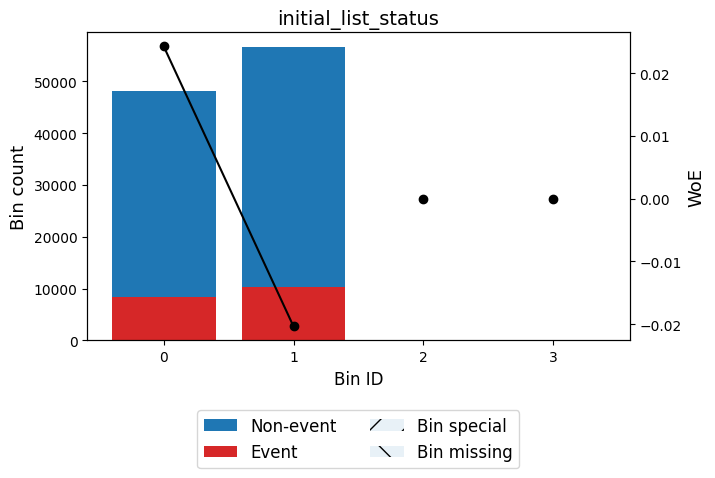

✅ Total IV for application_type: 0.0000
╒════════════════════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin                        │   Count │   Default Rate (%) │ WOE   │   IV │
╞════════════════════════════╪═════════╪════════════════════╪═══════╪══════╡
│ ['Individual' 'Joint App'] │  104804 │             0.1786 │ 0.0   │    0 │
├────────────────────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special                    │       0 │             0      │ 0.0   │    0 │
├────────────────────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing                    │       0 │             0      │ 0.0   │    0 │
├────────────────────────────┼─────────┼────────────────────┼───────┼──────┤
│                            │  104804 │             0.1786 │       │    0 │
╘════════════════════════════╧═════════╧════════════════════╧═══════╧══════╛


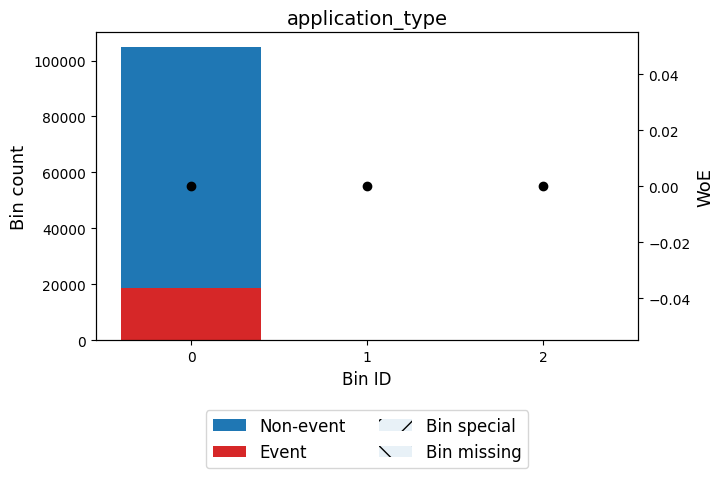

In [46]:
# == Observe IV of Categorical Variables == 
categorical_features = get_categorical_cols(df1, TARGET_COL)

for feat in categorical_features: 
    if feat != 'grade': 
        first_bin_and_classify_feature(feat, train_df1[feat], train_df1[TARGET_COL], dtype='categorical', monotonic_trend_type='auto')


### 2.3 Feature Importance Rankings

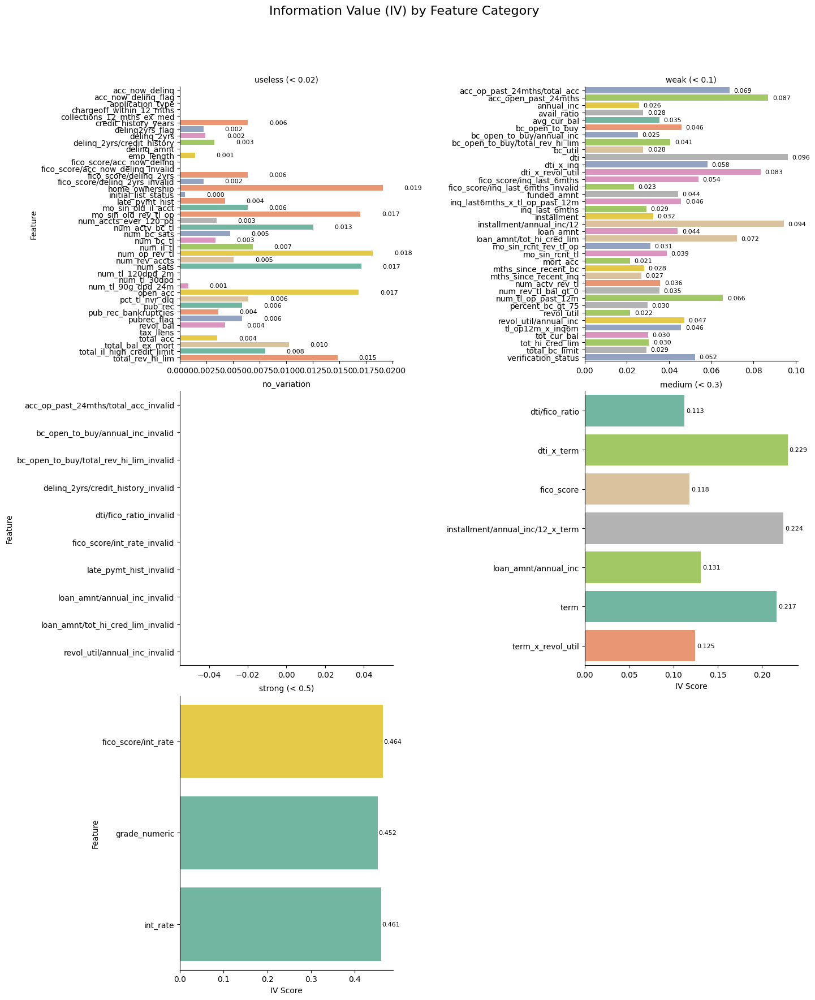

In [47]:
plot_iv_by_category(iv_categories)

train_pdf has 104812 rows, 102 columns
test_pdf has 25536 rows, 102 columns

🔍 Feature: loan_amnt
✅ Total IV for loan_amnt: 0.0425
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3512.50)      │    5505 │             0.1328 │ 0.3547292388981622   │ 0.00587858  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3512.50, 6012.50)   │   13137 │             0.1414 │ 0.2816448410152983   │ 0.00906359  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6012.50, 9037.50)   │   13853 │             0.1424 │ 0.2740951210448719   │ 0.00907497  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9037.50, 10012.50)  │    9881

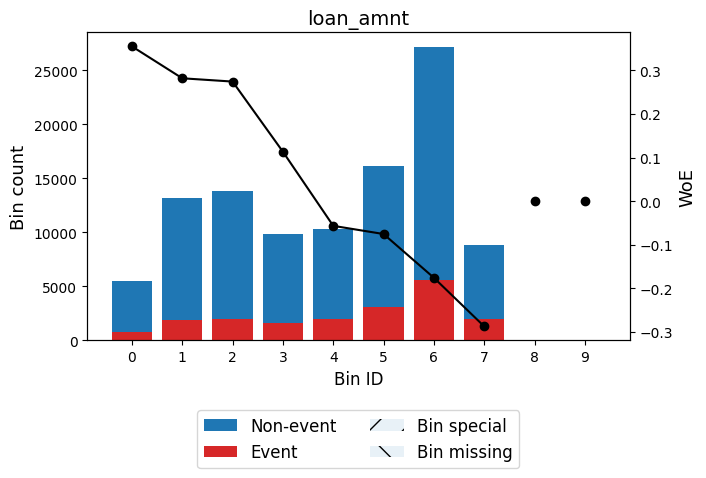


🔍 Feature: funded_amnt
✅ Total IV for funded_amnt: 0.0426
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3512.50)      │    5508 │             0.1327 │ 0.35535744538934844  │ 0.00590139  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3512.50, 6012.50)   │   13145 │             0.1413 │ 0.2823538723310077   │ 0.00911267  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6012.50, 9037.50)   │   13861 │             0.1424 │ 0.2735863167363628   │ 0.00904807  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9037.50, 10012.50)  │    9879 │             0.1632 │ 0.11299893393526705  │ 0.00116022  │
├──────────

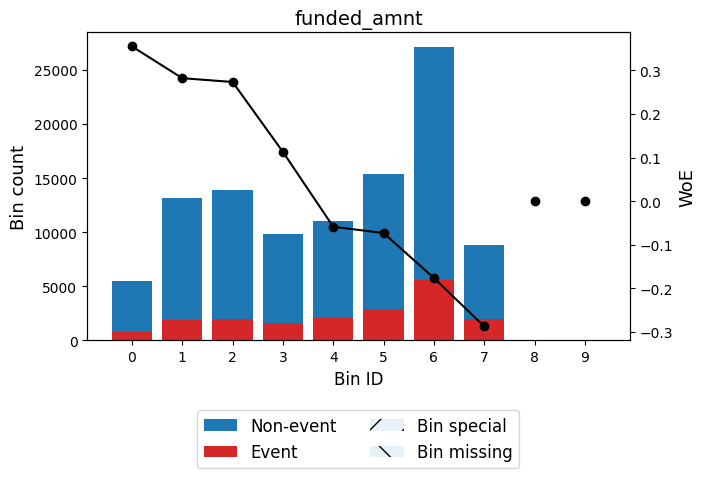


🔍 Feature: term
✅ Total IV for term: 0.2158
╒═══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                 │        IV │
╞═══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 48.00) │   79670 │             0.1384 │ 0.3071963240999305  │ 0.0648341 │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [48.00, inf)  │   25142 │             0.3086 │ -0.7151578510232436 │ 0.150935  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│               │  104812 │             0.

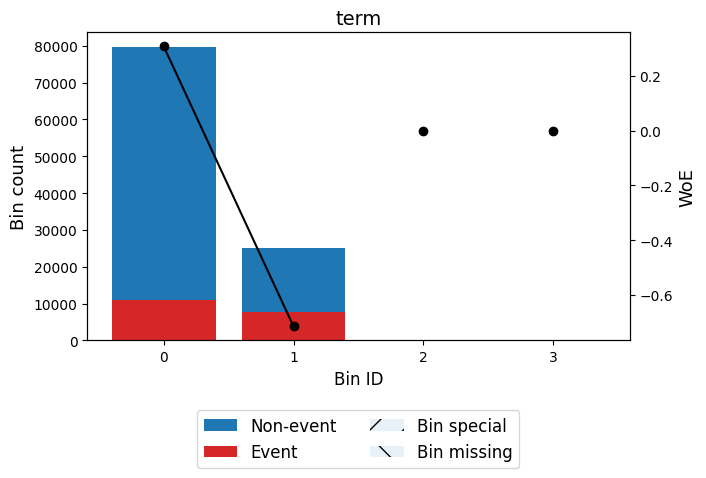


🔍 Feature: int_rate
✅ Total IV for int_rate: 0.4619
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 6.83)   │    6499 │             0.0348 │ 1.8016778805736227   │ 0.109693    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.83, 8.12)   │    9875 │             0.0625 │ 1.1865771894349932   │ 0.0887121   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.12, 8.96)   │    5496 │             0.091  │ 0.7799876645724417   │ 0.0245318   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.96, 9.73)   │    5251 │             0.104  │ 0.6319649680237402   │ 0.0161908   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

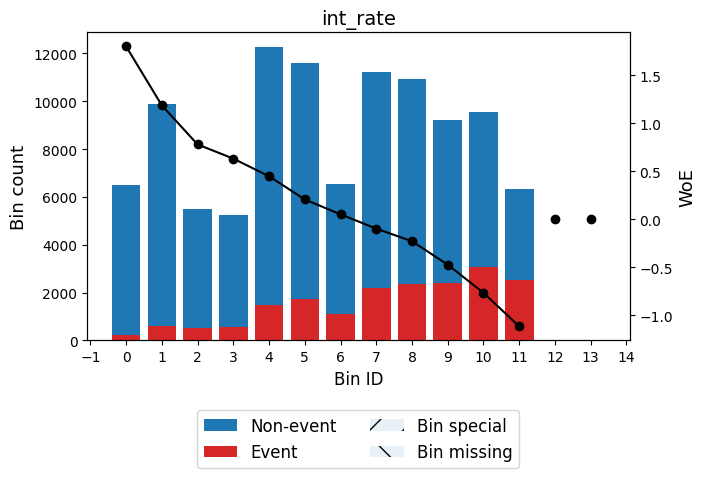


🔍 Feature: installment
✅ Total IV for installment: 0.0310
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 126.24)   │    6196 │             0.1256 │ 0.4189583902158138   │ 0.00903081  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [126.24, 193.38) │    9977 │             0.1362 │ 0.3253067957738047   │ 0.00904933  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [193.38, 255.22) │   10625 │             0.154  │ 0.181950261159872    │ 0.00316268  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [255.22, 337.48) │   18024 │             0.1742 │ 0.03465260835708839  │ 0.000204206 │
├──────────────────┼─────────┼────────────────────┼

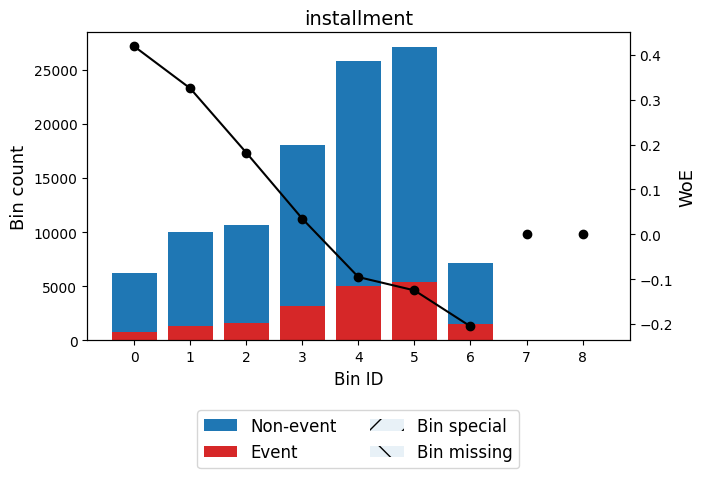


🔍 Feature: emp_length
✅ Total IV for emp_length: 0.0013
╒══════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                    │          IV │
╞══════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 1.50) │   15000 │             0.1849 │ -0.03808025372242274   │ 0.00021007  │
├──────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [1.50, 3.50) │   17864 │             0.1732 │ 0.04133623614157944    │ 0.000287374 │
├──────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [3.50, 4.50) │    6182 │             0.1637 │ 0.10914700940422906    │ 0.000678233 │
├──────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [4.50, 5.50) │    6514 │             0.1793 │ -0.0007413749401430358 │ 3.41677e-08 │
├──────────────┼─────────┼────────────────────┼────────────────────────┼─

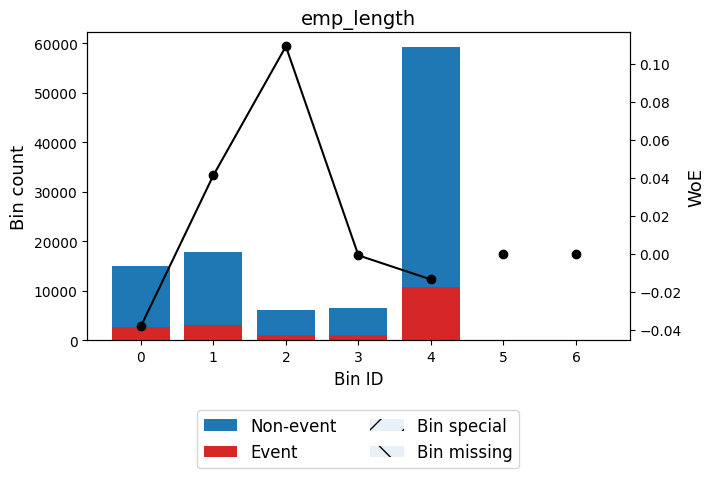


🔍 Feature: annual_inc
✅ Total IV for annual_inc: 0.0253
╒════════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 30054.00)       │    7657 │             0.2117 │ -0.2070988100987714   │ 0.0033435   │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [30054.00, 45752.50)   │   18626 │             0.2042 │ -0.16173768940481148  │ 0.00489185  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [45752.50, 60313.50)   │   22216 │             0.1904 │ -0.07469740284117798  │ 0.00121114  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [60313.50, 75642.10)   │   17886 │             0.1811 │ -0.012826212103856927

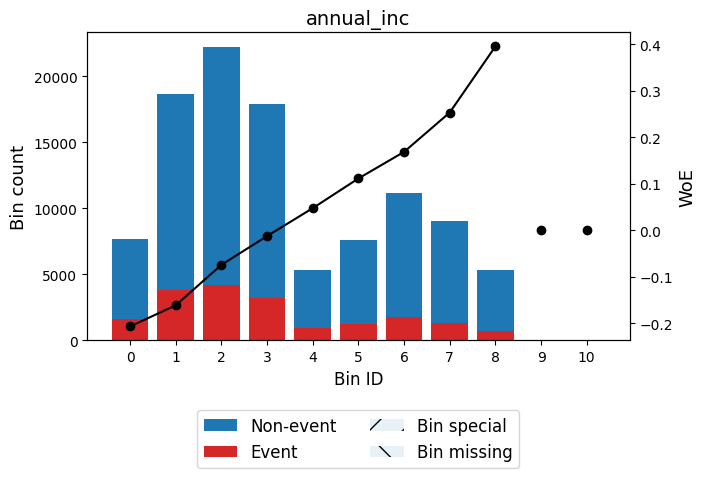


🔍 Feature: dti
✅ Total IV for dti: 0.0958
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 5.90)   │    6713 │             0.1132 │ 0.5365350316221784   │ 0.015416    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.90, 10.77)  │   14813 │             0.1273 │ 0.4036705726279306   │ 0.0201476   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10.77, 12.65) │    7908 │             0.1381 │ 0.3094648039534664   │ 0.00652581  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12.65, 14.32) │    7503 │             0.1506 │ 0.2080555753570732   │ 0.00289506  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤


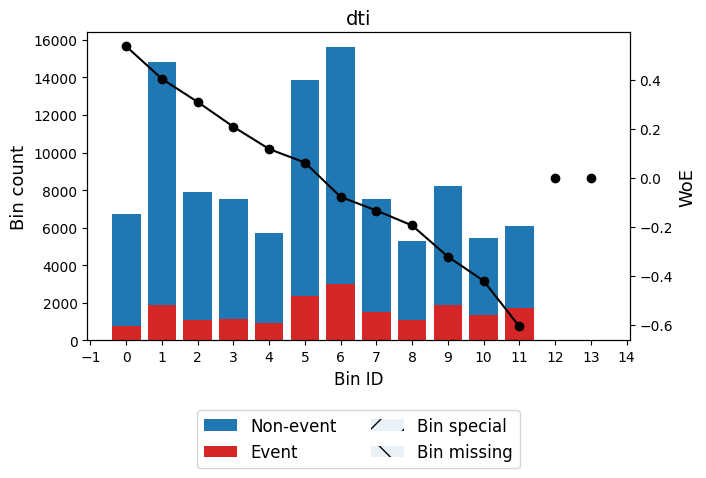


🔍 Feature: delinq_2yrs
✅ Total IV for delinq_2yrs: 0.0031
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84501 │             0.1755 │ 0.025662068882648992 │ 0.000526562 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   13424 │             0.1894 │ -0.06763823295436366 │ 0.000598706 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, inf)  │    6887 │             0.2053 │ -0.16839276356343458 │ 0.00196472  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Miss

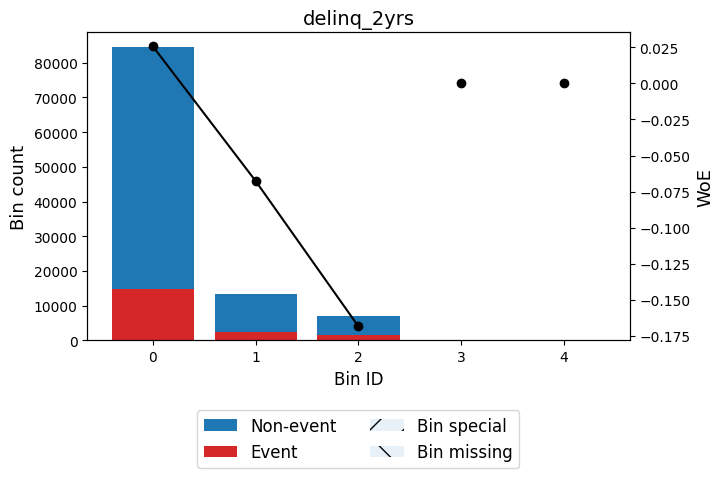


🔍 Feature: inq_last_6mths
✅ Total IV for inq_last_6mths: 0.0285
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   59331 │             0.1597 │ 0.13868499102895826  │ 0.0104078  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   28869 │             0.1915 │ -0.08141172387415341 │ 0.00187345 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10810 │             0.2195 │ -0.2533252905209715  │ 0.0071625  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    5802 │             0.2423 │ -0.3818508650979331  │ 0.00907295 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special  

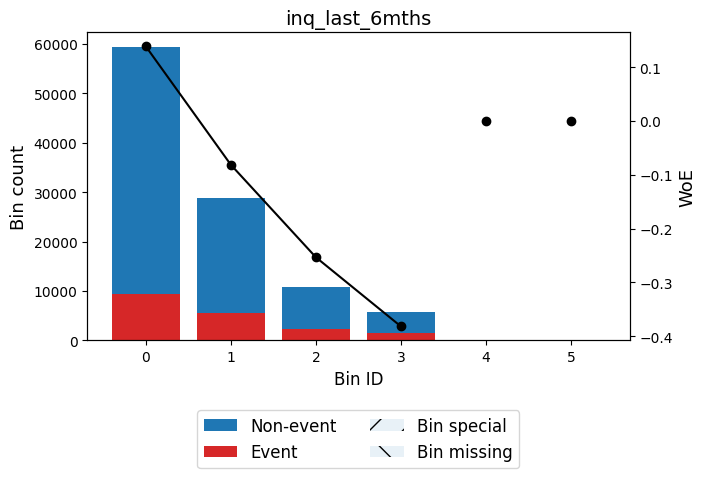


🔍 Feature: open_acc
✅ Total IV for open_acc: 0.0164
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 5.50)   │    8797 │             0.1446 │ 0.2558432374661743    │ 0.00505164  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 6.50)   │    6541 │             0.1575 │ 0.15539018440871888   │ 0.00143259  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)   │    8099 │             0.163  │ 0.11440075359971424   │ 0.00097447  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 8.50)   │    8861 │             0.1694 │ 0.06813127183862511   │ 0.000383893 │
├────────────────┼─────────┼────────────────────┼──────────────────

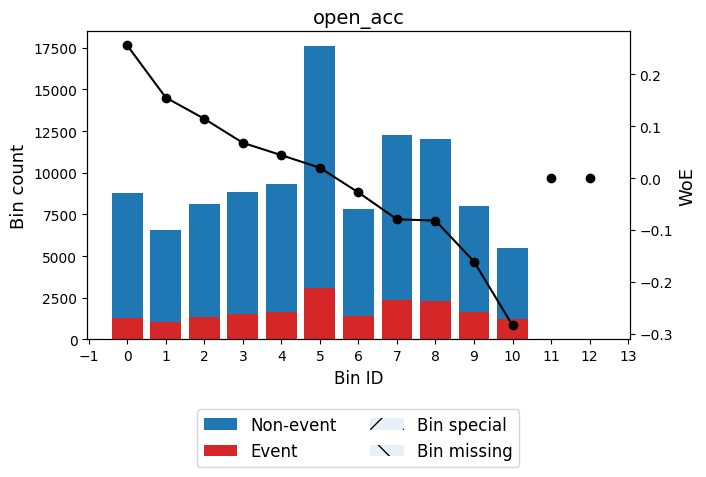


🔍 Feature: pub_rec
✅ Total IV for pub_rec: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87736 │             0.1741 │ 0.035033872780845465 │ 0.00101589 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17076 │             0.2054 │ -0.16877030024506023 │ 0.00489388 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │  104812 

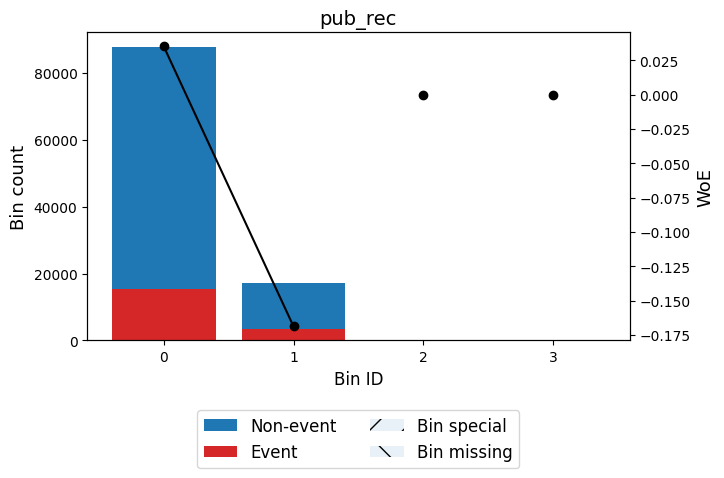


🔍 Feature: revol_bal
✅ Total IV for revol_bal: 0.0038
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2782.50)      │    8393 │             0.1651 │ 0.09869064036985042   │ 0.000755405 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2782.50, 5952.50)   │   16215 │             0.1753 │ 0.026506027638154572  │ 0.000107769 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5952.50, 10166.50)  │   21997 │             0.1802 │ -0.00653955738141776  │ 8.99414e-06 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [10166.50, 12132.50) │    8580 │             0.1825 │ -0.022413554101459843 │ 4.14203e-05 │
├────

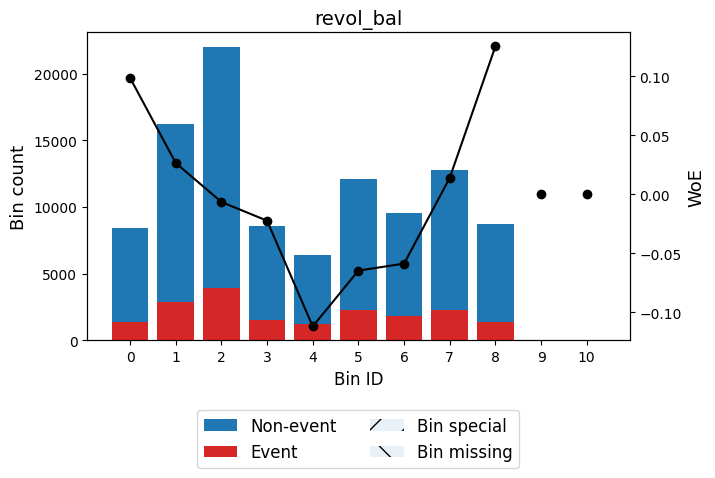


🔍 Feature: revol_util
✅ Total IV for revol_util: 0.0214
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 15.95)  │    7399 │             0.1285 │ 0.39221411339023926  │ 0.00953748  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.95, 25.55) │    7594 │             0.1484 │ 0.2253559791559816   │ 0.00341802  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [25.55, 34.95) │   10481 │             0.1594 │ 0.14066808208399673  │ 0.00189029  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [34.95, 42.45) │   10075 │             0.1746 │ 0.03163879598951058  │ 9.52472e-05 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─

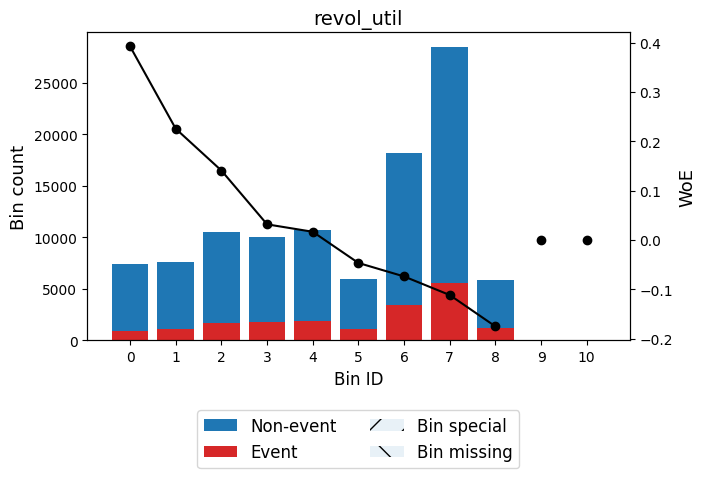


🔍 Feature: total_acc
✅ Total IV for total_acc: 0.0041
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11.50)  │   10363 │             0.1644 │ 0.10382370580770539   │ 0.00103053  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11.50, 13.50) │    5494 │             0.1684 │ 0.07545879580001169   │ 0.000291278 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13.50, 20.50) │   24770 │             0.1733 │ 0.040519407573164745  │ 0.000382978 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [20.50, 23.50) │   11305 │             0.1779 │ 0.008939811621436755  │ 8.59547e-06 │
├────────────────┼─────────┼────────────────────┼────────────────

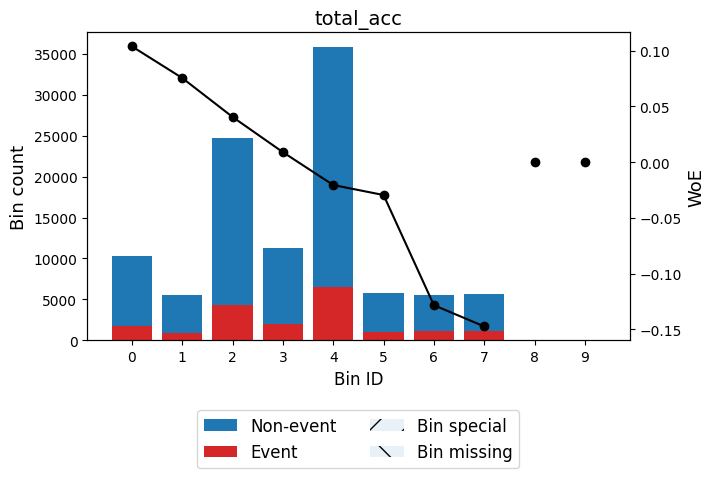


🔍 Feature: collections_12_mths_ex_med
✅ Total IV for collections_12_mths_ex_med: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


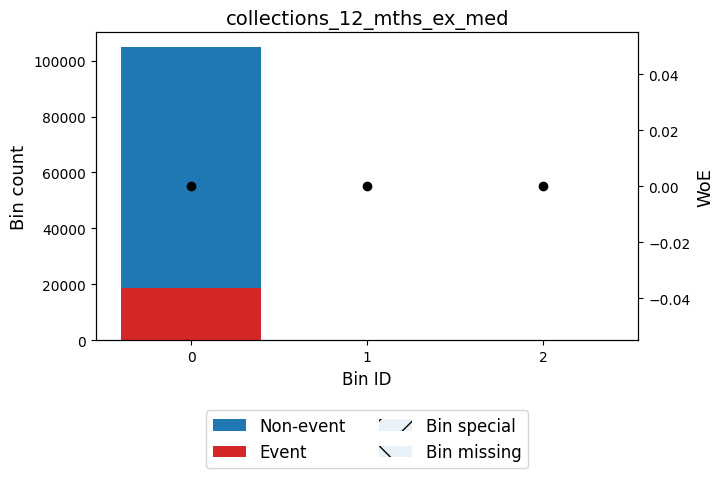


🔍 Feature: acc_now_delinq
✅ Total IV for acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


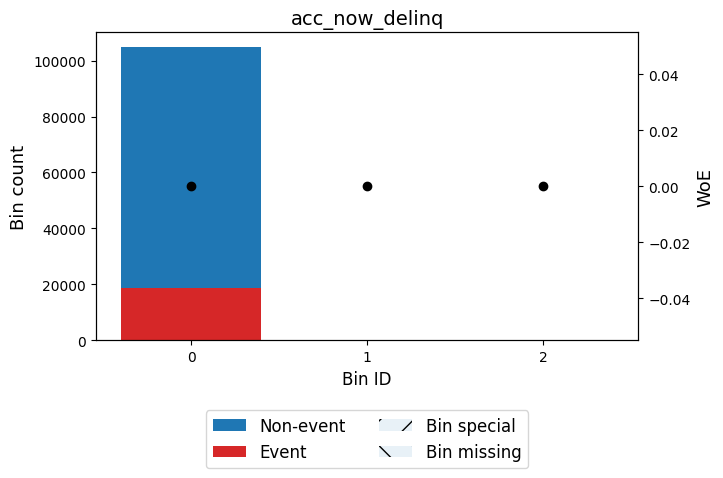


🔍 Feature: tot_cur_bal
✅ Total IV for tot_cur_bal: 0.0290
╒════════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11512.50)       │    7069 │             0.1603 │ 0.13436941556837545   │ 0.00116572  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11512.50, 19544.50)   │    7548 │             0.1842 │ -0.033348805891126654 │ 8.09491e-05 │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [19544.50, 35140.00)   │   14372 │             0.1994 │ -0.13184579921571316  │ 0.00248514  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [35140.00, 48671.00)   │    8858 │             0.2128 │ -0.2136793809119352

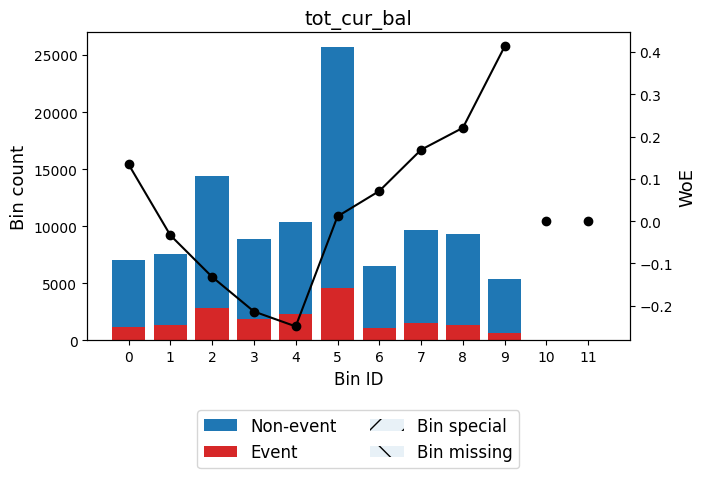


🔍 Feature: total_rev_hi_lim
✅ Total IV for total_rev_hi_lim: 0.0152
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 9040.00)      │   11154 │             0.1971 │ -0.11702126549575587 │ 0.00151235  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9040.00, 23160.50)  │   36287 │             0.1925 │ -0.08808360950202543 │ 0.00276242  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23160.50, 50970.00) │   41531 │             0.1764 │ 0.018813623897028453 │ 0.000139406 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [50970.00, 82068.00) │   10562 │             0.1505 │ 0.208577492174987    │ 0.00409514  │
├

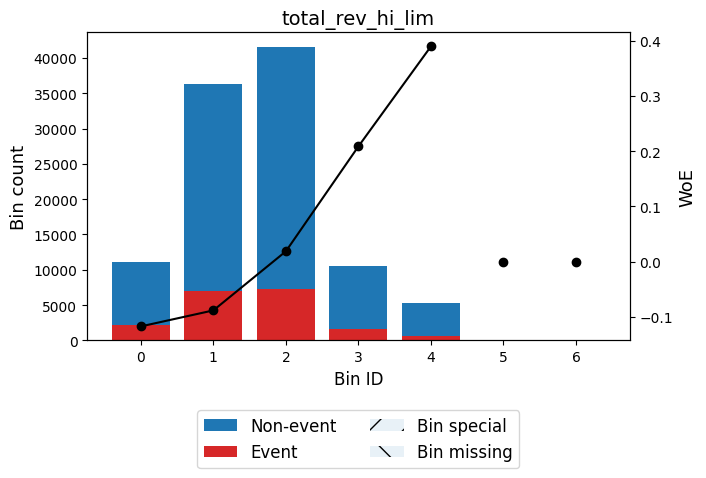


🔍 Feature: acc_open_past_24mths
✅ Total IV for acc_open_past_24mths: 0.0885
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   13507 │             0.1202 │ 0.4684194573175684   │ 0.0241988   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   13183 │             0.1384 │ 0.30718138134631     │ 0.0107271   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   15097 │             0.1592 │ 0.14261437587911163  │ 0.00279689  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   18572 │             0.1636 │ 0.11003465757303976  │ 0.00207023  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

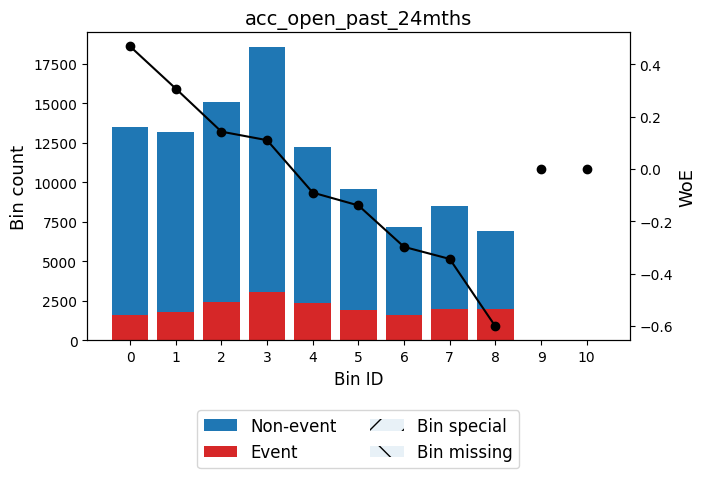


🔍 Feature: avg_cur_bal
✅ Total IV for avg_cur_bal: 0.0357
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 7248.50)      │   48604 │             0.2013 │ -0.14335397411910056  │ 0.00997122  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7248.50, 13524.50)  │   22179 │             0.1808 │ -0.011175890235493258 │ 2.65247e-05 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13524.50, 19791.50) │   11448 │             0.1682 │ 0.07698684922132659   │ 0.000631461 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [19791.50, 24099.50) │    5859 │             0.1516 │ 0.20060745485166764   │ 0.00210695  │
├

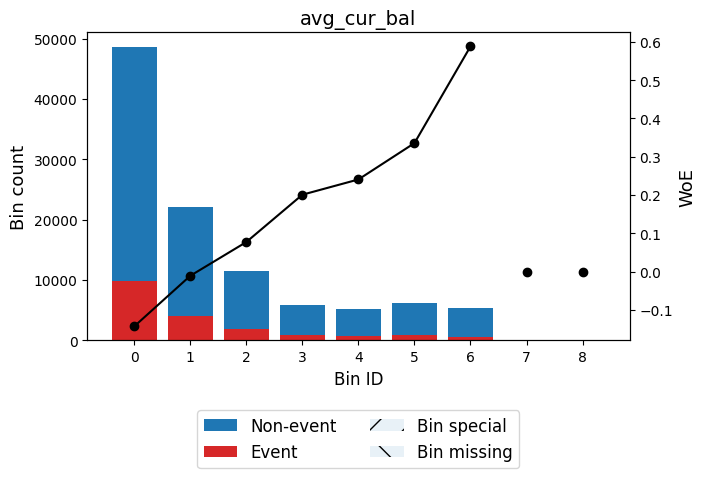


🔍 Feature: bc_open_to_buy
✅ Total IV for bc_open_to_buy: 0.0479
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 142.50)       │    5328 │             0.2416 │ -0.37761885076848767 │ 0.00813809  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [142.50, 401.50)     │    5792 │             0.2136 │ -0.21826067094926405 │ 0.00281868  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [401.50, 1275.50)    │   12965 │             0.2025 │ -0.15085813521413893 │ 0.00295242  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1275.50, 3398.50)   │   19431 │             0.1991 │ -0.1296383836190098  │ 0.00324613  │
├────

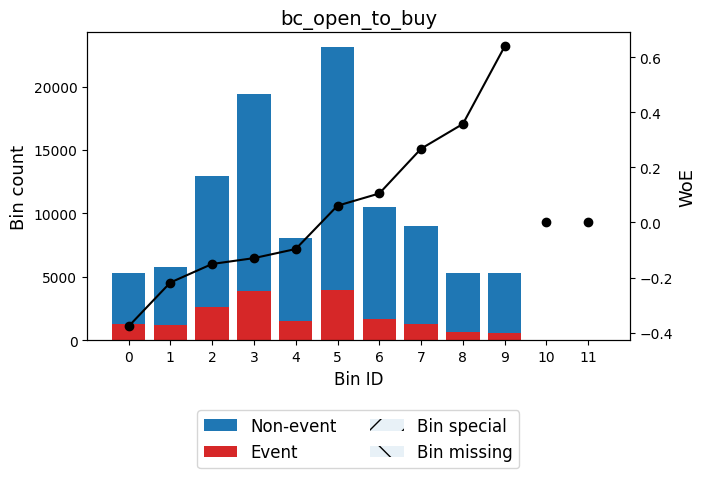


🔍 Feature: bc_util
✅ Total IV for bc_util: 0.0280
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 18.55)  │    8411 │             0.1417 │ 0.27928676226303106   │ 0.00571074  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [18.55, 32.95) │    9300 │             0.1471 │ 0.23575828320635606   │ 0.00456539  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [32.95, 40.45) │    6152 │             0.1603 │ 0.13440051080231563   │ 0.00101496  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [40.45, 46.15) │    5338 │             0.1652 │ 0.09801761734949377   │ 0.000474016 │
├────────────────┼─────────┼────────────────────┼────────────────────

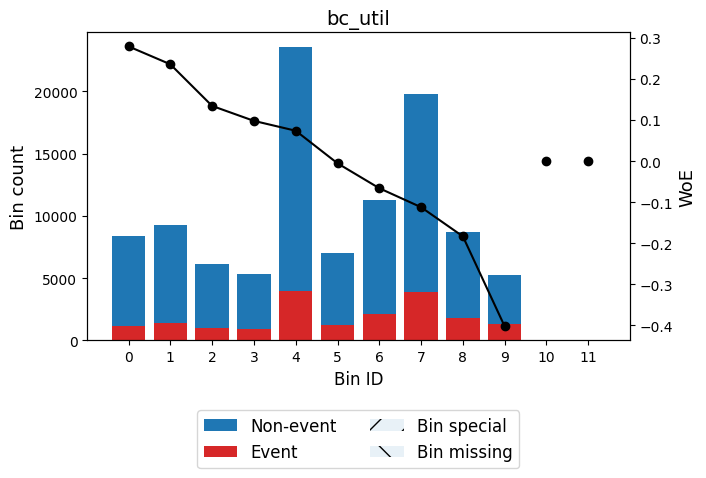


🔍 Feature: chargeoff_within_12_mths
✅ Total IV for chargeoff_within_12_mths: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


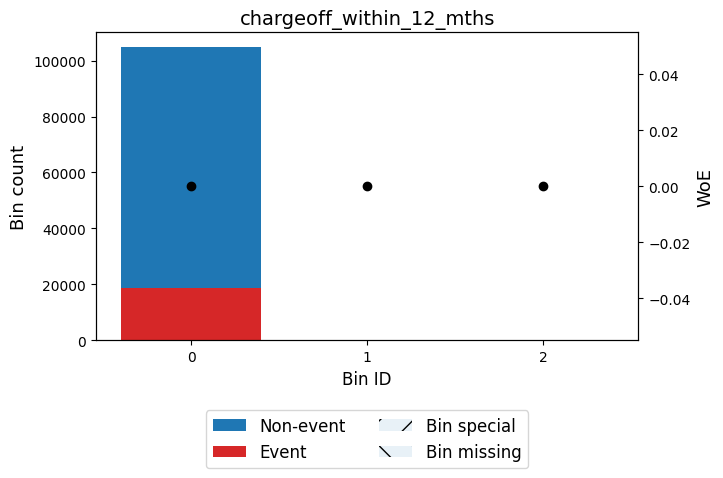


🔍 Feature: delinq_amnt
✅ Total IV for delinq_amnt: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


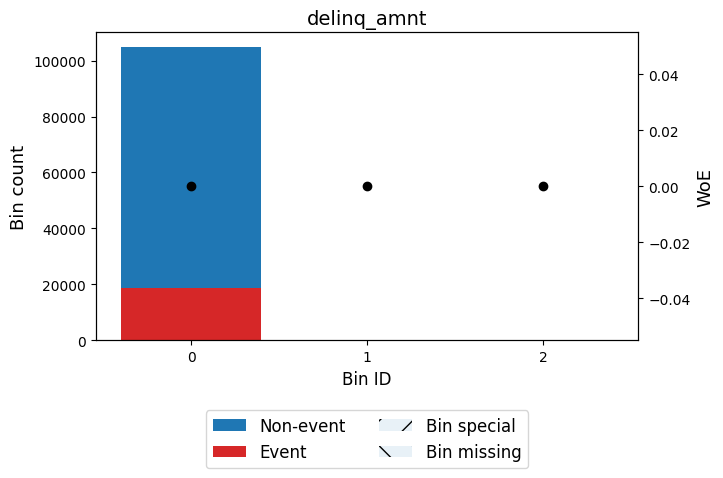


🔍 Feature: mo_sin_old_il_acct
✅ Total IV for mo_sin_old_il_acct: 0.0068
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 49.50)    │    7997 │             0.2002 │ -0.13675274729370468  │ 0.00148993  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [49.50, 127.50)  │   37666 │             0.1882 │ -0.06009330277075953  │ 0.00132285  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [127.50, 129.50) │   11699 │             0.1546 │ 0.17695283097062786   │ 0.00329916  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [129.50, 198.50) │   40899 │             0.1734 │ 0.04007397830100623   │ 0.000618617 │
├──────────────────┼───────

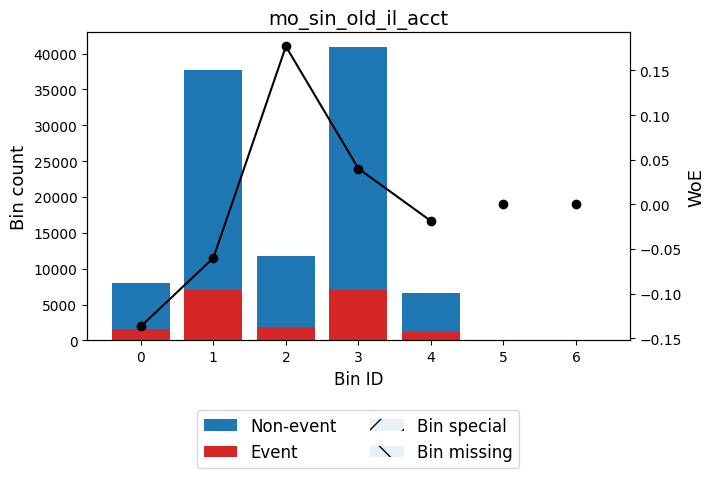


🔍 Feature: mo_sin_old_rev_tl_op
✅ Total IV for mo_sin_old_rev_tl_op: 0.0160
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 62.50)    │    5875 │             0.2313 │ -0.3209195971324257  │ 0.00637449  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [62.50, 111.50)  │   15049 │             0.1954 │ -0.10625771182919586 │ 0.00167671  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111.50, 133.50) │   11549 │             0.1932 │ -0.09229901030662524 │ 0.000966637 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [133.50, 159.50) │   13273 │             0.1854 │ -0.04170825124555244 │ 0.000223248 │
├──────────────────┼─────────┼───

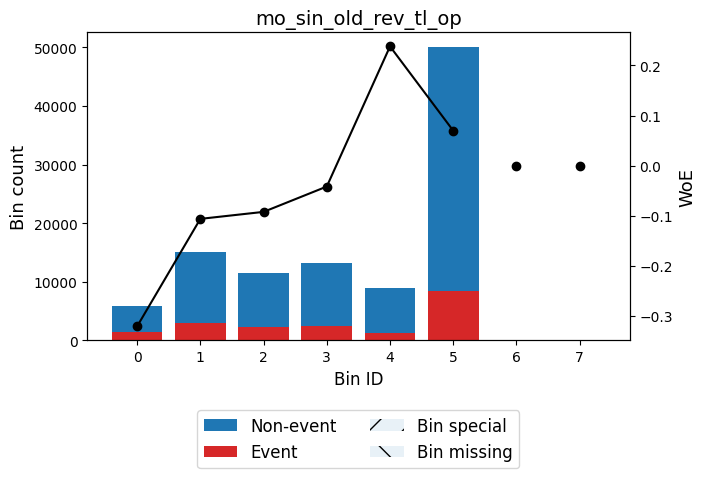


🔍 Feature: mo_sin_rcnt_rev_tl_op
✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0339
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50)   │    7967 │             0.2219 │ -0.2672580837465044  │ 0.0059001   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50)   │    8105 │             0.2116 │ -0.20647592047929475 │ 0.0035172   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)   │    7701 │             0.2072 │ -0.1801894997157838  │ 0.0025247   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    6893 │             0.1945 │ -0.10105448934587291 │ 0.000693488 │
├────────────────┼─────────┼────────────────────┼──

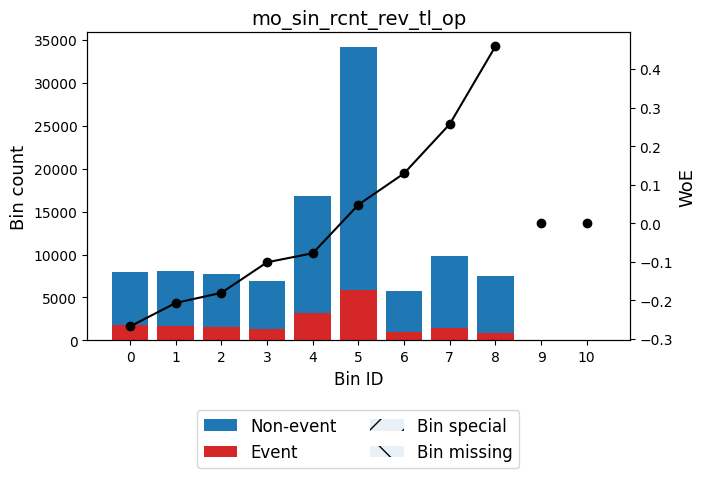


🔍 Feature: mo_sin_rcnt_tl
✅ Total IV for mo_sin_rcnt_tl: 0.0420
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50)   │    9981 │             0.2219 │ -0.2672942804384584  │ 0.00739369  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50)   │   11068 │             0.214  │ -0.22051979961205603 │ 0.00550211  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)   │   10657 │             0.2089 │ -0.19008797216364948 │ 0.00390004  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    9371 │             0.1936 │ -0.09485717390519688 │ 0.000829088 │
├────────────────┼─────────┼────────────────────┼────────────────

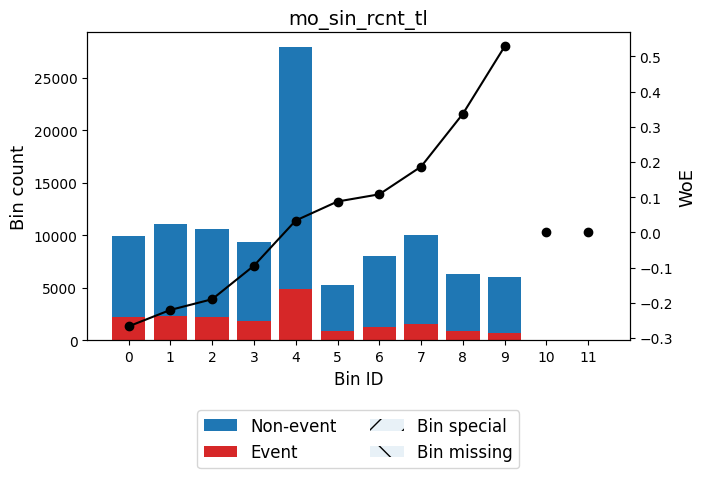


🔍 Feature: mort_acc
✅ Total IV for mort_acc: 0.0206
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   39754 │             0.2034 │ -0.15631404724166087 │ 0.00973597  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36182 │             0.1736 │ 0.038180353349652085 │ 0.000497075 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   10862 │             0.1631 │ 0.11326894775566343  │ 0.00128166  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │    7597 │             0.1497 │ 0.21543899477527662  │ 0.00313537  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, inf

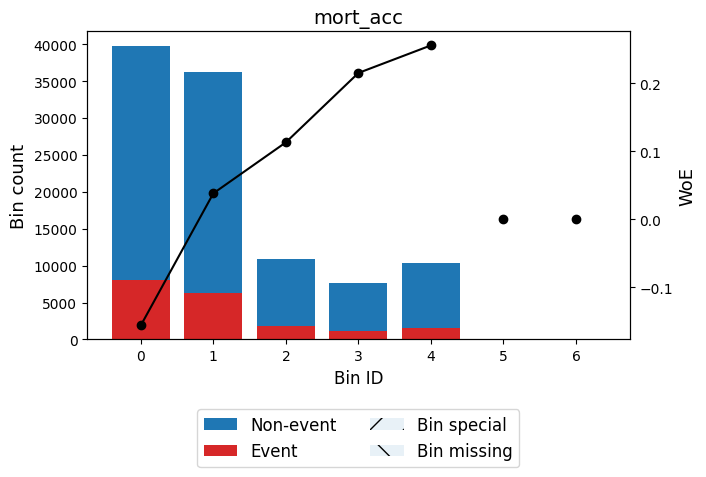


🔍 Feature: mths_since_recent_bc
✅ Total IV for mths_since_recent_bc: 0.0294
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   13518 │             0.2189 │ -0.2496699048445301  │ 0.00869056  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 7.50)   │   16964 │             0.2002 │ -0.1370494239261102  │ 0.00317459  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 11.50)  │   13340 │             0.1914 │ -0.08072454111688954 │ 0.00085096  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 17.50) │   20500 │             0.1755 │ 0.025256714343114384 │ 0.000123757 │
├────────────────┼─────────┼────────────────────┼────

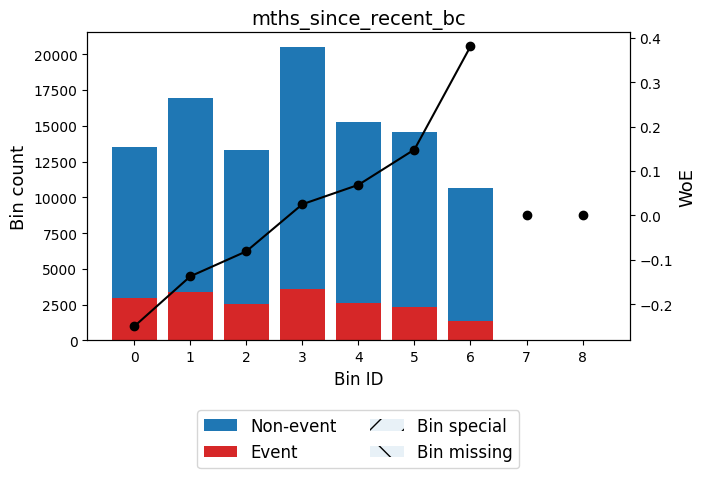


🔍 Feature: mths_since_recent_inq
✅ Total IV for mths_since_recent_inq: 0.0295
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │    8209 │             0.2187 │ -0.24831902892011382 │ 0.00521838  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   10409 │             0.2153 │ -0.22849522220726048 │ 0.00556906  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │    8216 │             0.2072 │ -0.17964743154797547 │ 0.00267691  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │    7317 │             0.2043 │ -0.16227946977005314 │ 0.00193493  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─

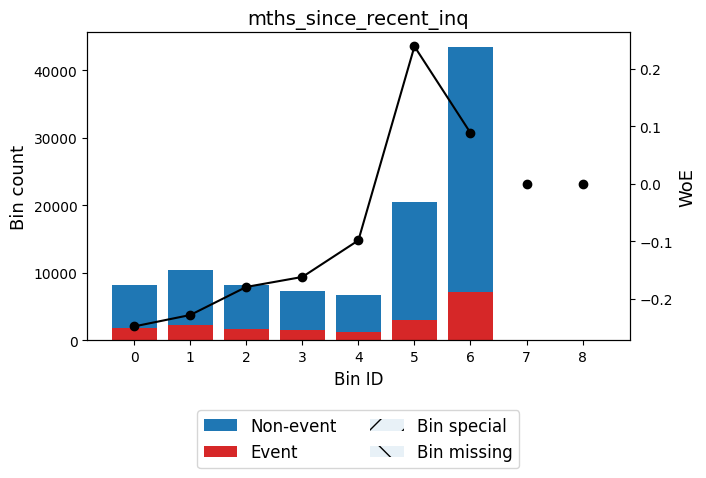


🔍 Feature: num_accts_ever_120_pd
✅ Total IV for num_accts_ever_120_pd: 0.0039
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   81617 │             0.1742 │ 0.034153973915958424 │ 0.000898417 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   23195 │             0.1967 │ -0.11462402986775544 │ 0.00301517  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─

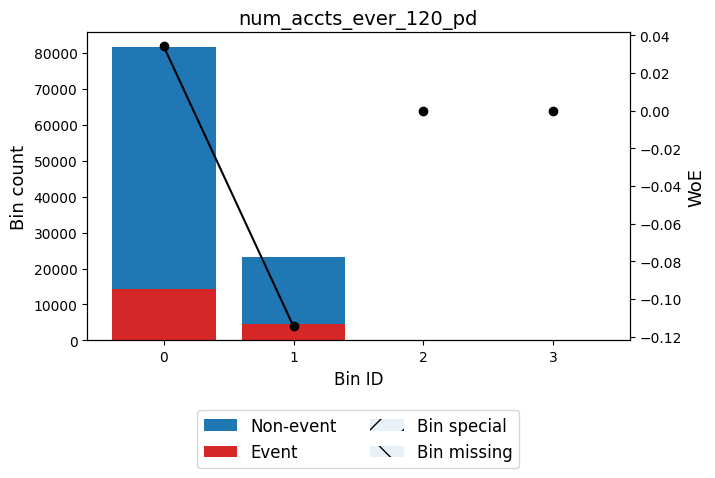


🔍 Feature: num_actv_bc_tl
✅ Total IV for num_actv_bc_tl: 0.0115
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50) │   32341 │             0.169  │ 0.07085229069111576   │ 0.00151395  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50) │   27880 │             0.1663 │ 0.09039800048451907   │ 0.00211104  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 4.50) │   16625 │             0.1829 │ -0.024688380790654163 │ 9.74467e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 5.50) │   11293 │             0.1889 │ -0.06448036905400945  │ 0.000457275 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────

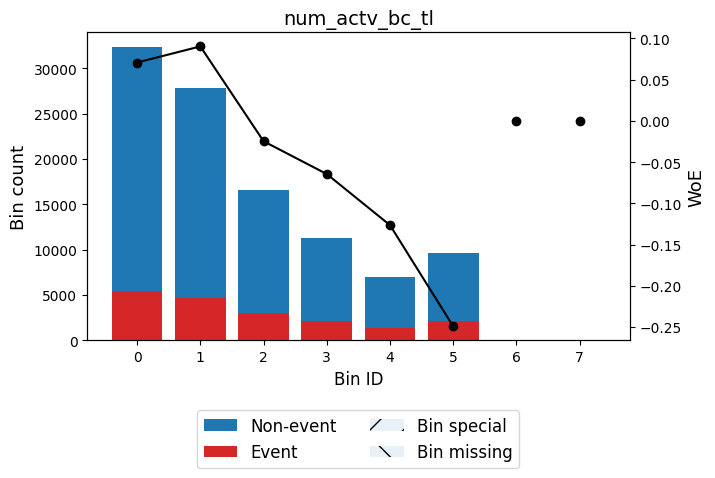


🔍 Feature: num_actv_rev_tl
✅ Total IV for num_actv_rev_tl: 0.0344
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   11696 │             0.1456 │ 0.24769633794826618   │ 0.0063126   │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50)  │   13393 │             0.1568 │ 0.16044861176132108   │ 0.00312217  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 5.50)  │   36046 │             0.167  │ 0.08517930541854857   │ 0.00242745  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 6.50)  │   11809 │             0.1826 │ -0.022783013431107335 │ 5.89103e-05 │
├───────────────┼─────────┼────────────────────┼───────────────

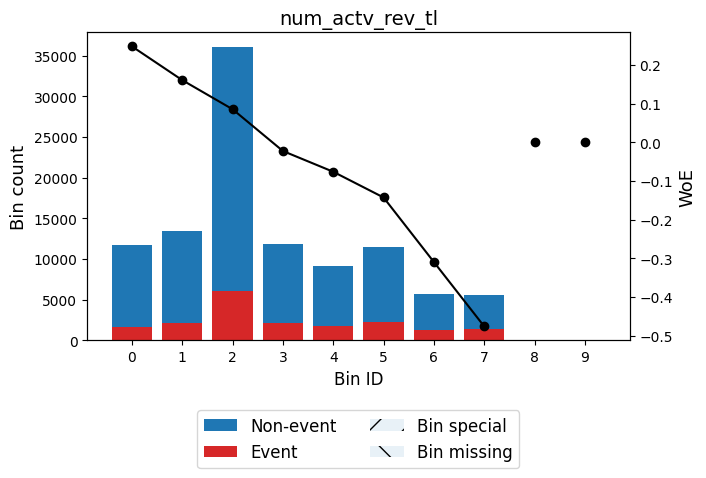


🔍 Feature: num_bc_sats
✅ Total IV for num_bc_sats: 0.0045
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │    7019 │             0.1842 │ -0.0337450013646321  │ 7.70848e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50) │   31199 │             0.1753 │ 0.026986463563856145 │ 0.000214908 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   22243 │             0.1649 │ 0.10069942761551198  │ 0.00208292  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 6.50) │   23650 │             0.184  │ -0.03214953089240469 │ 0.000235632 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.5

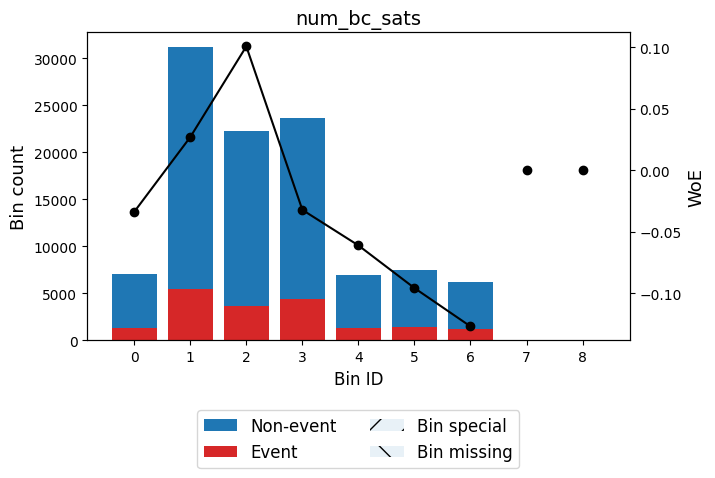


🔍 Feature: num_bc_tl
✅ Total IV for num_bc_tl: 0.0034
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)   │    5895 │             0.1936 │ -0.09471581019277142  │ 0.000519977 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50)   │    6948 │             0.1864 │ -0.048121425709181986 │ 0.000155883 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 6.50)   │   28062 │             0.1808 │ -0.01119479443640592  │ 3.36742e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)   │   15823 │             0.1624 │ 0.11852093474057823   │ 0.00204067  │
├────────────────┼─────────┼────────────────────┼────────────────

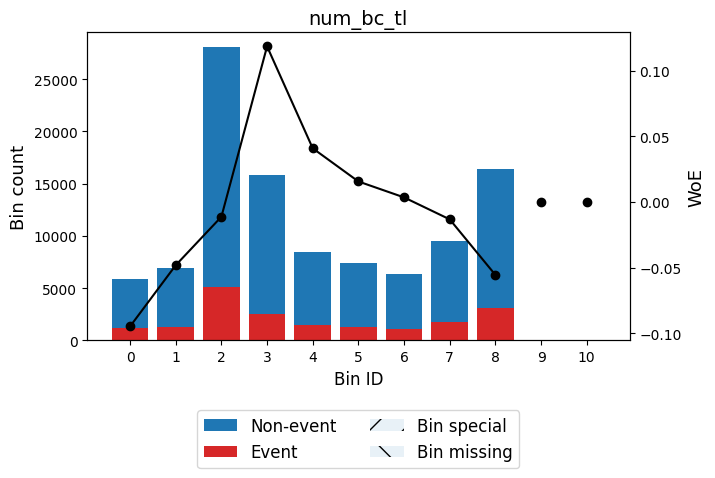


🔍 Feature: num_il_tl
✅ Total IV for num_il_tl: 0.0076
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 6.50)   │   48395 │             0.1737 │ 0.03757365946450575  │ 0.000644025 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.50, 7.50)   │   13215 │             0.1579 │ 0.15250884916187268  │ 0.00279062  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 11.50)  │   19103 │             0.1852 │ -0.04033390009485682 │ 0.00030035  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 19.50) │   16236 │             0.1916 │ -0.08222251768864752 │ 0.001075    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───

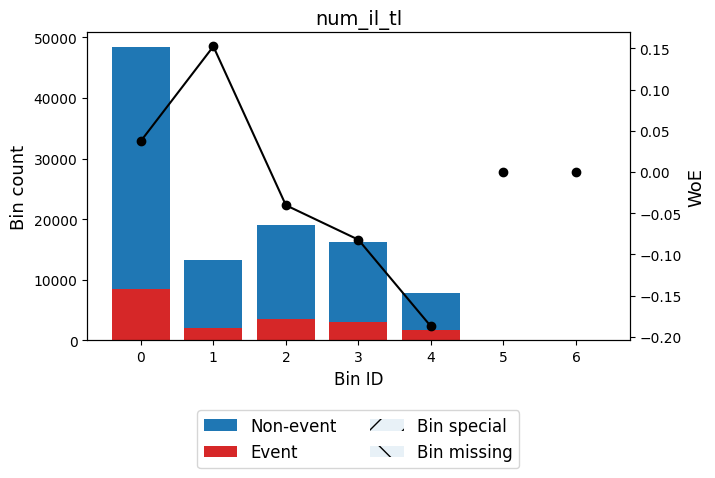


🔍 Feature: num_op_rev_tl
✅ Total IV for num_op_rev_tl: 0.0180
╒════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                    │          IV │
╞════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 4.50)   │   17679 │             0.1587 │ 0.146414075055614      │ 0.00344777  │
├────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [4.50, 7.50)   │   38308 │             0.1665 │ 0.08908244916154584    │ 0.00281804  │
├────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [7.50, 8.50)   │    9449 │             0.1792 │ 0.00016752597857228047 │ 2.52997e-09 │
├────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [8.50, 9.50)   │    7922 │             0.1813 │ -0.014012570991741136  │ 1.49076e-05 │
├────────────────┼─────────┼───────────────────

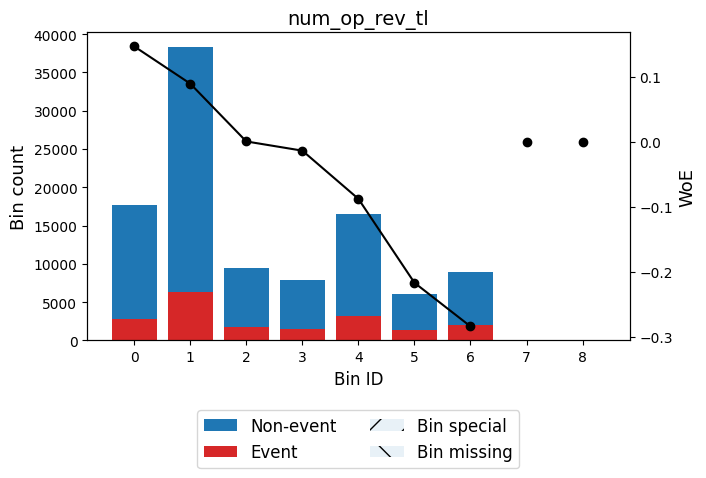


🔍 Feature: num_rev_accts
✅ Total IV for num_rev_accts: 0.0061
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 9.50)   │   27159 │             0.1751 │ 0.027990791385422042  │ 0.000201198 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, 12.50)  │   16764 │             0.1725 │ 0.04612700749083287   │ 0.000335291 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [12.50, 13.50) │   11941 │             0.1581 │ 0.1505559214491392    │ 0.002459    │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13.50, 15.50) │   10043 │             0.1822 │ -0.020394810346109127 │ 4.01169e-05 │
├────────────────┼─────────┼────────────────────┼────────

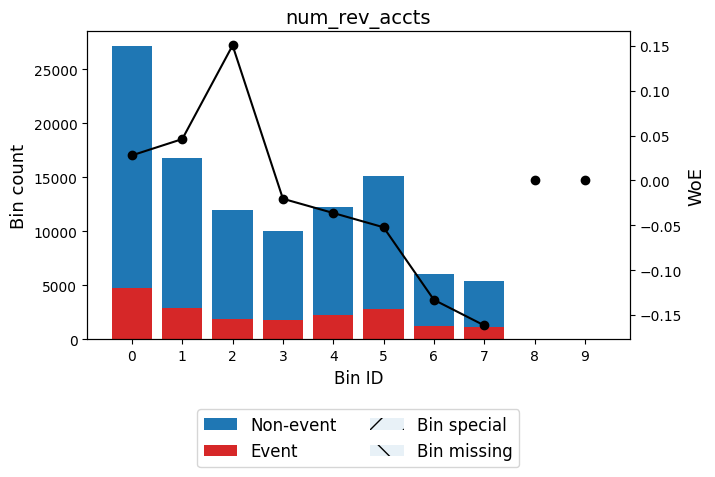


🔍 Feature: num_rev_tl_bal_gt_0
✅ Total IV for num_rev_tl_bal_gt_0: 0.0337
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   11712 │             0.1453 │ 0.2499834549251121   │ 0.00643359  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)  │   13471 │             0.1577 │ 0.15385518017832522  │ 0.00289384  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50)  │   36204 │             0.1674 │ 0.08247899006189474  │ 0.00228797  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 6.50)  │   11871 │             0.1839 │ -0.03160917956785059 │ 0.000114312 │
├───────────────┼─────────┼────────────────────┼─────────────────

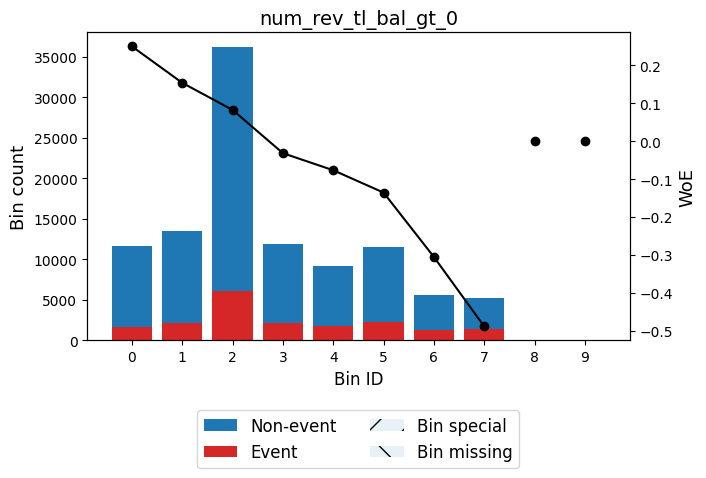


🔍 Feature: num_sats
✅ Total IV for num_sats: 0.0165
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 5.50)   │    8016 │             0.1461 │ 0.2438632658739972   │ 0.00419892  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 6.50)   │    6078 │             0.1588 │ 0.14561638549017863  │ 0.00117276  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.50, 7.50)   │    7594 │             0.1655 │ 0.09588043248243472  │ 0.000645714 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 11.50)  │   39518 │             0.1706 │ 0.05954281518186599  │ 0.00131129  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

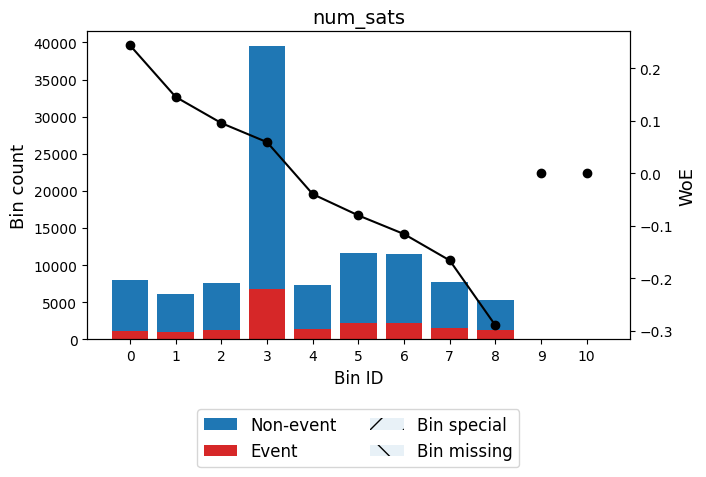


🔍 Feature: num_tl_120dpd_2m
✅ Total IV for num_tl_120dpd_2m: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


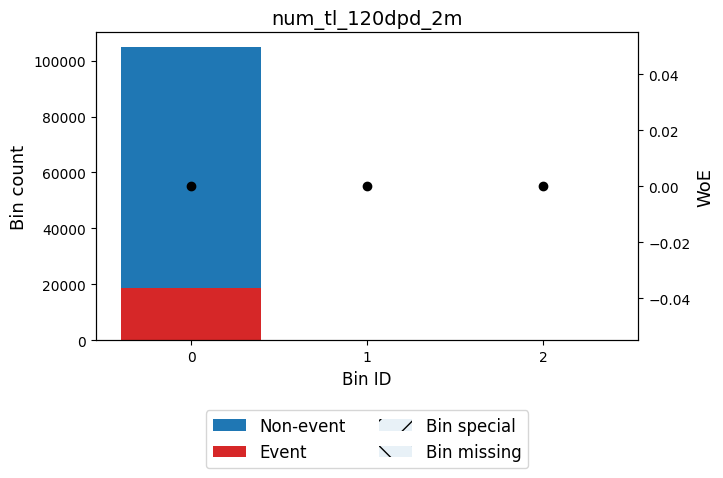


🔍 Feature: num_tl_30dpd
✅ Total IV for num_tl_30dpd: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


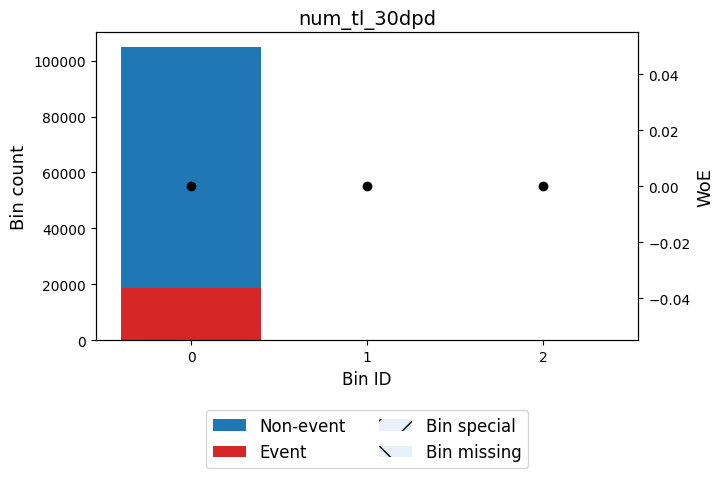


🔍 Feature: num_tl_90g_dpd_24m
✅ Total IV for num_tl_90g_dpd_24m: 0.0008
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   99046 │             0.1781 │ 0.00713799256725145  │ 4.80378e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │    5766 │             0.1972 │ -0.11784946097010018 │ 0.000793112 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────

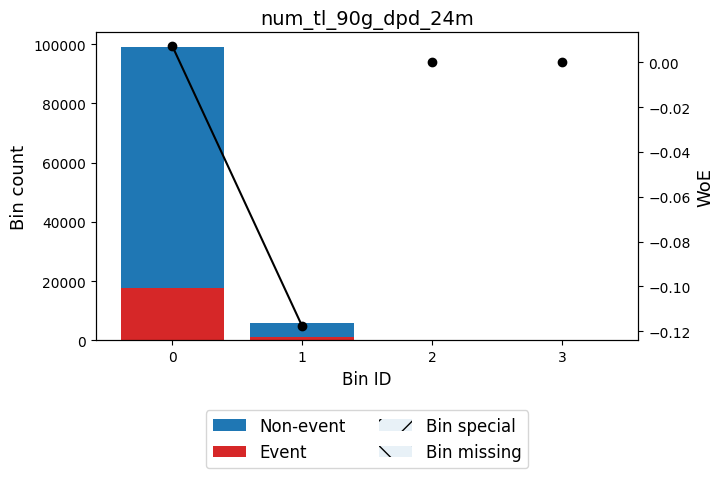


🔍 Feature: num_tl_op_past_12m
✅ Total IV for num_tl_op_past_12m: 0.0686
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   16609 │             0.1314 │ 0.3670624553019213   │ 0.0189119  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   24452 │             0.152  │ 0.1974263909674372   │ 0.0085255  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   29153 │             0.1696 │ 0.06675263644489116  │ 0.00121297 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50) │   16322 │             0.21   │ -0.19701202209793967 │ 0.00642993 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [

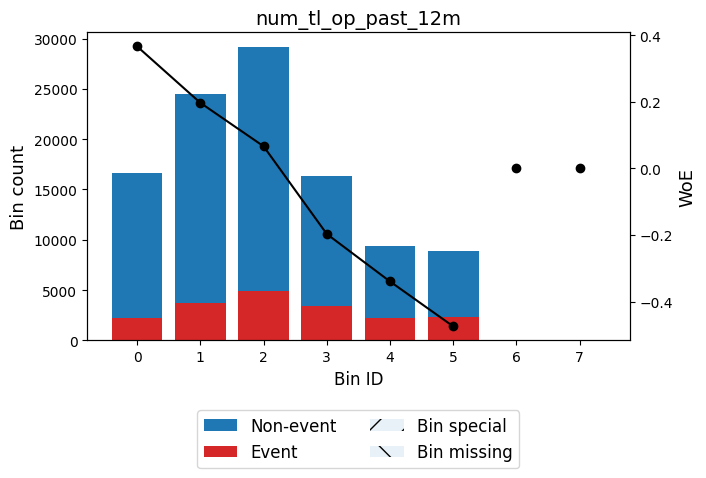


🔍 Feature: pct_tl_nvr_dlq
✅ Total IV for pct_tl_nvr_dlq: 0.0059
╒════════════════╤═════════╤════════════════════╤═════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                 │          IV │
╞════════════════╪═════════╪════════════════════╪═════════════════════╪═════════════╡
│ (-inf, 96.85)  │   45290 │             0.1902 │ -0.0729199424550313 │ 0.00235162  │
├────────────────┼─────────┼────────────────────┼─────────────────────┼─────────────┤
│ [96.85, 97.85) │   10422 │             0.1544 │ 0.17881792785644235 │ 0.00299947  │
├────────────────┼─────────┼────────────────────┼─────────────────────┼─────────────┤
│ [97.85, inf)   │   49100 │             0.1743 │ 0.03339184261936845 │ 0.000516754 │
├────────────────┼─────────┼────────────────────┼─────────────────────┼─────────────┤
│ Special        │       0 │             0      │ 0.0                 │ 0           │
├────────────────┼─────────┼────────────────────┼─────────────────────┼────

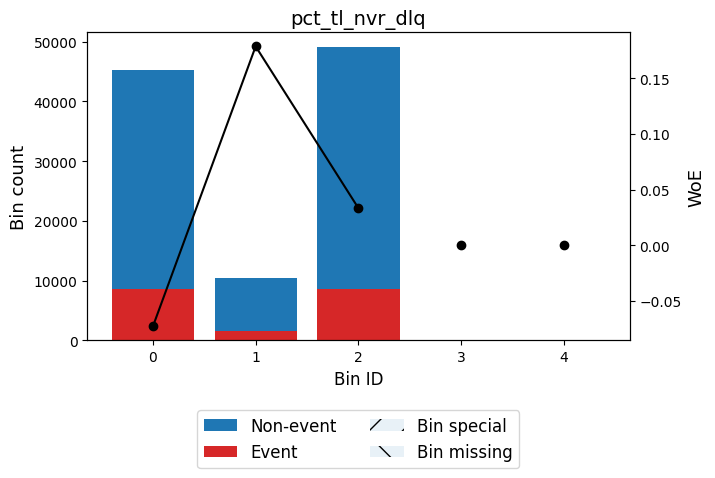


🔍 Feature: percent_bc_gt_75
✅ Total IV for percent_bc_gt_75: 0.0290
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 5.75)   │   21247 │             0.1437 │ 0.26317004739629457   │ 0.0128783   │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.75, 26.40)  │   13217 │             0.1637 │ 0.10894641509374847   │ 0.00144482  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [26.40, 45.85) │   18534 │             0.1675 │ 0.08182495580326243   │ 0.00115303  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [45.85, 52.65) │   11668 │             0.1836 │ -0.029512177897723202 │ 9.78785e-05 │
├────────────────┼─────────┼────────────────────┼──

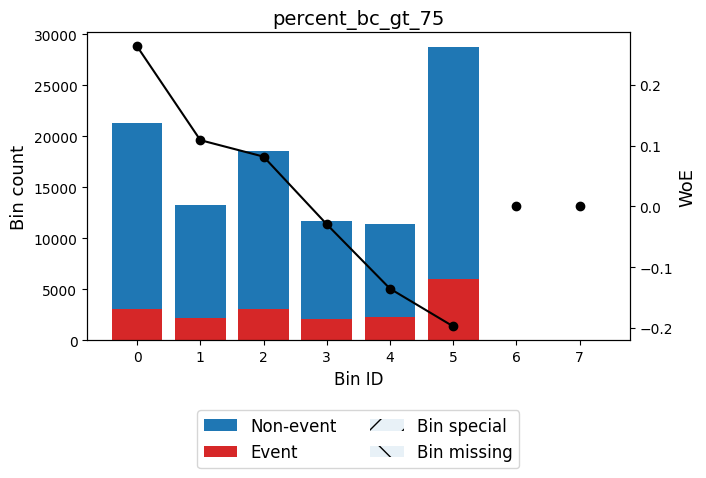


🔍 Feature: pub_rec_bankruptcies
✅ Total IV for pub_rec_bankruptcies: 0.0037
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   92529 │             0.1759 │ 0.022866266995507534 │ 0.00045821 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   12283 │             0.2043 │ -0.16245638003782847 │ 0.00325541 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤

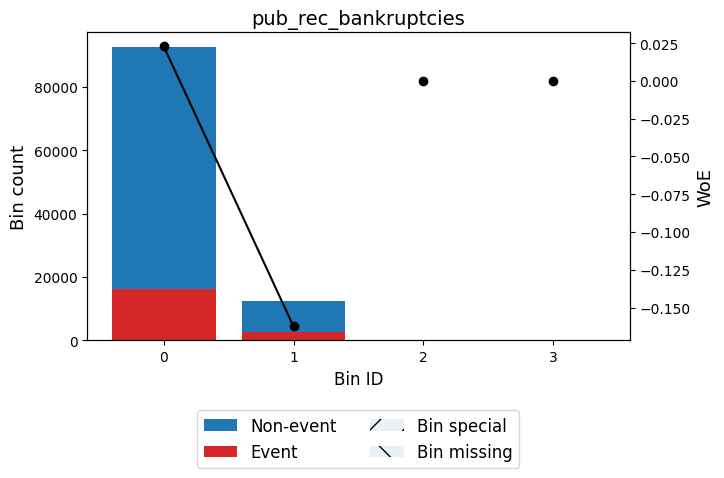


🔍 Feature: tax_liens
✅ Total IV for tax_liens: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


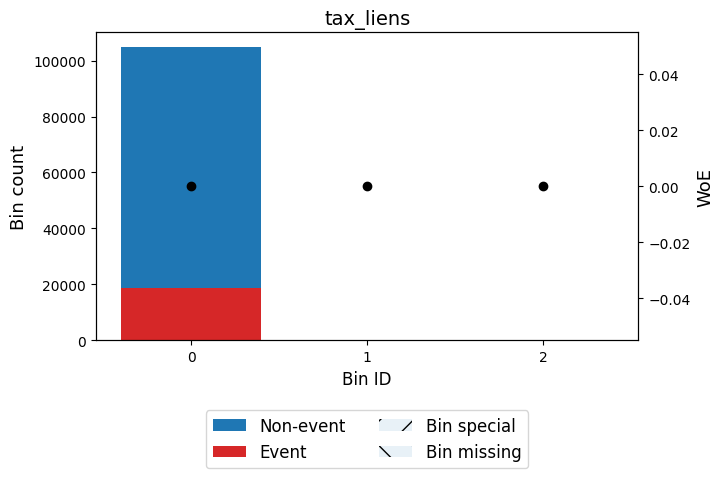


🔍 Feature: tot_hi_cred_lim
✅ Total IV for tot_hi_cred_lim: 0.0296
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 19799.50)       │    5242 │             0.1768 │ 0.016101929700838458 │ 1.29002e-05 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [19799.50, 46968.50)   │   17678 │             0.1962 │ -0.11178790958250939 │ 0.00218375  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [46968.50, 59894.00)   │    7893 │             0.2158 │ -0.2312534232348813  │ 0.00432913  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [59894.00, 111184.50)  │   18096 │             0.2051 │ -0.16691249332578417

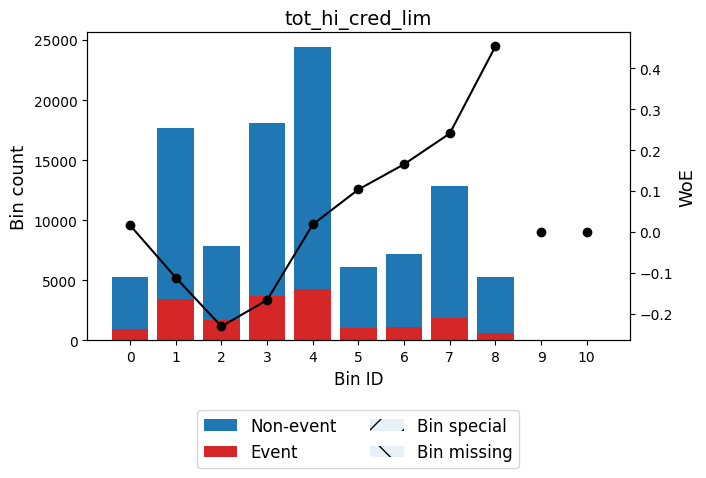


🔍 Feature: total_bal_ex_mort
✅ Total IV for total_bal_ex_mort: 0.0090
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 9300.00)      │    7436 │             0.1447 │ 0.25498080736160333   │ 0.00424258  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9300.00, 15482.50)  │    8701 │             0.1634 │ 0.11113205050423702   │ 0.00098899  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [15482.50, 18971.50) │    5306 │             0.1698 │ 0.06519317251110701   │ 0.000210679 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [18971.50, 37201.50) │   32907 │             0.1742 │ 0.03401335753074619   │ 0.0

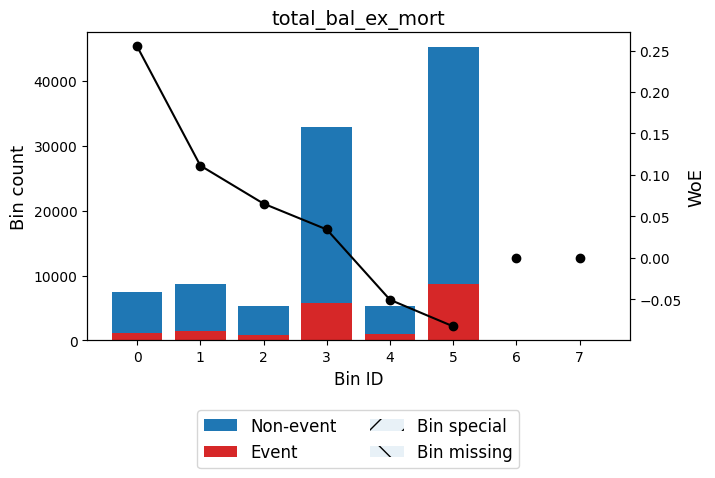


🔍 Feature: total_bc_limit
✅ Total IV for total_bc_limit: 0.0301
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2985.00)      │    6693 │             0.2154 │ -0.22940961245786995 │ 0.00361063  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2985.00, 4425.00)   │    5433 │             0.2061 │ -0.1734920758921319  │ 0.00164781  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4425.00, 7125.00)   │   10971 │             0.2014 │ -0.14447957009626955 │ 0.00228701  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7125.00, 11041.00)  │   15147 │             0.2004 │ -0.13781183606720337 │ 0.00286687  │
├────

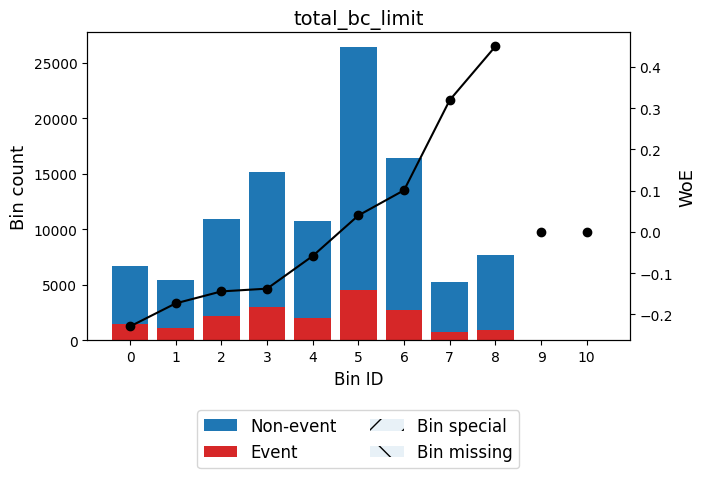


🔍 Feature: total_il_high_credit_limit
✅ Total IV for total_il_high_credit_limit: 0.0076
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 243.00)       │   12244 │             0.1501 │ 0.2119074306837816    │ 0.00489467  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [243.00, 31297.00)   │   43510 │             0.176  │ 0.021851392189177643  │ 0.000196827 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [31297.00, 41313.50) │   11852 │             0.1822 │ -0.020038284273034224 │ 4.5697e-05  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [41313.50, 73526.00) │   22242 │             0.1908 │ -0.076751

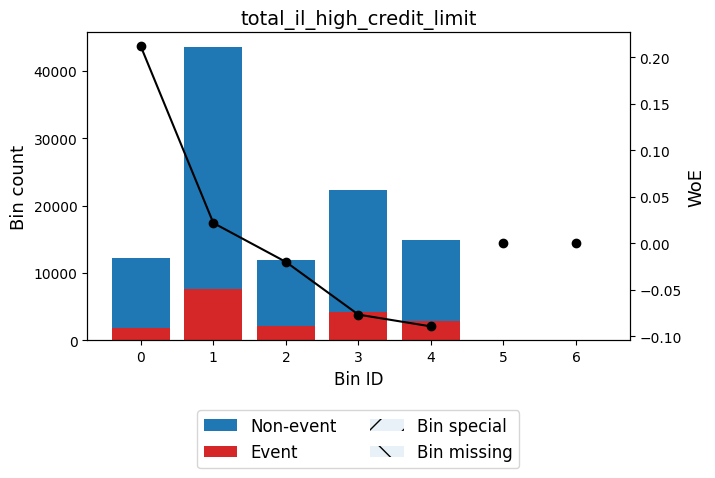


🔍 Feature: credit_history_years
✅ Total IV for credit_history_years: 0.0058
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 8.50)   │   13153 │             0.1837 │ -0.03021466787140481  │ 0.000115677 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [8.50, 10.50)  │   10971 │             0.1965 │ -0.1135969454477519   │ 0.00140025  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [10.50, 12.50) │   14639 │             0.1908 │ -0.07692313735910128  │ 0.000846928 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [12.50, 13.50) │    7440 │             0.186  │ -0.045725449311164956 │ 0.000150598 │
├────────────────┼─────────┼───────────────

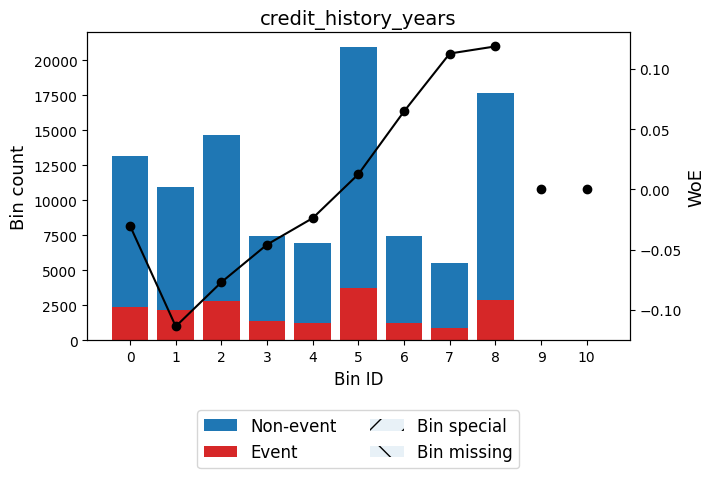


🔍 Feature: fico_score
✅ Total IV for fico_score: 0.1235
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 664.50)   │    9258 │             0.2412 │ -0.37566786588904644  │ 0.0139872   │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [664.50, 669.50) │    9216 │             0.2357 │ -0.3452693196885641   │ 0.0116577   │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [669.50, 674.50) │    9325 │             0.2217 │ -0.2657910801595873   │ 0.00682718  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [674.50, 679.50) │    8259 │             0.2165 │ -0.23556412892702805  │ 0.00470647  │
├──────────────────┼─────────┼─────────────

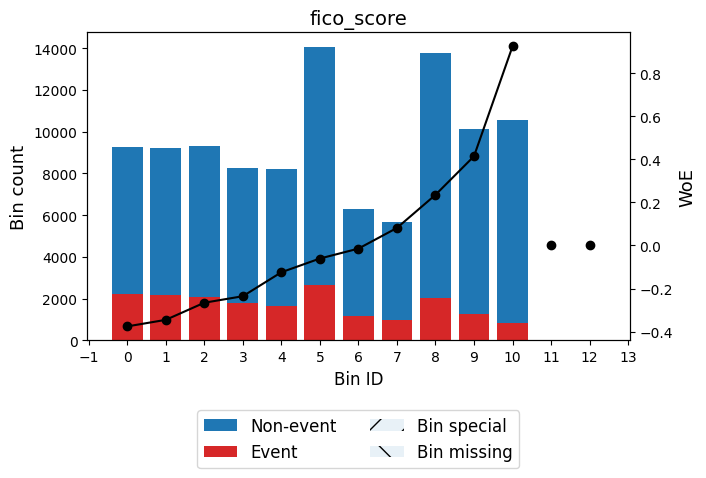


🔍 Feature: fico_score/delinq_2yrs_invalid
✅ Total IV for fico_score/delinq_2yrs_invalid: 0.0026
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   20311 │             0.1948 │ -0.10249686102095312 │ 0.00210314  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   84501 │             0.1755 │ 0.025662068882648992 │ 0.000526562 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────

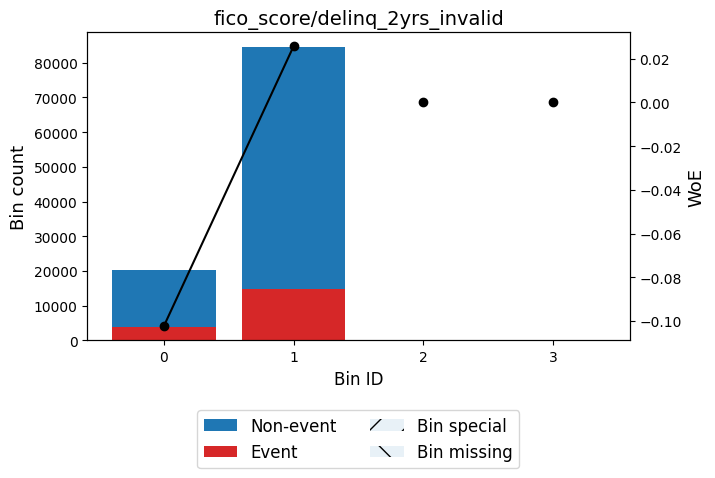


🔍 Feature: fico_score/delinq_2yrs
✅ Total IV for fico_score/delinq_2yrs: 0.0072
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 40.31)    │   84506 │             0.1754 │ 0.025733828058884356 │ 0.00052953 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [40.31, 398.50)  │    6881 │             0.2053 │ -0.1685992930915221  │ 0.00196796 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [398.50, 684.50) │    7605 │             0.213  │ -0.214966918485191   │ 0.00358652 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [684.50, inf)    │    5820 │             0.1586 │ 0.1469517089486303   │ 0.00114317 │
├──────────────────┼─────────┼─────────

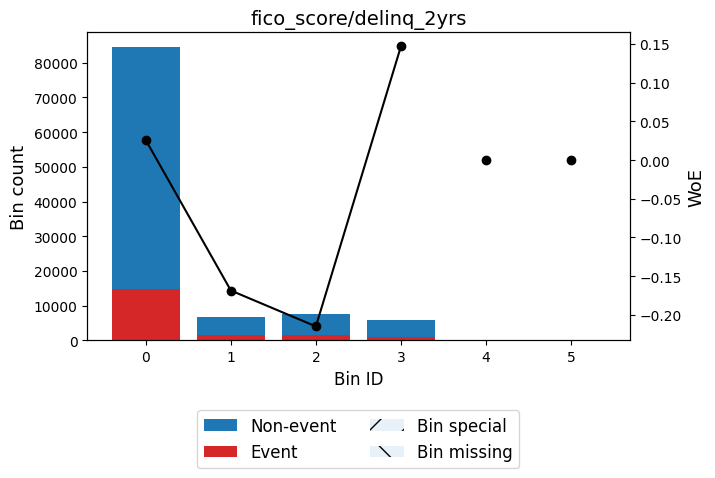


🔍 Feature: fico_score/acc_now_delinq_invalid
✅ Total IV for fico_score/acc_now_delinq_invalid: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


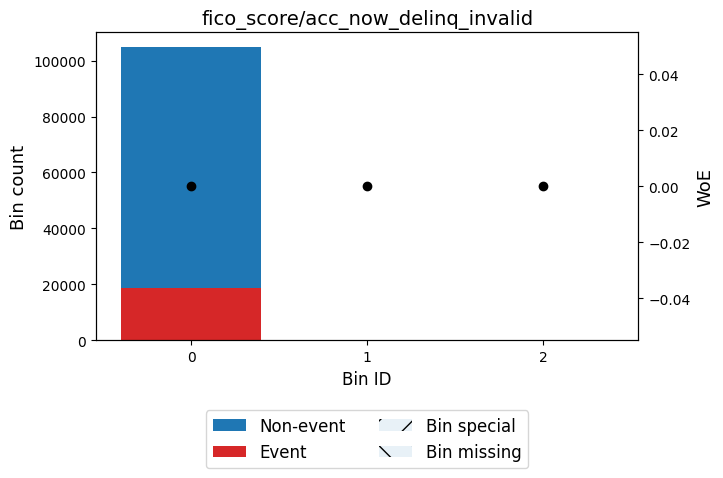


🔍 Feature: fico_score/acc_now_delinq
✅ Total IV for fico_score/acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


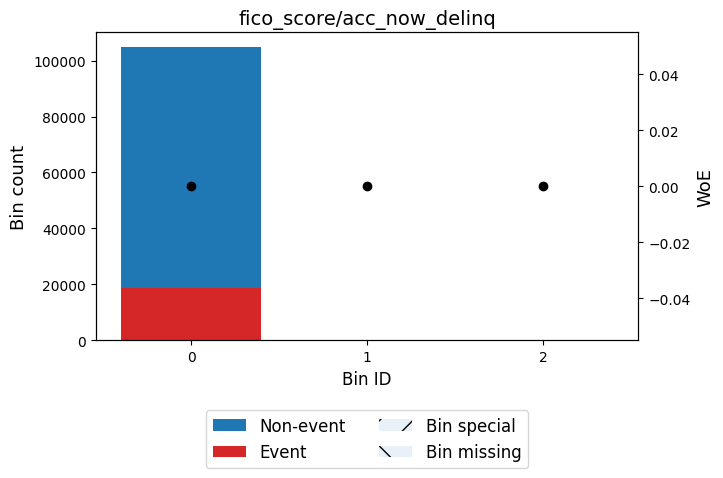


🔍 Feature: fico_score/inq_last_6mths_invalid
✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0227
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │        IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 0.50) │   45481 │             0.2046 │ -0.16422328471908476 │ 0.0123244 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [0.50, inf)  │   59331 │             0.1597 │ 0.13868499102895826  │ 0.0104078 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼────────────────────

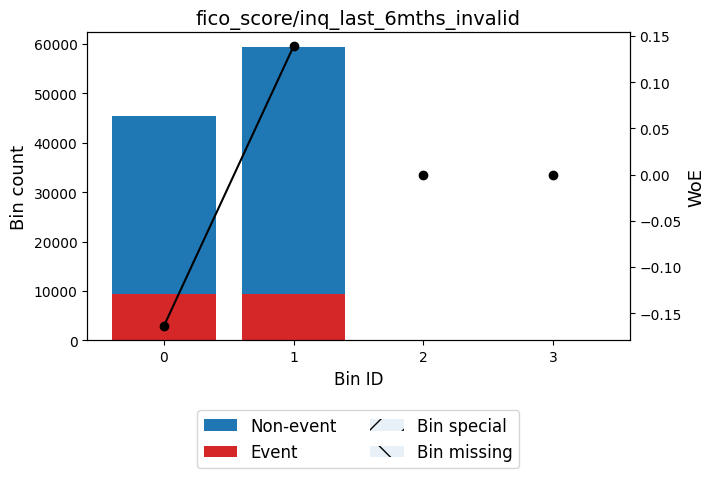


🔍 Feature: fico_score/inq_last_6mths
✅ Total IV for fico_score/inq_last_6mths: 0.0508
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 112.42)   │   59364 │             0.1597 │ 0.1388444226437313   │ 0.010437   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [112.42, 339.75) │   10104 │             0.2518 │ -0.43266356353726887 │ 0.0205829  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [339.75, 679.50) │   17132 │             0.2184 │ -0.2469091763996516  │ 0.0107628  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [679.50, 699.50) │    8038 │             0.1987 │ -0.12724016991895648 │ 0.00129263 │
├──────────────────┼─────────┼───

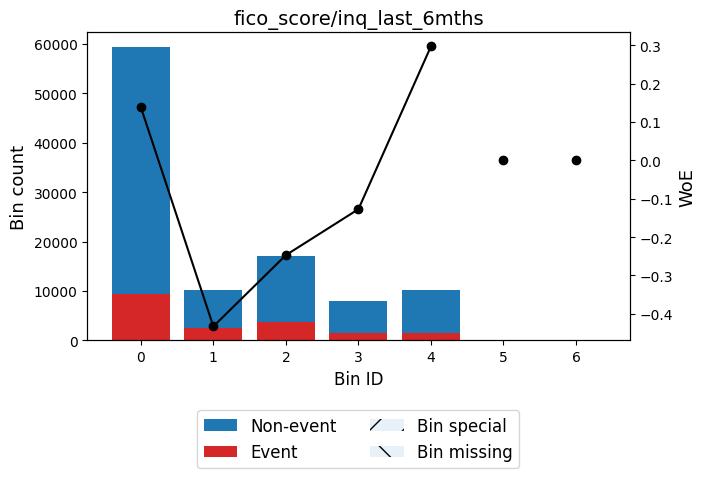


🔍 Feature: delinq_2yrs/credit_history_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: delinq_2yrs/credit_history
✅ Total IV for delinq_2yrs/credit_history: 0.0040
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.04) │   86023 │             0.1755 │ 0.025584954594220388 │ 0.000532843 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.10) │   10982 │             0.1858 │ -0.04458955232536166 │ 0.00021131  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, inf)  │    7807 │             0.211  │ -0.20267578190090974 │ 0.00326053  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0             

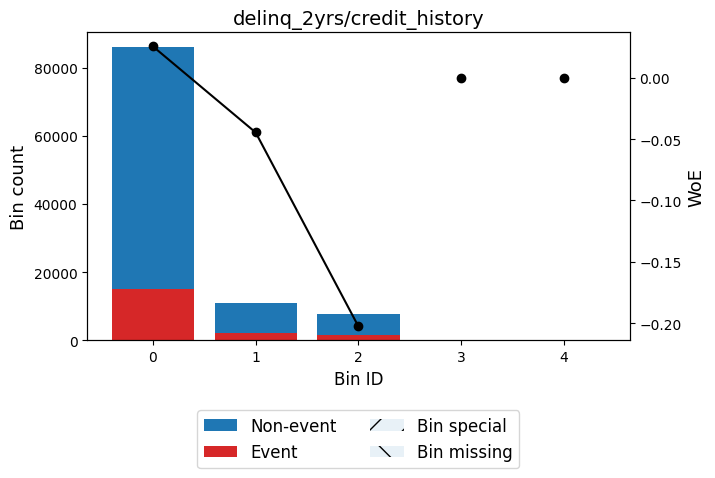


🔍 Feature: late_pymt_hist_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: late_pymt_hist
✅ Total IV for late_pymt_hist: 0.0048
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.06) │   86371 │             0.1745 │ 0.032487615830874006 │ 0.0008607  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.06, 0.12) │    9798 │             0.198  │ -0.1229529601898034  │ 0.00146931 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.12, inf)  │    8643 │             0.2051 │ -0.16730602910864767 │ 0.00243314 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────

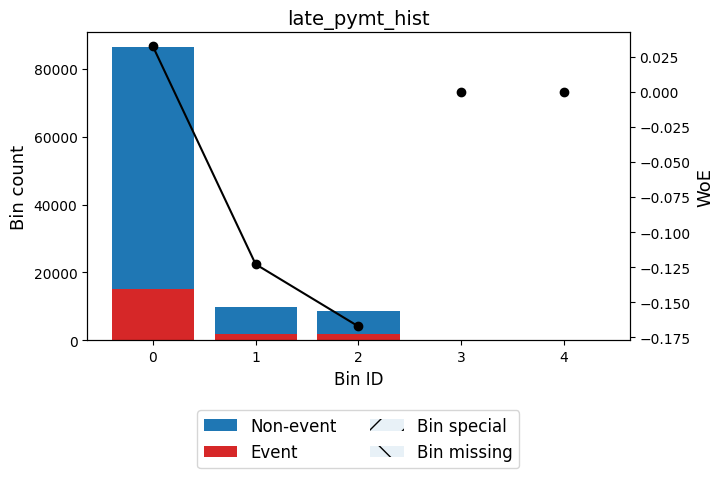


🔍 Feature: loan_amnt/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/annual_inc
✅ Total IV for loan_amnt/annual_inc: 0.1286
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.07) │    7776 │             0.1089 │ 0.5799729787244923    │ 0.0205573   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.07, 0.10) │    8097 │             0.1182 │ 0.48786755562984085   │ 0.0156319   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.10, 0.12) │    7253 │             0.1284 │ 0.39373450724766124   │ 0.00941705  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.12, 0.17) │   16501 │             0.1401 │ 0.29306005162887283   │ 0

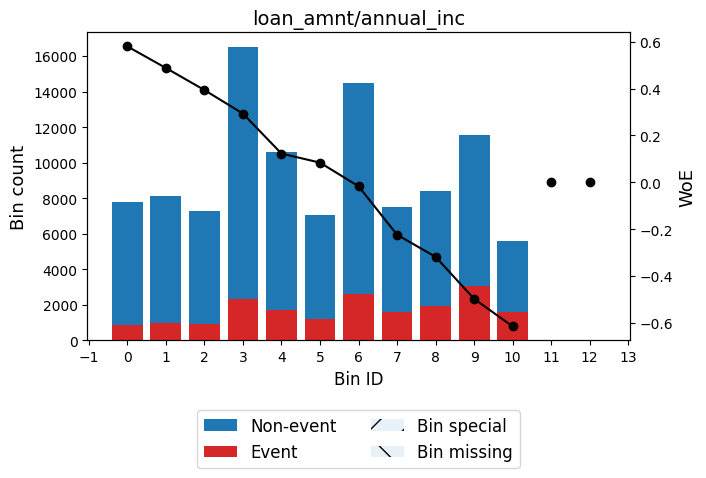


🔍 Feature: revol_util/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: revol_util/annual_inc
✅ Total IV for revol_util/annual_inc: 0.0469
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5536 │             0.1183 │ 0.4866730520010605    │ 0.0106397   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.00) │    9842 │             0.1339 │ 0.34497316990522053   │ 0.00997253  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.00) │    7053 │             0.1486 │ 0.22391176138226165   │ 0.00313546  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.00) │   12582 │             0.1553 │ 0.17181636602614136   

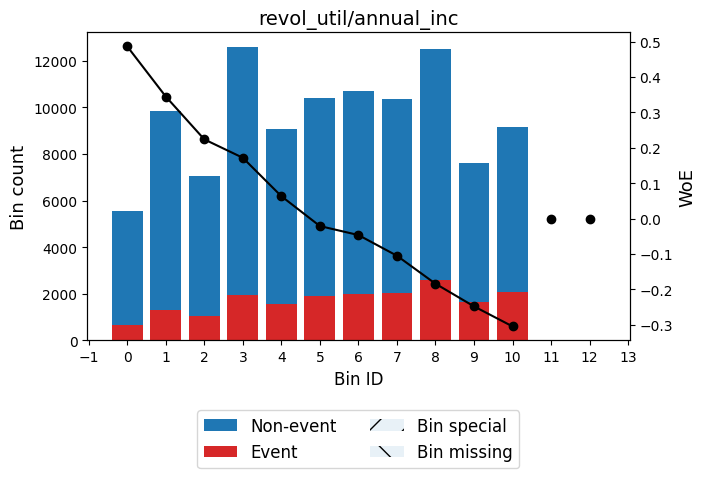


🔍 Feature: acc_op_past_24mths/total_acc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: acc_op_past_24mths/total_acc
✅ Total IV for acc_op_past_24mths/total_acc: 0.0691
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.03) │    5324 │             0.1119 │ 0.5492197837697494   │ 0.0127557   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.06) │    6176 │             0.1211 │ 0.4601259347294475   │ 0.0107066   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.11) │   14766 │             0.1399 │ 0.294190514516264    │ 0.0110686   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.11, 0.14) │   11503 │             0.158  │ 0.15169764

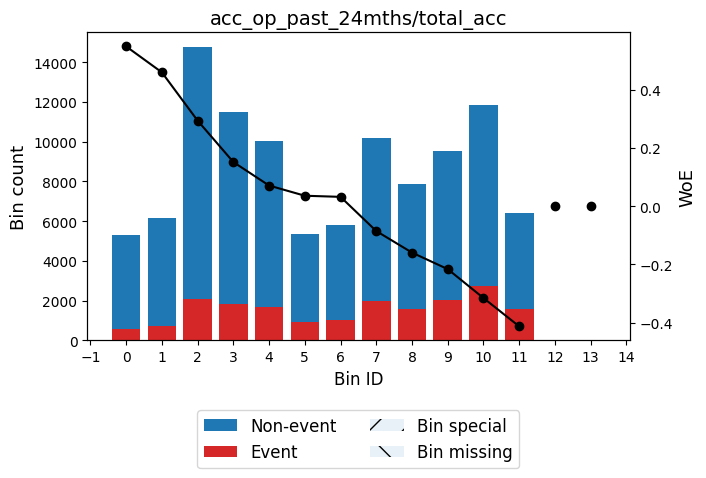


🔍 Feature: bc_open_to_buy/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/annual_inc
✅ Total IV for bc_open_to_buy/annual_inc: 0.0254
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5390 │             0.2343 │ -0.3377362008487441  │ 0.00650939  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.01) │    9686 │             0.2047 │ -0.16479809441766502 │ 0.00264357  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.02) │   12820 │             0.1957 │ -0.10847008909931355 │ 0.00148949  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.04) │    9055 │             0.1915 │ -0.0814810559446794

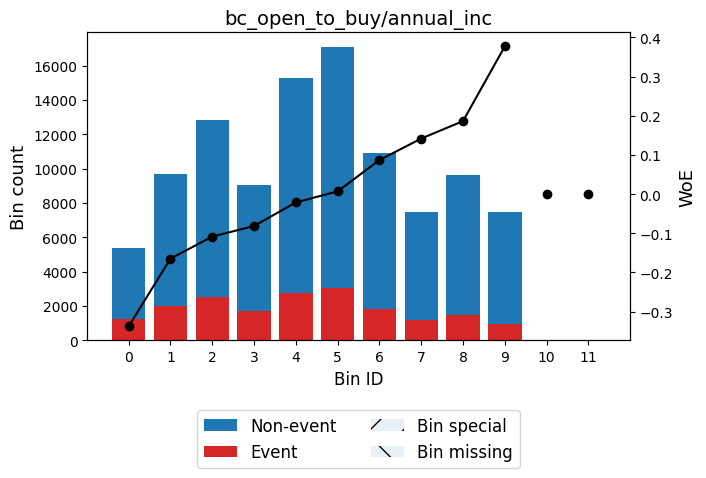


🔍 Feature: inq_last6mths_x_tl_op_past_12m
✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0453
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   62990 │             0.1597 │ 0.13896094518270075  │ 0.0110927   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │    5978 │             0.1601 │ 0.13578389633091636  │ 0.0010062   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10197 │             0.1782 │ 0.006864016829122743 │ 4.57363e-06 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │    5854 │             0.2099 │ -0.19652156787034403 │ 0.00229433  │
├──────────────┼─────────┼────────────────────┼──────

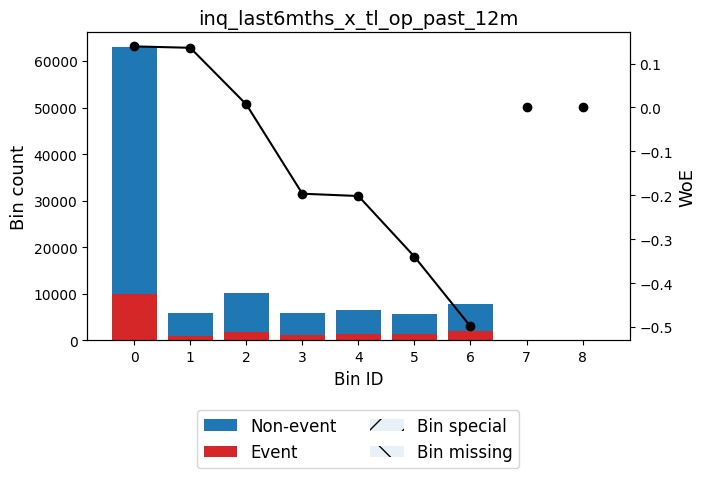


🔍 Feature: dti_x_revol_util
✅ Total IV for dti_x_revol_util: 0.0827
╒════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 161.80)     │    8048 │             0.1172 │ 0.4976906496469087    │ 0.0161151   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [161.80, 296.60)   │    7281 │             0.1228 │ 0.44451707013724007   │ 0.0118432   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [296.60, 451.05)   │    9582 │             0.138  │ 0.3104817378525573    │ 0.00795655  │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [451.05, 547.01)   │    6189 │             0.148  │ 0.2285412666055049    │ 0.0028619   │
├──────────

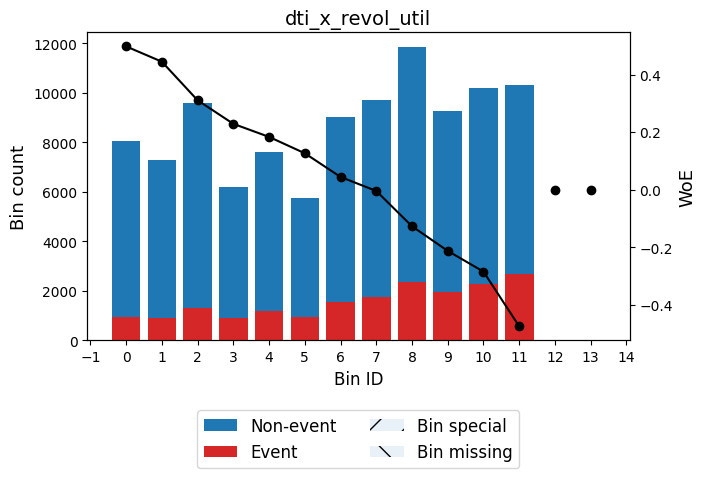


🔍 Feature: avail_ratio
✅ Total IV for avail_ratio: 0.0280
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, -96.95)   │    5246 │             0.2461 │ -0.4022336188957232   │ 0.00915632  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [-96.95, -92.35) │    8742 │             0.2077 │ -0.1831509424497062   │ 0.00296366  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [-92.35, -77.95) │   19772 │             0.1963 │ -0.11213704940710478  │ 0.00245797  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [-77.95, -68.55) │   11248 │             0.1891 │ -0.06593019727091365  │ 0.000476383 │
├──────────────────┼─────────┼───────────

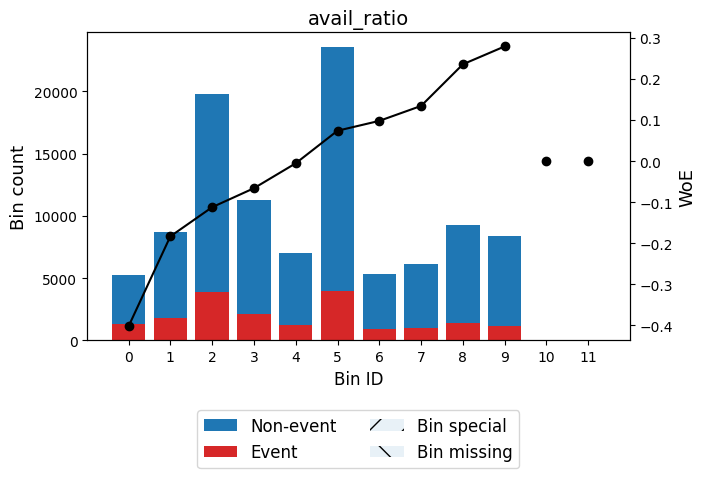


🔍 Feature: delinq2yrs_flag
✅ Total IV for delinq2yrs_flag: 0.0026
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84501 │             0.1755 │ 0.025662068882648992 │ 0.000526562 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   20311 │             0.1948 │ -0.10249686102095312 │ 0.00210314  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

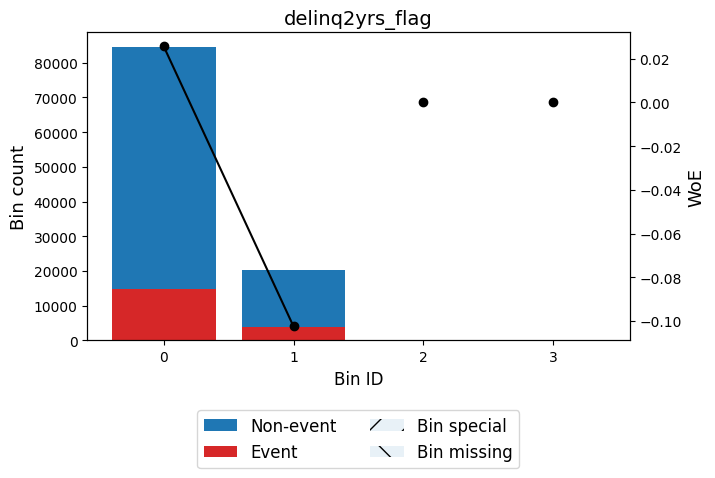


🔍 Feature: pubrec_flag
✅ Total IV for pubrec_flag: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87736 │             0.1741 │ 0.035033872780845465 │ 0.00101589 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17076 │             0.2054 │ -0.16877030024506023 │ 0.00489388 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │ 

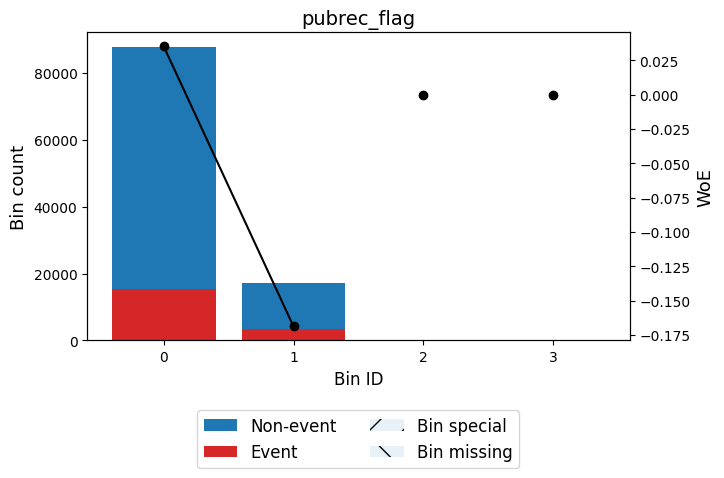


🔍 Feature: acc_now_delinq_flag
✅ Total IV for acc_now_delinq_flag: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


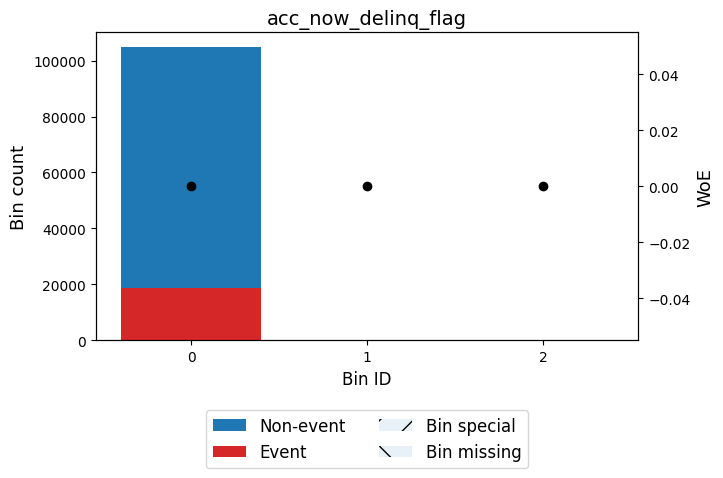


🔍 Feature: tl_op12m_x_inq6m
✅ Total IV for tl_op12m_x_inq6m: 0.0453
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   62990 │             0.1597 │ 0.13896094518270075  │ 0.0110927   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │    5978 │             0.1601 │ 0.13578389633091636  │ 0.0010062   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10197 │             0.1782 │ 0.006864016829122743 │ 4.57363e-06 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │    5854 │             0.2099 │ -0.19652156787034403 │ 0.00229433  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────

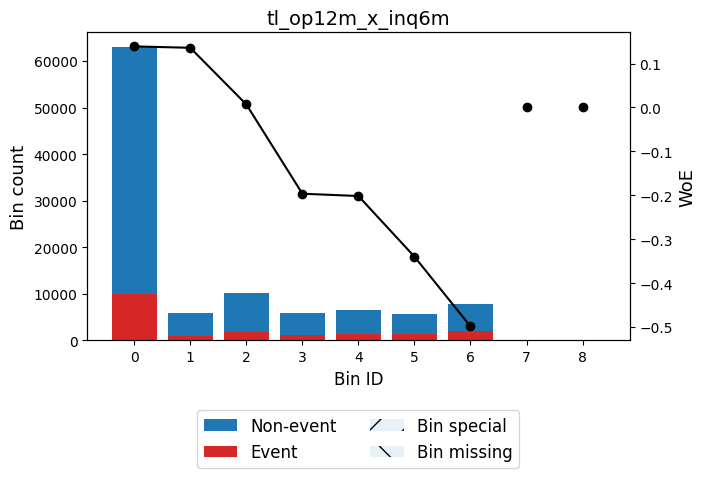


🔍 Feature: dti_x_inq
✅ Total IV for dti_x_inq: 0.0575
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 14.41)  │   70668 │             0.1575 │ 0.1550668512613469   │ 0.0154148   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14.41, 18.39) │    5806 │             0.1779 │ 0.008710739635423348 │ 4.19142e-06 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [18.39, 23.56) │    7033 │             0.1939 │ -0.09720593232993857 │ 0.000653915 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23.56, 32.05) │    8495 │             0.2211 │ -0.2623623940069837  │ 0.00605383  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───

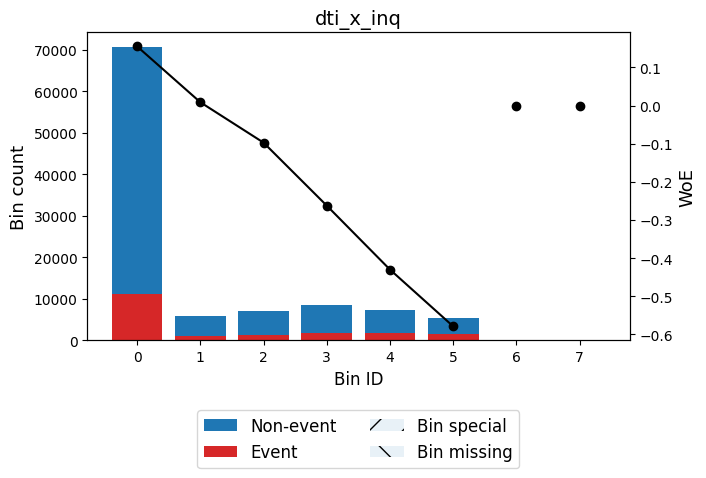


🔍 Feature: dti_x_term
✅ Total IV for dti_x_term: 0.2265
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 199.98)     │    5417 │             0.1004 │ 0.6707186877367288   │ 0.0185649   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [199.98, 288.90)   │    5375 │             0.1068 │ 0.602153003960539    │ 0.0152013   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [288.90, 426.42)   │   11738 │             0.1112 │ 0.5569737104603409   │ 0.0288458   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [426.42, 486.90)   │    6371 │             0.1296 │ 0.3822600180126545   │ 0.00782715  │
├────────────────────┼─────────┼─

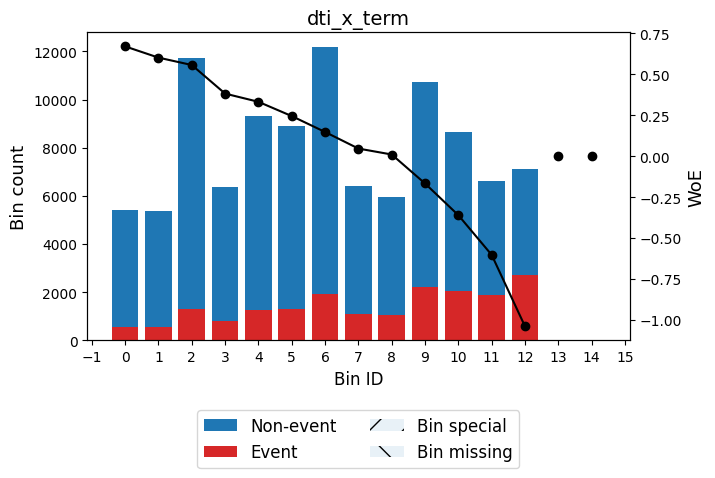


🔍 Feature: term_x_revol_util
✅ Total IV for term_x_revol_util: 0.1237
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 587.40)     │    6990 │             0.1126 │ 0.5427629683048796   │ 0.0163919   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [587.40, 1255.20)  │   15489 │             0.1371 │ 0.3180868781169244   │ 0.0134648   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1255.20, 1474.20) │    6967 │             0.148  │ 0.2287091925794218   │ 0.00322622  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1474.20, 1829.40) │   12339 │             0.1541 │ 0.1806541124638814   │ 0.00362229  │
├──────────────────

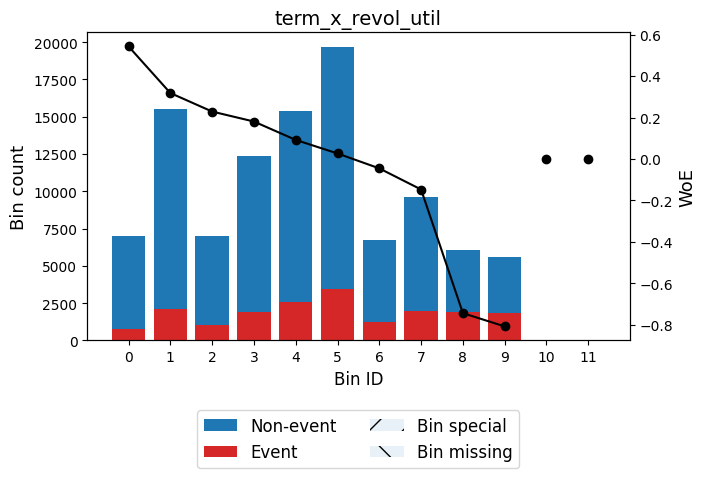


🔍 Feature: dti/fico_ratio_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: dti/fico_ratio
✅ Total IV for dti/fico_ratio: 0.1131
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.01) │    5286 │             0.108  │ 0.5893178771607128   │ 0.0143823   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.02) │   16360 │             0.1229 │ 0.44381811188381093  │ 0.0265336   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.02) │    5241 │             0.1372 │ 0.3170511868660335   │ 0.00452804  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.02) │    5597 │             0.1399 │ 0.2943538141013793   │ 0.00419995  │
├──────────────

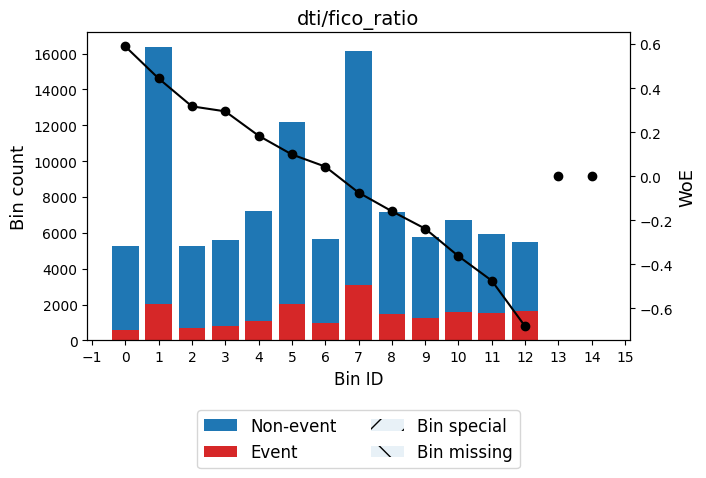


🔍 Feature: loan_amnt/tot_hi_cred_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/tot_hi_cred_lim
✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0720
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.03) │    8468 │             0.1101 │ 0.5683168933197731   │ 0.021582    │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.04) │    7789 │             0.1266 │ 0.4096655074915905   │ 0.0108889   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.06) │   10718 │             0.1346 │ 0.3388012204509303   │ 0.0104969   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.07) │    5545 │             0.156  │ 0.16652677372897817

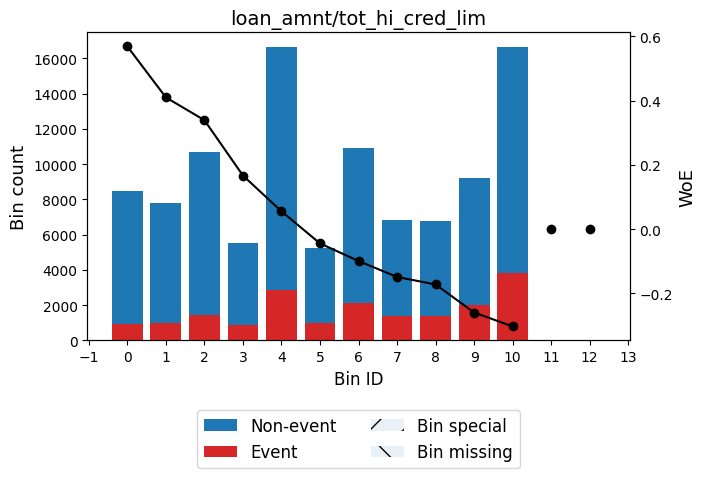


🔍 Feature: bc_open_to_buy/total_rev_hi_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/total_rev_hi_lim
✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0412
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.01) │    6334 │             0.2425 │ -0.3827795785588124  │ 0.00995579  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.03) │    6052 │             0.2087 │ -0.18896533025871665 │ 0.00218796  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.10) │   17996 │             0.2048 │ -0.16538037393010674 │ 0.00494726  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, 0.16) │   12278 │             0.1964 │ -

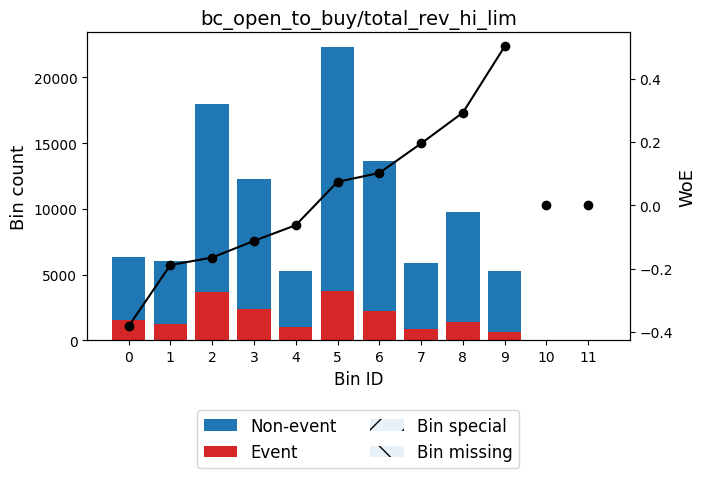


🔍 Feature: fico_score/int_rate_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: fico_score/int_rate
✅ Total IV for fico_score/int_rate: 0.4667
╒═════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 33.89)   │    7591 │             0.392  │ -1.0830653572668647  │ 0.113511    │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33.89, 37.96)  │    7693 │             0.315  │ -0.7447731875319524  │ 0.0504575   │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37.96, 40.76)  │    5824 │             0.2747 │ -0.5510181910926102  │ 0.0198856   │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40.76, 43.47)  │    5424 │             0.2443 │ -0.3924

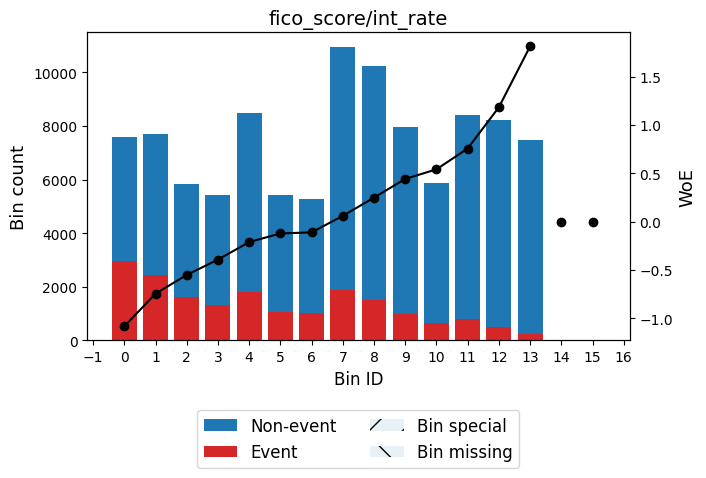


🔍 Feature: installment/annual_inc/12
✅ Total IV for installment/annual_inc/12: 0.0928
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.03) │   10604 │             0.1093 │ 0.5761308283450233    │ 0.0276999   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.03, 0.05) │   13180 │             0.1317 │ 0.36408485069887053   │ 0.0147798   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.05, 0.05) │    5599 │             0.1395 │ 0.2977419250842961    │ 0.00429384  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.05, 0.06) │   11118 │             0.1579 │ 0.15182333941411907   │ 0.00232726  │
├──────────────┼─────────┼────────────────────┼──────

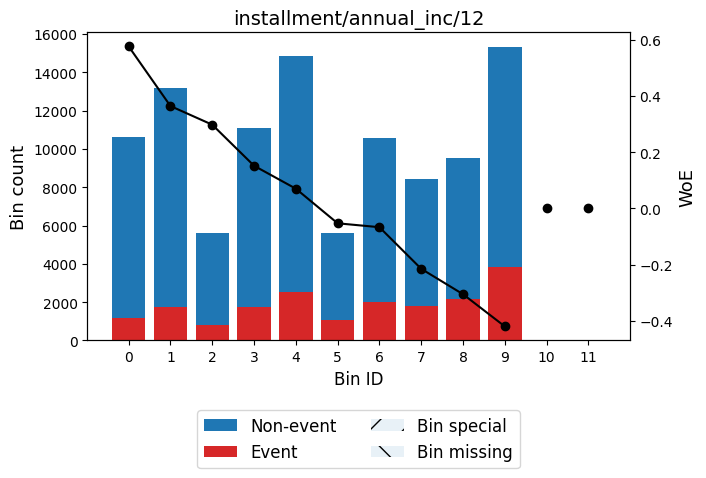


🔍 Feature: installment/annual_inc/12_x_term
✅ Total IV for installment/annual_inc/12_x_term: 0.2222
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │         IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪════════════╡
│ (-inf, 1.17) │   11502 │             0.1042 │ 0.6291501306667189    │ 0.0351839  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [1.17, 1.82) │   14233 │             0.1154 │ 0.5145819007502901    │ 0.0302919  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [1.82, 2.41) │   13917 │             0.1335 │ 0.34851352047897377   │ 0.0143753  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [2.41, 2.75) │    7675 │             0.1444 │ 0.2577034106329086    │ 0.00446888 │
├──────────────┼─────────┼────────────────────┼──

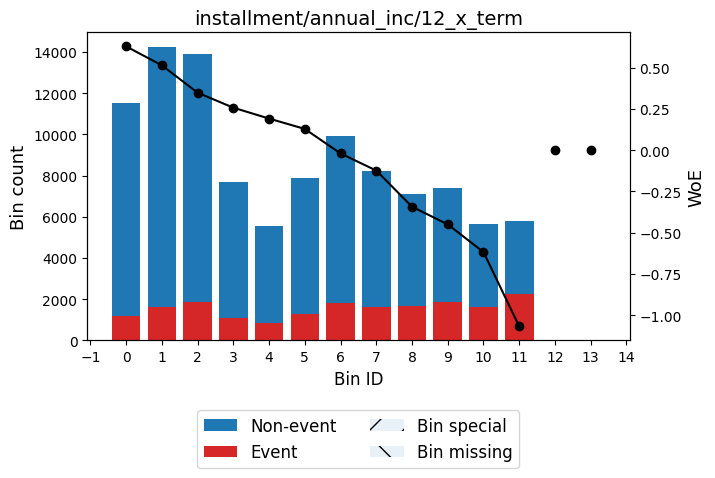

✅ Total IV for grade_numeric: 0.4549
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 1.50) │   18844 │             0.0549 │ 1.3235054125257015   │ 0.201045   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   31135 │             0.1206 │ 0.46462462658697423  │ 0.0549515  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50) │   28953 │             0.2003 │ -0.13709939881758326 │ 0.00542222 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50) │   15254 │             0.2714 │ -0.5342873212303285  │ 0.0487464  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, inf)  │   10626 │             

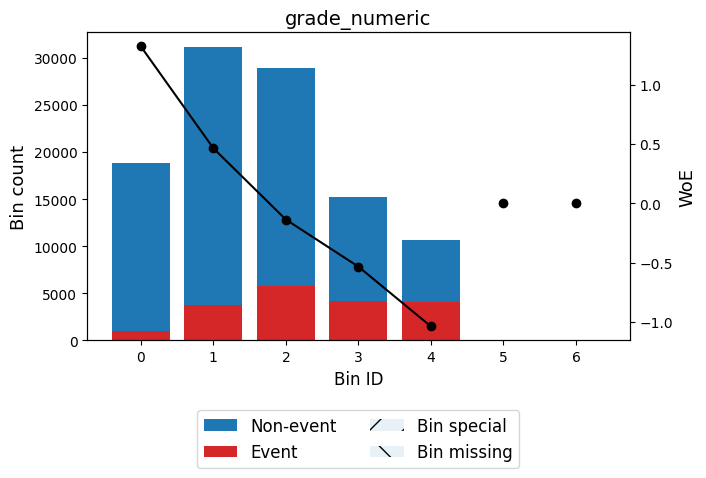

In [48]:
# ========================================== Train - Test Split ==========================================
numerical_cols1 = get_numerical_cols(df1, TARGET_COL)

train_df1 , test_df1 = sample_split_order(initial_df=df1, sample_frac=0.1, cut_off_date=CUT_DATE, date_col='issue_d')

# == Observe IV of Numerical Variables == 
for feature in numerical_cols1:
    if feature == "id":
        continue

    print(f"\n🔍 Feature: {feature}")

    if train_df1[feature].nunique() < 2:
        print("⚠️ Not enough variation. Skipping.")
        iv_categories["no_variation"].append(feature)
        continue

    x, y = train_df1[feature], train_df1[TARGET_COL]
    first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto')

    
train_df1 = tx_grade(train_df1)

first_bin_and_classify_feature('grade_numeric', train_df1['grade_numeric'], train_df1[TARGET_COL], dtype='numerical',monotonic_trend_type='auto' )


### 2.4  Display Feature Importance 

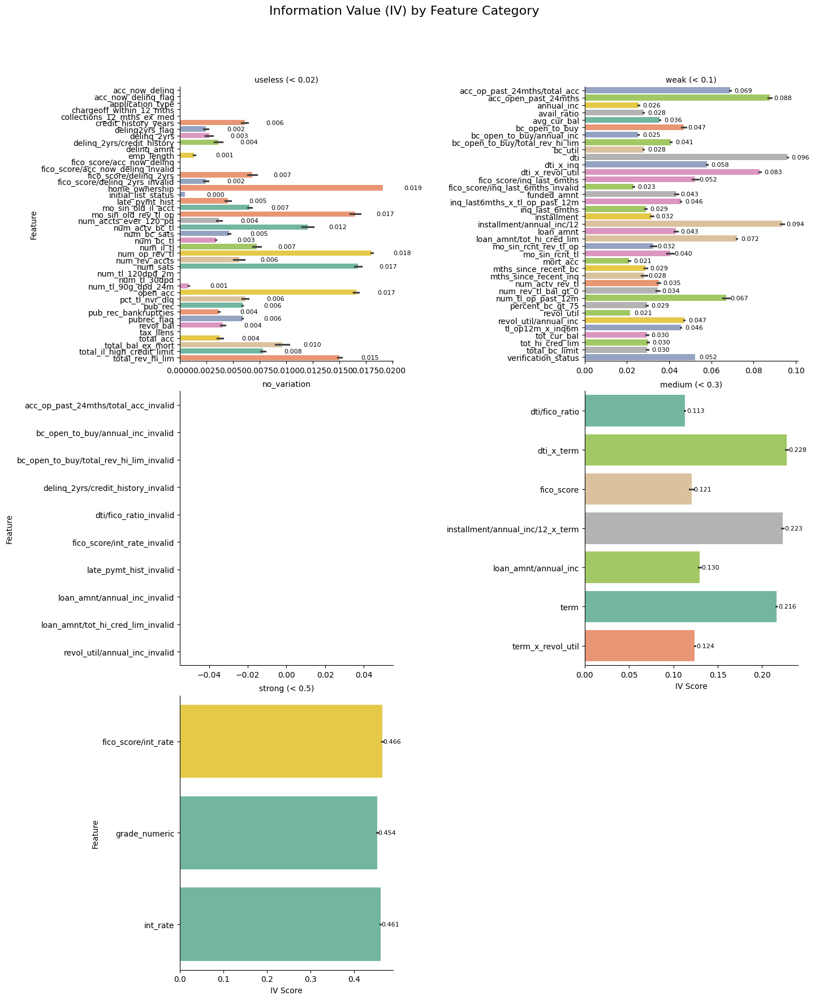

In [49]:
plot_iv_by_category(iv_categories)

In [50]:
# == Define columns to abandon & keep (Based on train_df1) == 
no_variation_columns = [
    item
    for category, feature_list in iv_categories.items()
    if category == 'no_variation'
    for item in feature_list
    
]

useless_cols = [
    feature
    for category, feature_list in iv_categories.items()
    if category == 'useless (< 0.02)'
    for feature, _ in feature_list
]

throw_cols = no_variation_columns + useless_cols
keep_cols = [c for c in train_df1.columns if c not in throw_cols]

train_df1 = train_df1.drop(columns=throw_cols)
print("✅ Dropped columns with IV < 0.02 and columns with no variation in TRAIN_DF1")


✅ Dropped columns with IV < 0.02 and columns with no variation in TRAIN_PDF


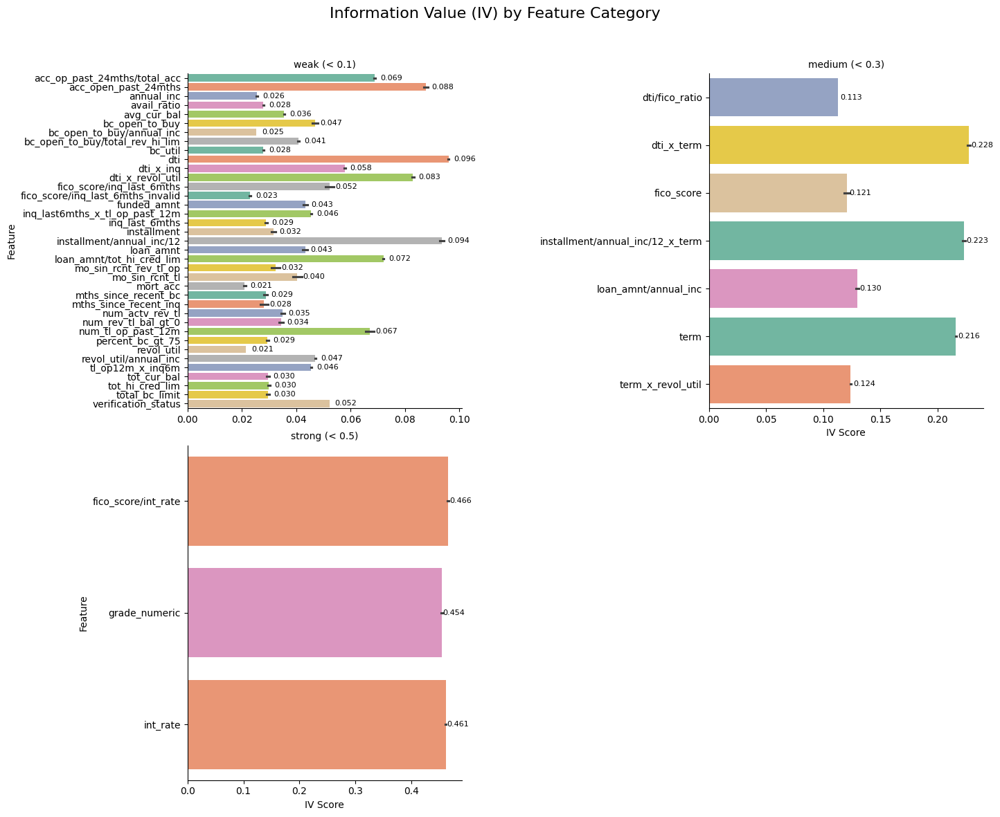

In [51]:
# == Leftover Columns IV in TRAIN_DF1 == 
updated_iv_categories = get_updated_iv_categories(iv_categories, train_df1)

plot_iv_by_category(updated_iv_categories)


In [53]:
sorted(train_df1.columns)

['acc_op_past_24mths/total_acc',
 'acc_open_past_24mths',
 'annual_inc',
 'avail_ratio',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_open_to_buy/annual_inc',
 'bc_open_to_buy/total_rev_hi_lim',
 'bc_util',
 'default_status',
 'dti',
 'dti/fico_ratio',
 'dti_x_inq',
 'dti_x_revol_util',
 'dti_x_term',
 'fico_score',
 'fico_score/inq_last_6mths',
 'fico_score/inq_last_6mths_invalid',
 'fico_score/int_rate',
 'funded_amnt',
 'grade',
 'grade_numeric',
 'id',
 'inq_last6mths_x_tl_op_past_12m',
 'inq_last_6mths',
 'installment',
 'installment/annual_inc/12',
 'installment/annual_inc/12_x_term',
 'int_rate',
 'issue_d',
 'loan_amnt',
 'loan_amnt/annual_inc',
 'loan_amnt/tot_hi_cred_lim',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_inq',
 'num_actv_rev_tl',
 'num_rev_tl_bal_gt_0',
 'num_tl_op_past_12m',
 'percent_bc_gt_75',
 'revol_util',
 'revol_util/annual_inc',
 'term',
 'term_x_revol_util',
 'tl_op12m_x_inq6m',
 'tot_cur_bal',
 'tot_h

### 2.5 Feature Filtering 

Now that we have identified the more relevant/important features for PD Modeling, lets observe the features' monotonicity of WoE. The following rules shall be implemented to counter different scenarios. 
- hello 

✅ Total IV for loan_amnt: 0.0425
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3512.50)      │    5505 │             0.1328 │ 0.3547292388981622   │ 0.00587858  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3512.50, 6012.50)   │   13137 │             0.1414 │ 0.2816448410152983   │ 0.00906359  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6012.50, 9037.50)   │   13853 │             0.1424 │ 0.2740951210448719   │ 0.00907497  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9037.50, 10012.50)  │    9881 │             0.1631 │ 0.1132408304047583   │ 0.00116534  │
├──────────────────────┼─────────┼───

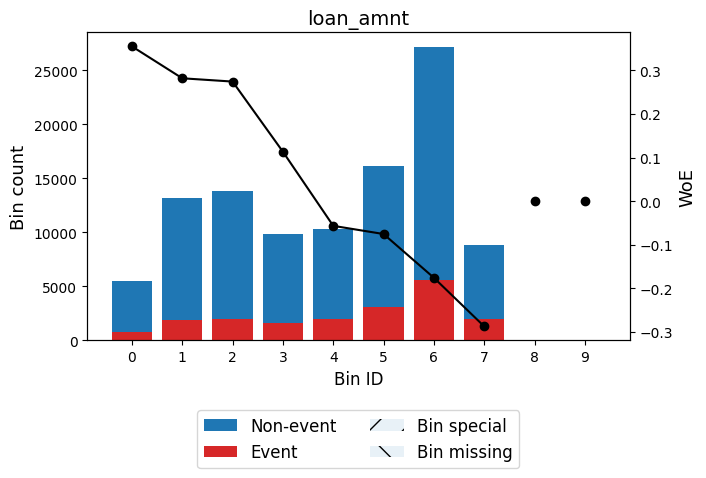

✅ Total IV for funded_amnt: 0.0426
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3512.50)      │    5508 │             0.1327 │ 0.35535744538934844  │ 0.00590139  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3512.50, 6012.50)   │   13145 │             0.1413 │ 0.2823538723310077   │ 0.00911267  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6012.50, 9037.50)   │   13861 │             0.1424 │ 0.2735863167363628   │ 0.00904807  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9037.50, 10012.50)  │    9879 │             0.1632 │ 0.11299893393526705  │ 0.00116022  │
├──────────────────────┼─────────┼─

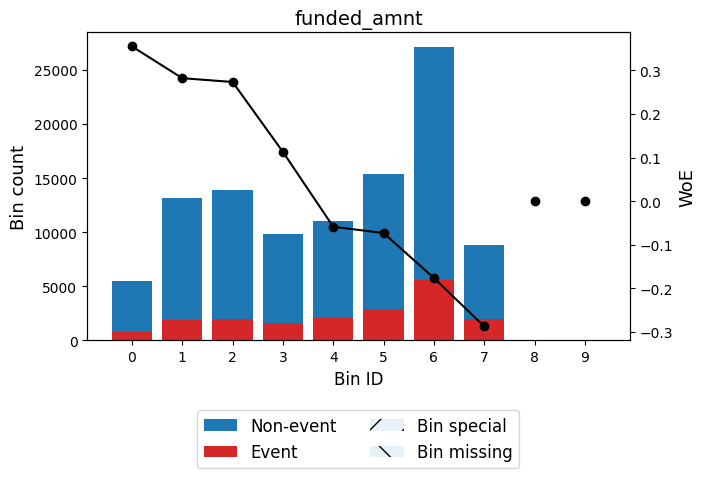

✅ Total IV for term: 0.2158
╒═══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                 │        IV │
╞═══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 48.00) │   79670 │             0.1384 │ 0.3071963240999305  │ 0.0648341 │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [48.00, inf)  │   25142 │             0.3086 │ -0.7151578510232436 │ 0.150935  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│               │  104812 │             0.1792 │           

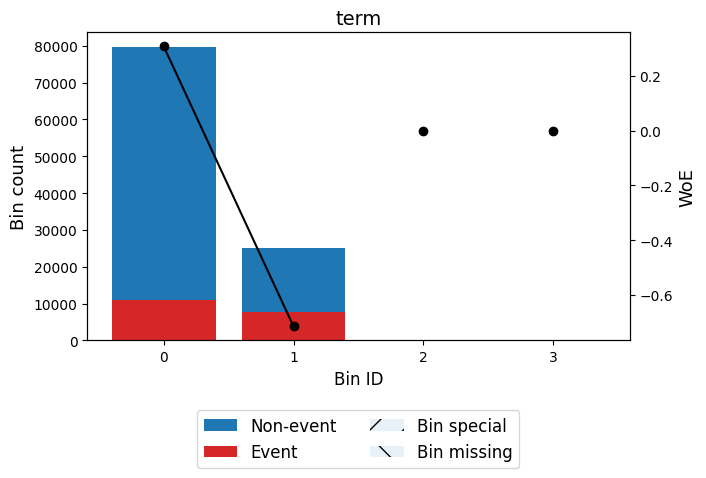

✅ Total IV for int_rate: 0.4619
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 6.83)   │    6499 │             0.0348 │ 1.8016778805736227   │ 0.109693    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.83, 8.12)   │    9875 │             0.0625 │ 1.1865771894349932   │ 0.0887121   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.12, 8.96)   │    5496 │             0.091  │ 0.7799876645724417   │ 0.0245318   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.96, 9.73)   │    5251 │             0.104  │ 0.6319649680237402   │ 0.0161908   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9.73, 11

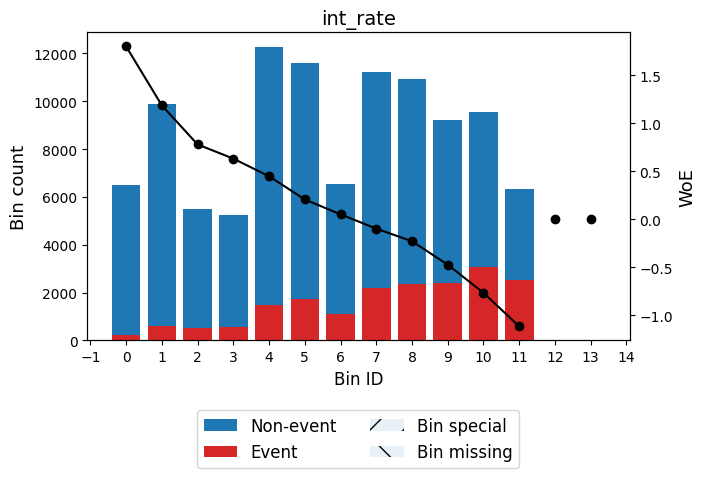

✅ Total IV for installment: 0.0310
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 126.24)   │    6196 │             0.1256 │ 0.4189583902158138   │ 0.00903081  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [126.24, 193.38) │    9977 │             0.1362 │ 0.3253067957738047   │ 0.00904933  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [193.38, 255.22) │   10625 │             0.154  │ 0.181950261159872    │ 0.00316268  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [255.22, 337.48) │   18024 │             0.1742 │ 0.03465260835708839  │ 0.000204206 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─

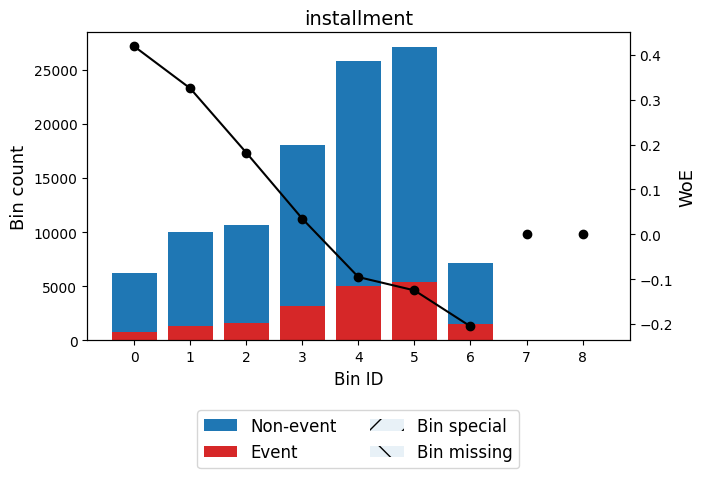

✅ Total IV for grade: 0.4549
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ ['A']         │   18844 │             0.0549 │ 1.3235054125257015   │ 0.201045   │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['B']         │   31135 │             0.1206 │ 0.46462462658697423  │ 0.0549515  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['C']         │   28953 │             0.2003 │ -0.13709939881758326 │ 0.00542222 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['D']         │   15254 │             0.2714 │ -0.5342873212303285  │ 0.0487464  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['E' 'F' 'G'] │   10626 │         

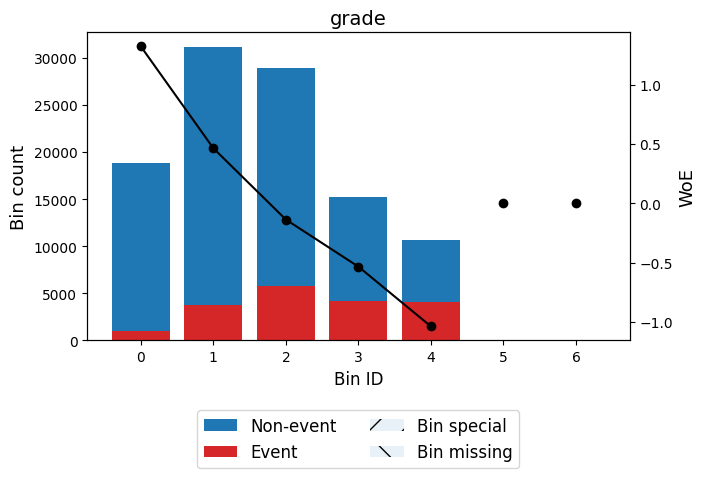

✅ Total IV for annual_inc: 0.0253
╒════════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 30054.00)       │    7657 │             0.2117 │ -0.2070988100987714   │ 0.0033435   │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [30054.00, 45752.50)   │   18626 │             0.2042 │ -0.16173768940481148  │ 0.00489185  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [45752.50, 60313.50)   │   22216 │             0.1904 │ -0.07469740284117798  │ 0.00121114  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [60313.50, 75642.10)   │   17886 │             0.1811 │ -0.012826212103856927 │ 2.81893e-05 │
├─────

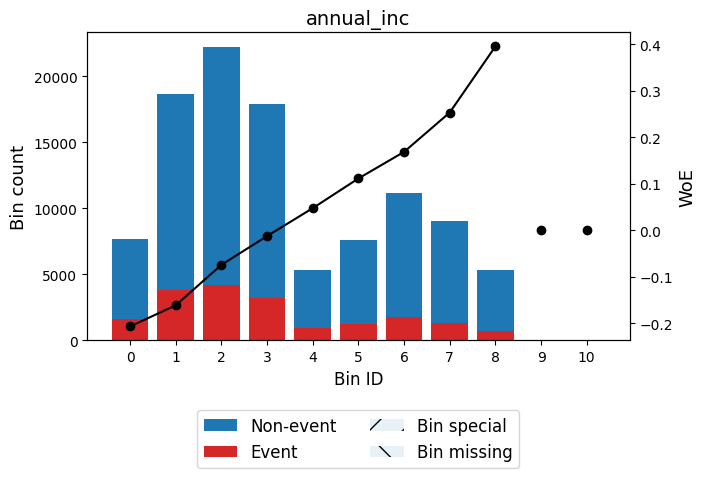

✅ Total IV for verification_status: 0.0513
╒═════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                 │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ ['Not Verified']    │   31218 │             0.1319 │ 0.3626487765352546   │ 0.0347486  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Source Verified'] │   40037 │             0.1884 │ -0.06136163221477009 │ 0.00146669 │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Verified']        │   33557 │             0.2122 │ -0.21029680341900736 │ 0.0151238  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special             │       0 │             0      │ 0.0                  │ 0          │
├─────────────────────┼─────────┼──────────────

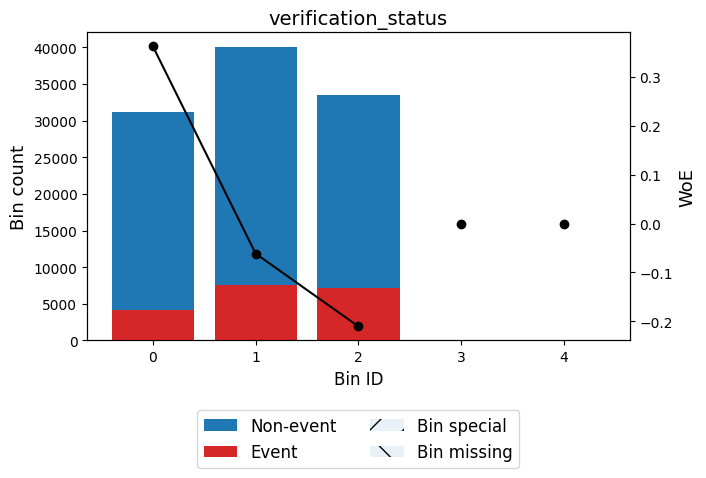

✅ Total IV for issue_d: 0.0312
╒══════════════════════════════════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                                              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════════════════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1337169554291294208.00)                   │    5274 │             0.1348 │ 0.33726604287332673   │ 0.00512113  │
├──────────────────────────────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1337169554291294208.00, 1394971155441385472.00) │   21602 │             0.1486 │ 0.22348189115863226   │ 0.00956786  │
├──────────────────────────────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1394971155441385472.00, 1405512035977920512.00) │    7743 │             0.1713 │ 0.05498671875387262   │ 0.00021

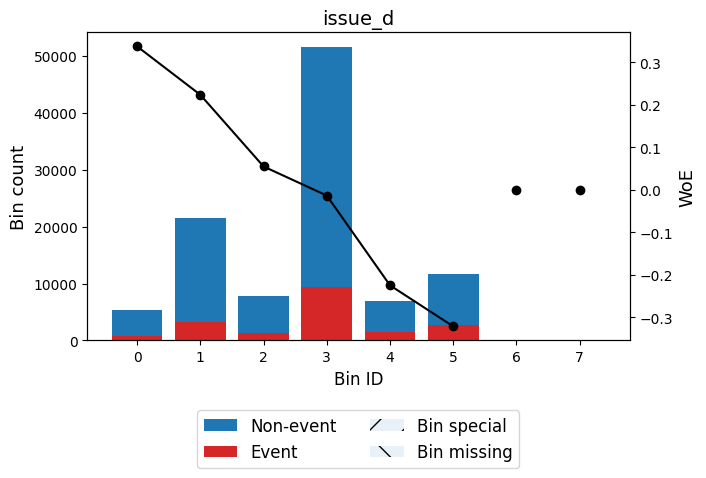

✅ Total IV for default_status: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104812 │             0.1792 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104812 │             0.1792 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


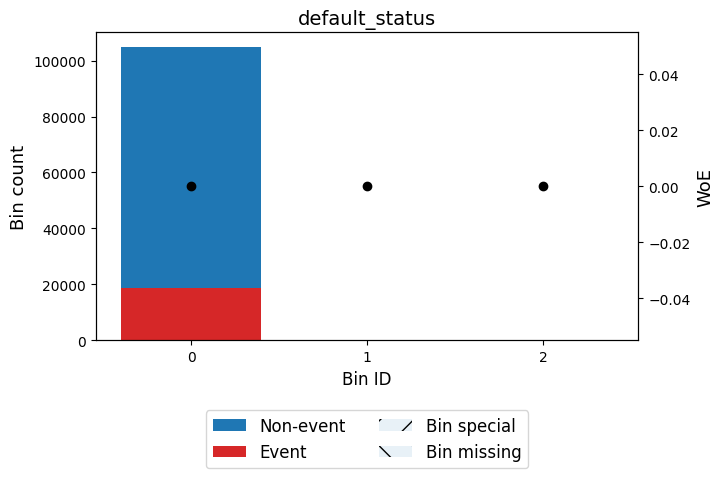

✅ Total IV for dti: 0.0958
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 5.90)   │    6713 │             0.1132 │ 0.5365350316221784   │ 0.015416    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.90, 10.77)  │   14813 │             0.1273 │ 0.4036705726279306   │ 0.0201476   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10.77, 12.65) │    7908 │             0.1381 │ 0.3094648039534664   │ 0.00652581  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12.65, 14.32) │    7503 │             0.1506 │ 0.2080555753570732   │ 0.00289506  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14.32, 15.57)

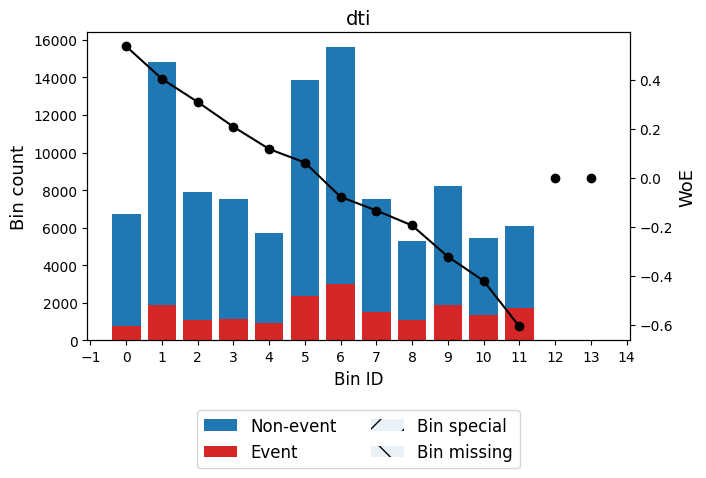

✅ Total IV for inq_last_6mths: 0.0285
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   59331 │             0.1597 │ 0.13868499102895826  │ 0.0104078  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   28869 │             0.1915 │ -0.08141172387415341 │ 0.00187345 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10810 │             0.2195 │ -0.2533252905209715  │ 0.0071625  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    5802 │             0.2423 │ -0.3818508650979331  │ 0.00907295 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │            

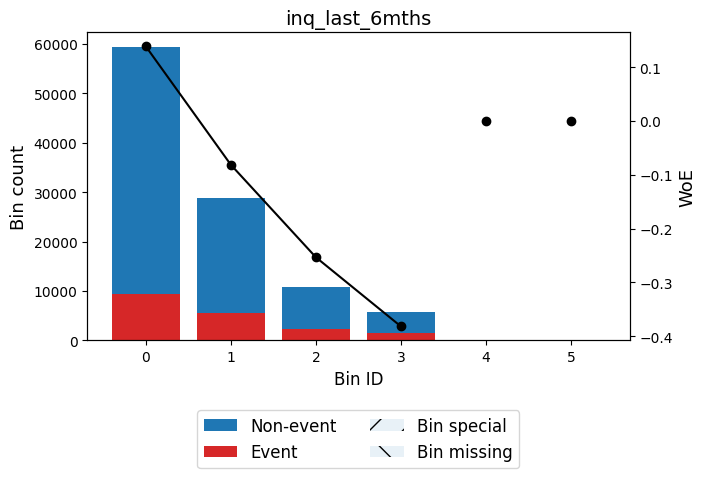

✅ Total IV for revol_util: 0.0214
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 15.95)  │    7399 │             0.1285 │ 0.39221411339023926  │ 0.00953748  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.95, 25.55) │    7594 │             0.1484 │ 0.2253559791559816   │ 0.00341802  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [25.55, 34.95) │   10481 │             0.1594 │ 0.14066808208399673  │ 0.00189029  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [34.95, 42.45) │   10075 │             0.1746 │ 0.03163879598951058  │ 9.52472e-05 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [42.45,

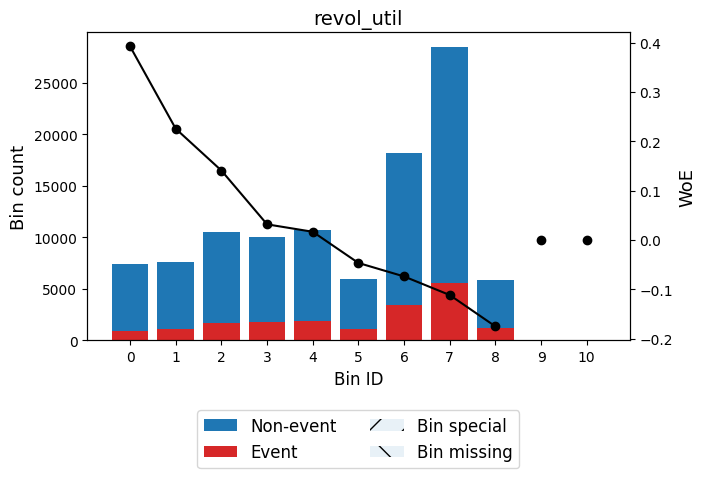

✅ Total IV for tot_cur_bal: 0.0290
╒════════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11512.50)       │    7069 │             0.1603 │ 0.13436941556837545   │ 0.00116572  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11512.50, 19544.50)   │    7548 │             0.1842 │ -0.033348805891126654 │ 8.09491e-05 │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [19544.50, 35140.00)   │   14372 │             0.1994 │ -0.13184579921571316  │ 0.00248514  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [35140.00, 48671.00)   │    8858 │             0.2128 │ -0.21367938091193528  │ 0.00412592  │
├────

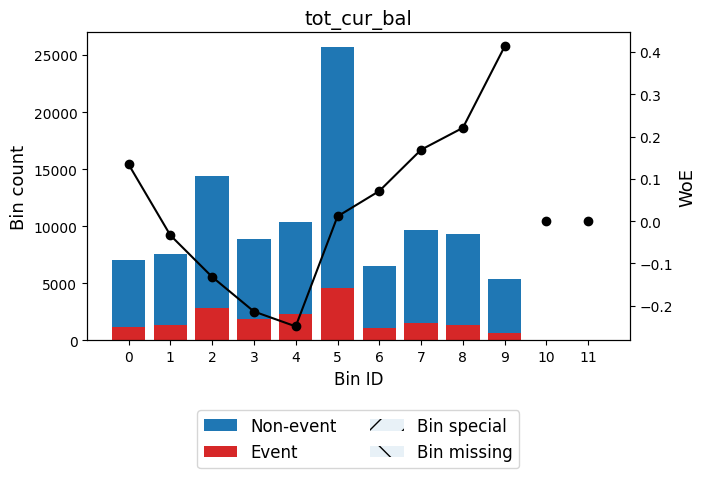

✅ Total IV for acc_open_past_24mths: 0.0885
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   13507 │             0.1202 │ 0.4684194573175684   │ 0.0241988   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   13183 │             0.1384 │ 0.30718138134631     │ 0.0107271   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   15097 │             0.1592 │ 0.14261437587911163  │ 0.00279689  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   18572 │             0.1636 │ 0.11003465757303976  │ 0.00207023  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 5.50) │   12

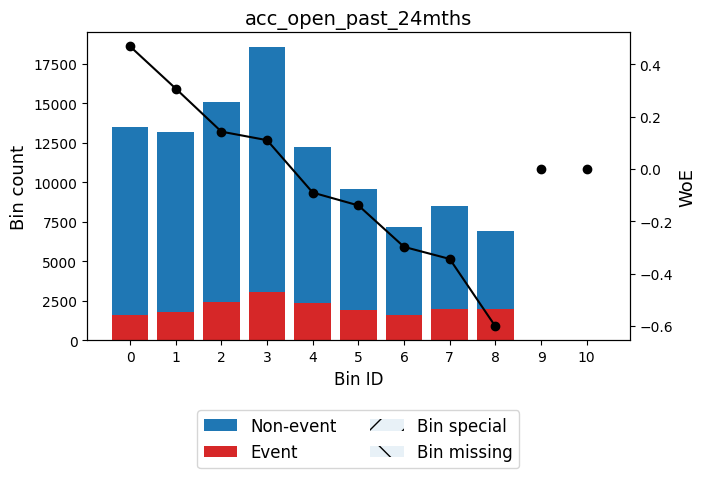

✅ Total IV for avg_cur_bal: 0.0357
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 7248.50)      │   48604 │             0.2013 │ -0.14335397411910056  │ 0.00997122  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7248.50, 13524.50)  │   22179 │             0.1808 │ -0.011175890235493258 │ 2.65247e-05 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13524.50, 19791.50) │   11448 │             0.1682 │ 0.07698684922132659   │ 0.000631461 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [19791.50, 24099.50) │    5859 │             0.1516 │ 0.20060745485166764   │ 0.00210695  │
├──────────────────────┼─

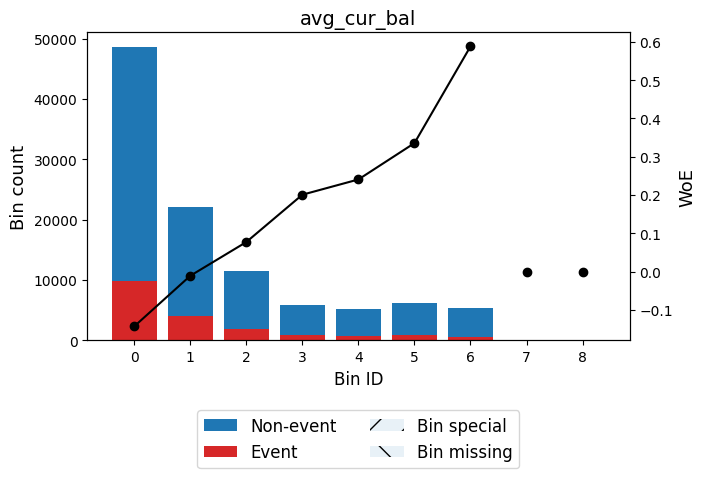

✅ Total IV for bc_open_to_buy: 0.0479
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 142.50)       │    5328 │             0.2416 │ -0.37761885076848767 │ 0.00813809  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [142.50, 401.50)     │    5792 │             0.2136 │ -0.21826067094926405 │ 0.00281868  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [401.50, 1275.50)    │   12965 │             0.2025 │ -0.15085813521413893 │ 0.00295242  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1275.50, 3398.50)   │   19431 │             0.1991 │ -0.1296383836190098  │ 0.00324613  │
├──────────────────────┼────────

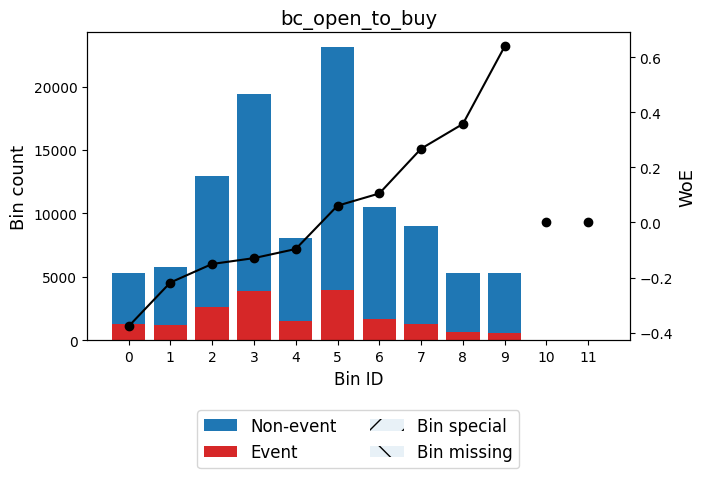

✅ Total IV for bc_util: 0.0280
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 18.55)  │    8411 │             0.1417 │ 0.27928676226303106   │ 0.00571074  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [18.55, 32.95) │    9300 │             0.1471 │ 0.23575828320635606   │ 0.00456539  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [32.95, 40.45) │    6152 │             0.1603 │ 0.13440051080231563   │ 0.00101496  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [40.45, 46.15) │    5338 │             0.1652 │ 0.09801761734949377   │ 0.000474016 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│

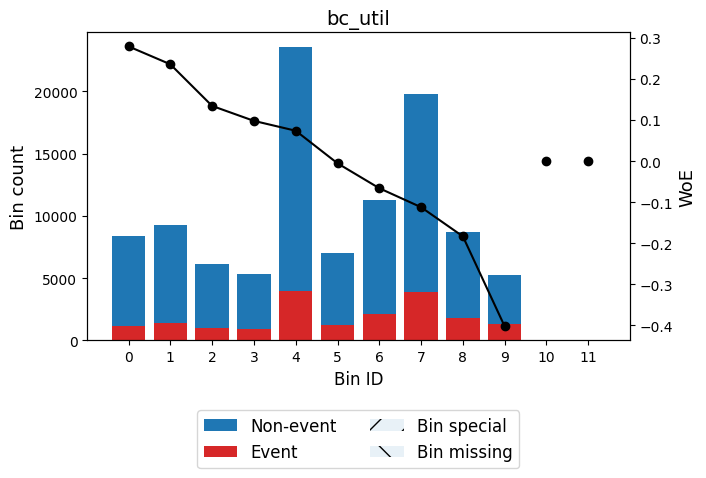

✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0339
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50)   │    7967 │             0.2219 │ -0.2672580837465044  │ 0.0059001   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50)   │    8105 │             0.2116 │ -0.20647592047929475 │ 0.0035172   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)   │    7701 │             0.2072 │ -0.1801894997157838  │ 0.0025247   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    6893 │             0.1945 │ -0.10105448934587291 │ 0.000693488 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

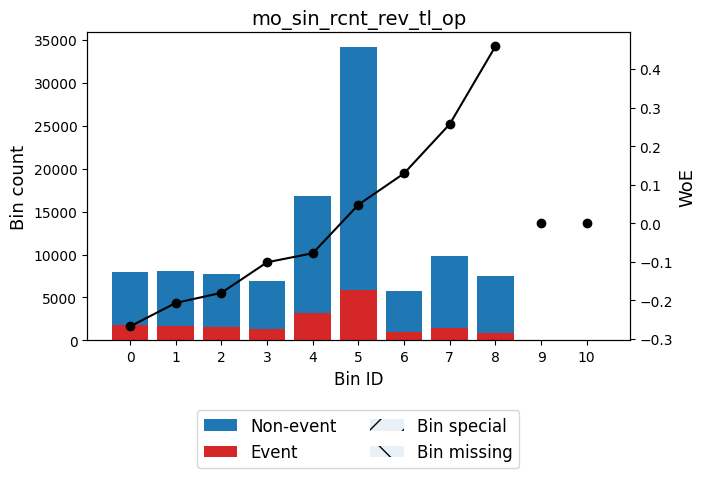

✅ Total IV for mo_sin_rcnt_tl: 0.0420
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50)   │    9981 │             0.2219 │ -0.2672942804384584  │ 0.00739369  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50)   │   11068 │             0.214  │ -0.22051979961205603 │ 0.00550211  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)   │   10657 │             0.2089 │ -0.19008797216364948 │ 0.00390004  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    9371 │             0.1936 │ -0.09485717390519688 │ 0.000829088 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.

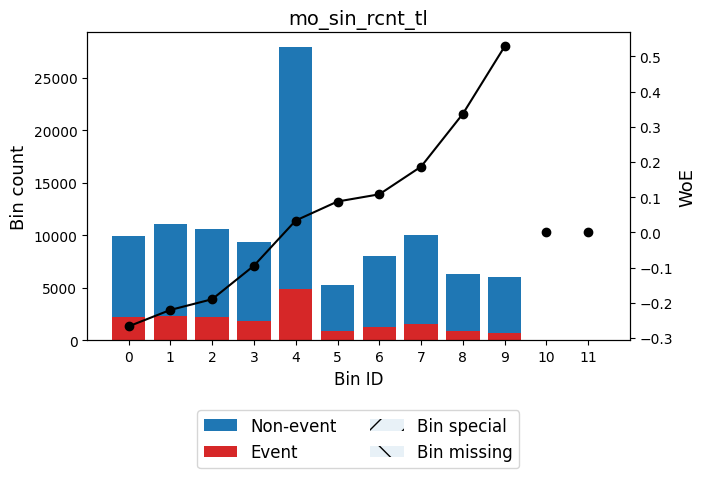

✅ Total IV for mort_acc: 0.0206
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   39754 │             0.2034 │ -0.15631404724166087 │ 0.00973597  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36182 │             0.1736 │ 0.038180353349652085 │ 0.000497075 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   10862 │             0.1631 │ 0.11326894775566343  │ 0.00128166  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │    7597 │             0.1497 │ 0.21543899477527662  │ 0.00313537  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, inf)  │   10417 │       

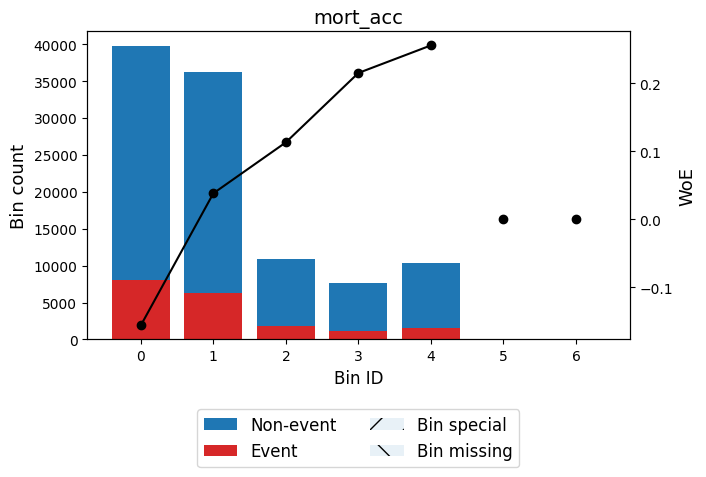

✅ Total IV for mths_since_recent_bc: 0.0294
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   13518 │             0.2189 │ -0.2496699048445301  │ 0.00869056  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 7.50)   │   16964 │             0.2002 │ -0.1370494239261102  │ 0.00317459  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 11.50)  │   13340 │             0.1914 │ -0.08072454111688954 │ 0.00085096  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 17.50) │   20500 │             0.1755 │ 0.025256714343114384 │ 0.000123757 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤

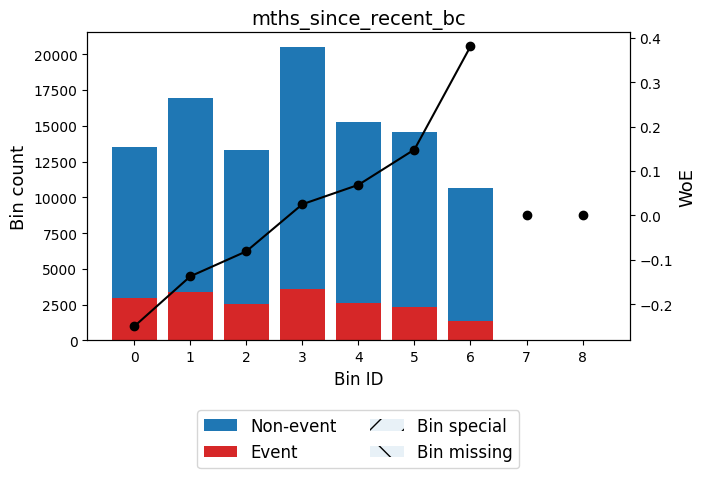

✅ Total IV for mths_since_recent_inq: 0.0295
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │    8209 │             0.2187 │ -0.24831902892011382 │ 0.00521838  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   10409 │             0.2153 │ -0.22849522220726048 │ 0.00556906  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │    8216 │             0.2072 │ -0.17964743154797547 │ 0.00267691  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │    7317 │             0.2043 │ -0.16227946977005314 │ 0.00193493  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │    

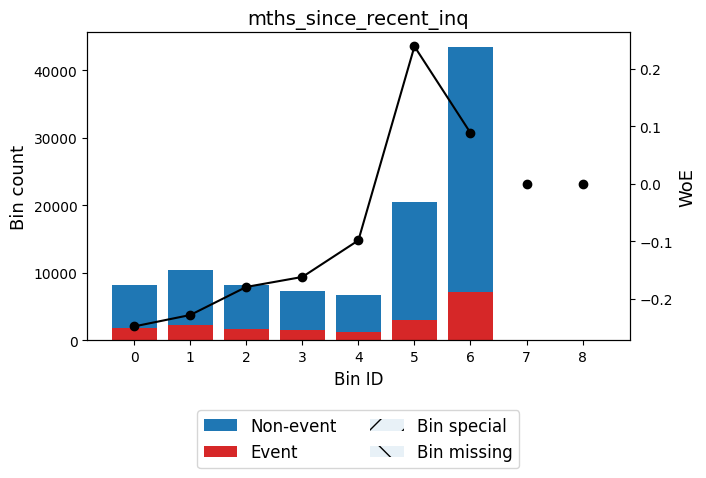

✅ Total IV for num_actv_rev_tl: 0.0344
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   11696 │             0.1456 │ 0.24769633794826618   │ 0.0063126   │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50)  │   13393 │             0.1568 │ 0.16044861176132108   │ 0.00312217  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 5.50)  │   36046 │             0.167  │ 0.08517930541854857   │ 0.00242745  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 6.50)  │   11809 │             0.1826 │ -0.022783013431107335 │ 5.89103e-05 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6

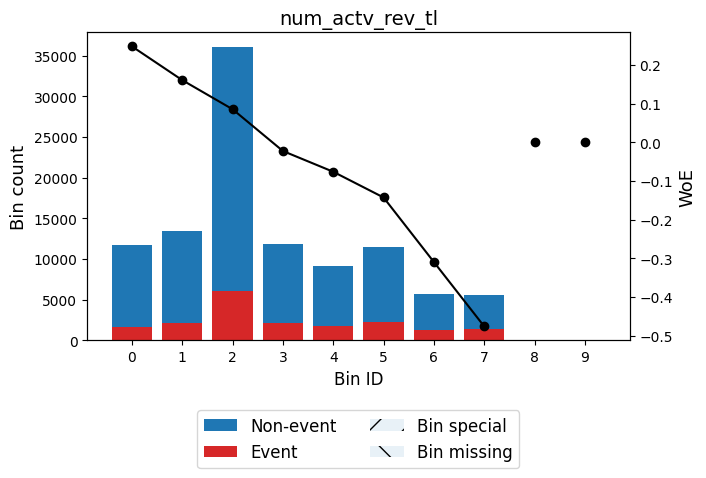

✅ Total IV for num_rev_tl_bal_gt_0: 0.0337
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   11712 │             0.1453 │ 0.2499834549251121   │ 0.00643359  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50)  │   13471 │             0.1577 │ 0.15385518017832522  │ 0.00289384  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50)  │   36204 │             0.1674 │ 0.08247899006189474  │ 0.00228797  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 6.50)  │   11871 │             0.1839 │ -0.03160917956785059 │ 0.000114312 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.50, 7.

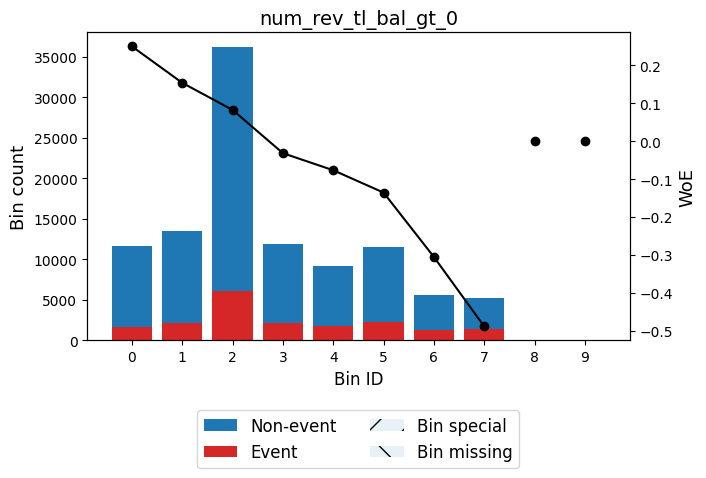

✅ Total IV for num_tl_op_past_12m: 0.0686
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   16609 │             0.1314 │ 0.3670624553019213   │ 0.0189119  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   24452 │             0.152  │ 0.1974263909674372   │ 0.0085255  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   29153 │             0.1696 │ 0.06675263644489116  │ 0.00121297 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50) │   16322 │             0.21   │ -0.19701202209793967 │ 0.00642993 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50) │    9404 │        

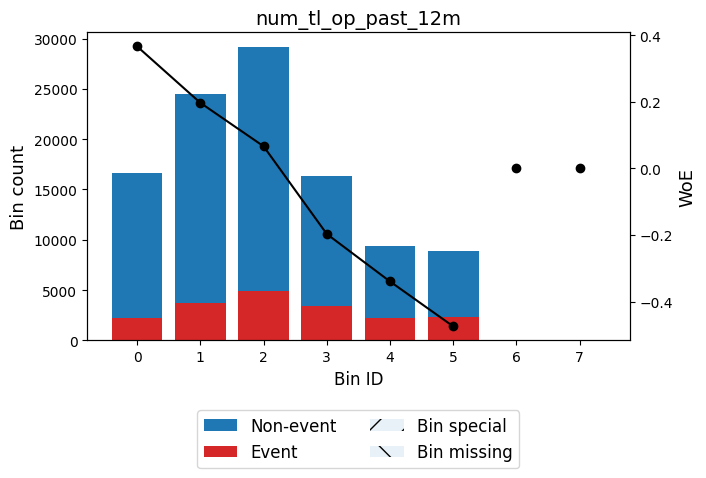

✅ Total IV for percent_bc_gt_75: 0.0290
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 5.75)   │   21247 │             0.1437 │ 0.26317004739629457   │ 0.0128783   │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.75, 26.40)  │   13217 │             0.1637 │ 0.10894641509374847   │ 0.00144482  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [26.40, 45.85) │   18534 │             0.1675 │ 0.08182495580326243   │ 0.00115303  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [45.85, 52.65) │   11668 │             0.1836 │ -0.029512177897723202 │ 9.78785e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼───────

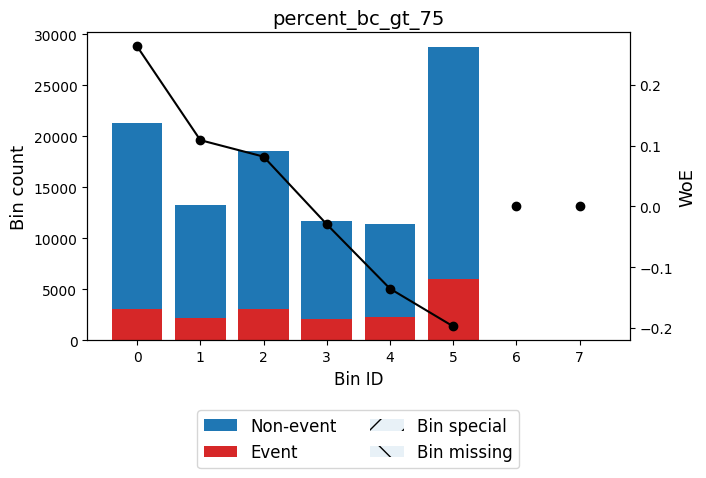

✅ Total IV for tot_hi_cred_lim: 0.0296
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 19799.50)       │    5242 │             0.1768 │ 0.016101929700838458 │ 1.29002e-05 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [19799.50, 46968.50)   │   17678 │             0.1962 │ -0.11178790958250939 │ 0.00218375  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [46968.50, 59894.00)   │    7893 │             0.2158 │ -0.2312534232348813  │ 0.00432913  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [59894.00, 111184.50)  │   18096 │             0.2051 │ -0.16691249332578417 │ 0.00506975  │
├──────────

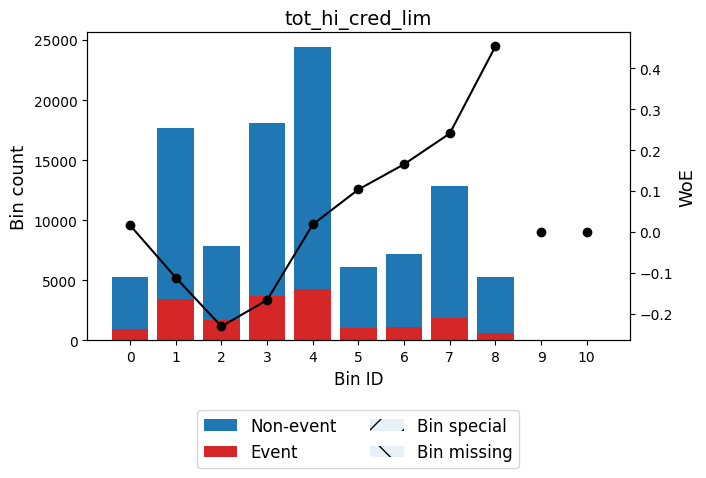

✅ Total IV for total_bc_limit: 0.0301
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2985.00)      │    6693 │             0.2154 │ -0.22940961245786995 │ 0.00361063  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2985.00, 4425.00)   │    5433 │             0.2061 │ -0.1734920758921319  │ 0.00164781  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4425.00, 7125.00)   │   10971 │             0.2014 │ -0.14447957009626955 │ 0.00228701  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7125.00, 11041.00)  │   15147 │             0.2004 │ -0.13781183606720337 │ 0.00286687  │
├──────────────────────┼────────

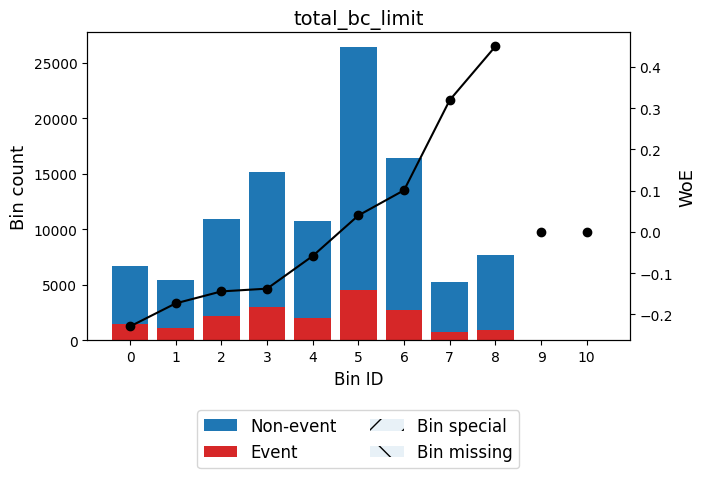

✅ Total IV for fico_score: 0.1235
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 664.50)   │    9258 │             0.2412 │ -0.37566786588904644  │ 0.0139872   │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [664.50, 669.50) │    9216 │             0.2357 │ -0.3452693196885641   │ 0.0116577   │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [669.50, 674.50) │    9325 │             0.2217 │ -0.2657910801595873   │ 0.00682718  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [674.50, 679.50) │    8259 │             0.2165 │ -0.23556412892702805  │ 0.00470647  │
├──────────────────┼─────────┼────────────────────┼───────────────

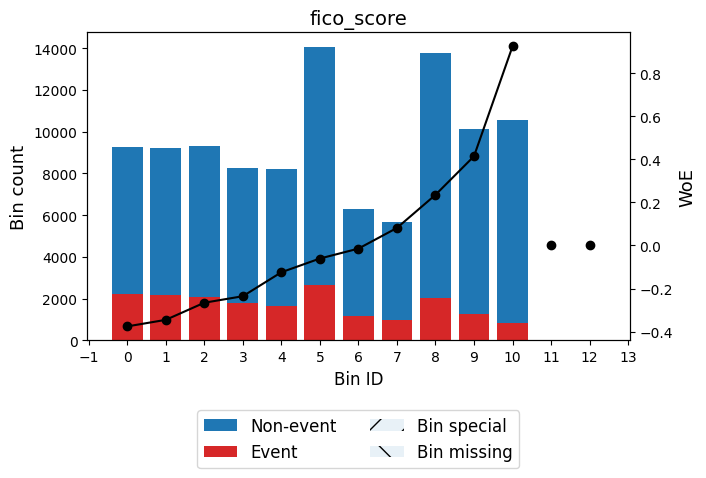

✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0227
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │        IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 0.50) │   45481 │             0.2046 │ -0.16422328471908476 │ 0.0123244 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [0.50, inf)  │   59331 │             0.1597 │ 0.13868499102895826  │ 0.0104078 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│              │  104812 │    

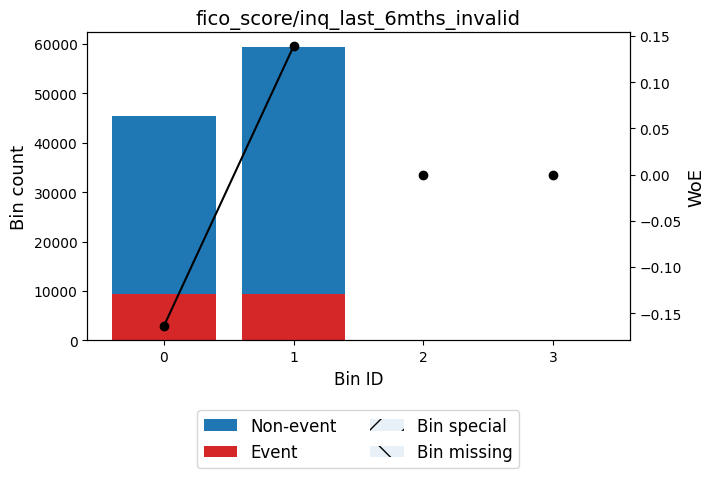

✅ Total IV for fico_score/inq_last_6mths: 0.0508
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 112.42)   │   59364 │             0.1597 │ 0.1388444226437313   │ 0.010437   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [112.42, 339.75) │   10104 │             0.2518 │ -0.43266356353726887 │ 0.0205829  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [339.75, 679.50) │   17132 │             0.2184 │ -0.2469091763996516  │ 0.0107628  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [679.50, 699.50) │    8038 │             0.1987 │ -0.12724016991895648 │ 0.00129263 │
├──────────────────┼─────────┼────────────────────┼────────────────────

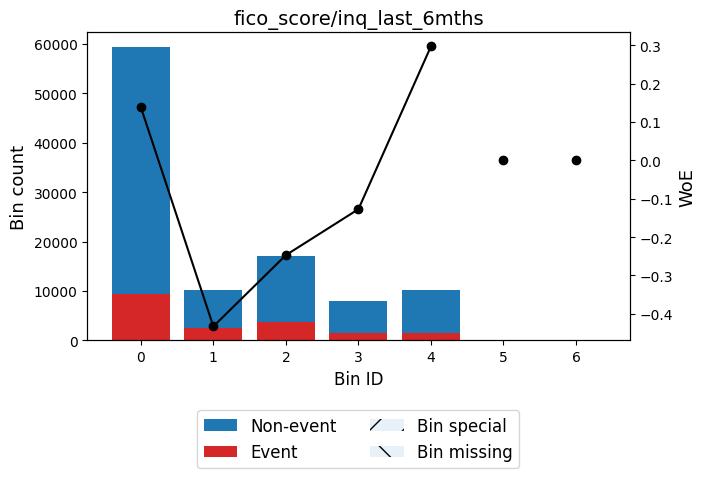

✅ Total IV for loan_amnt/annual_inc: 0.1286
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.07) │    7776 │             0.1089 │ 0.5799729787244923    │ 0.0205573   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.07, 0.10) │    8097 │             0.1182 │ 0.48786755562984085   │ 0.0156319   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.10, 0.12) │    7253 │             0.1284 │ 0.39373450724766124   │ 0.00941705  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.12, 0.17) │   16501 │             0.1401 │ 0.29306005162887283   │ 0.012279    │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.17, 0

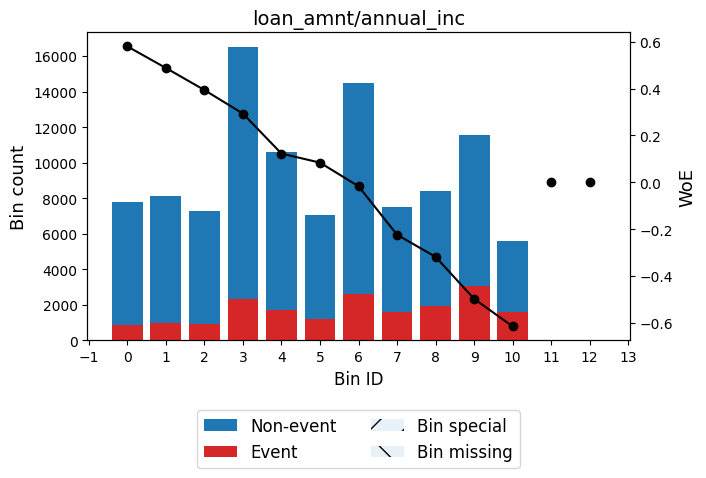

✅ Total IV for revol_util/annual_inc: 0.0469
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5536 │             0.1183 │ 0.4866730520010605    │ 0.0106397   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.00) │    9842 │             0.1339 │ 0.34497316990522053   │ 0.00997253  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.00) │    7053 │             0.1486 │ 0.22391176138226165   │ 0.00313546  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.00) │   12582 │             0.1553 │ 0.17181636602614136   │ 0.00335085  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 

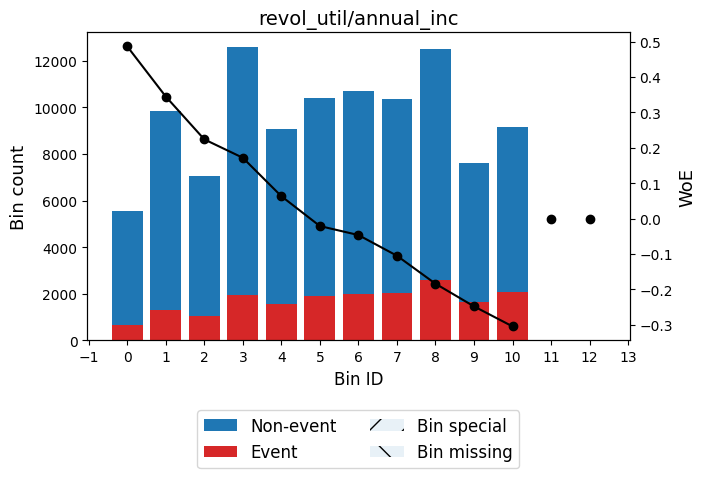

✅ Total IV for acc_op_past_24mths/total_acc: 0.0691
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.03) │    5324 │             0.1119 │ 0.5492197837697494   │ 0.0127557   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.06) │    6176 │             0.1211 │ 0.4601259347294475   │ 0.0107066   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.11) │   14766 │             0.1399 │ 0.294190514516264    │ 0.0110686   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.11, 0.14) │   11503 │             0.158  │ 0.15169764631616856  │ 0.00240396  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.14, 0.16

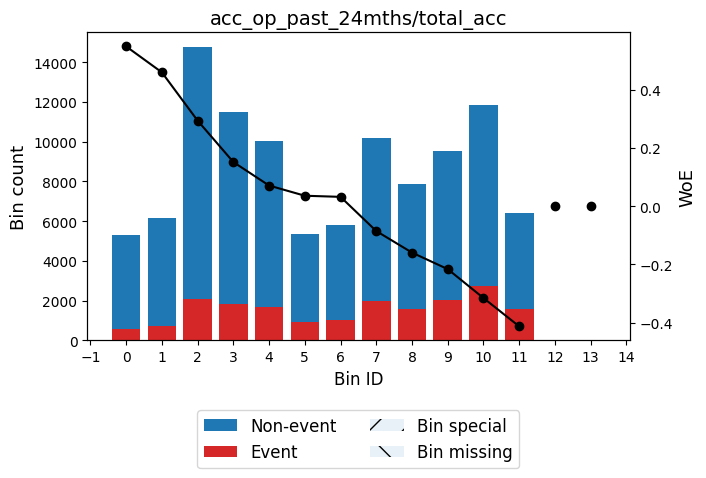

✅ Total IV for bc_open_to_buy/annual_inc: 0.0254
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5390 │             0.2343 │ -0.3377362008487441  │ 0.00650939  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.01) │    9686 │             0.2047 │ -0.16479809441766502 │ 0.00264357  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.02) │   12820 │             0.1957 │ -0.10847008909931355 │ 0.00148949  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.04) │    9055 │             0.1915 │ -0.08148105594467947 │ 0.000588637 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.07) │

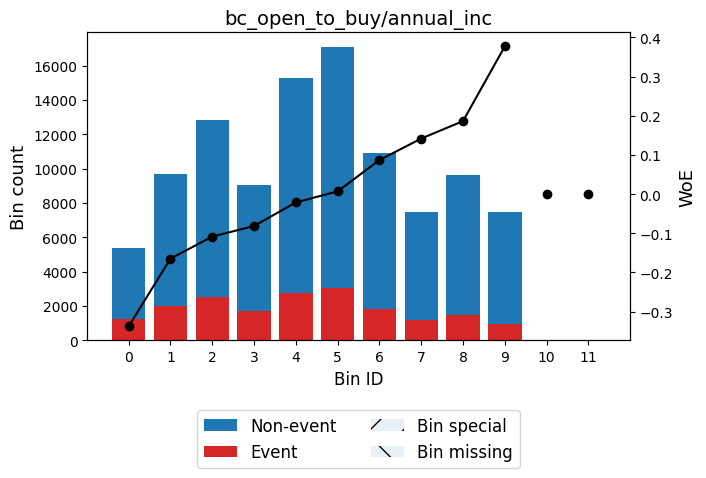

✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0453
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   62990 │             0.1597 │ 0.13896094518270075  │ 0.0110927   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │    5978 │             0.1601 │ 0.13578389633091636  │ 0.0010062   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10197 │             0.1782 │ 0.006864016829122743 │ 4.57363e-06 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │    5854 │             0.2099 │ -0.19652156787034403 │ 0.00229433  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.

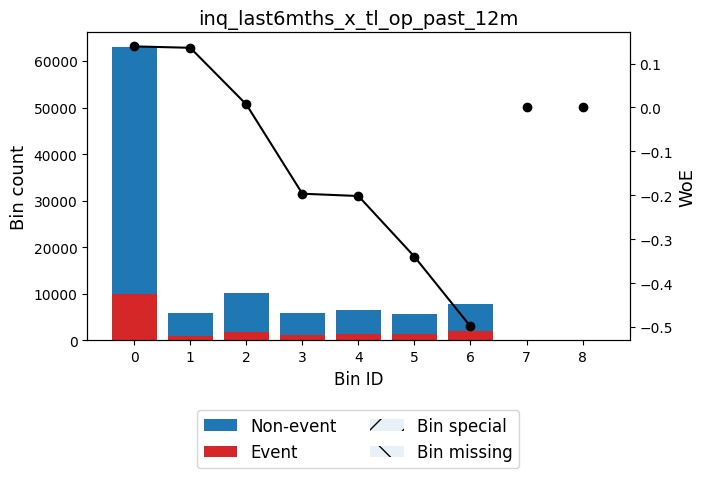

✅ Total IV for dti_x_revol_util: 0.0827
╒════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 161.80)     │    8048 │             0.1172 │ 0.4976906496469087    │ 0.0161151   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [161.80, 296.60)   │    7281 │             0.1228 │ 0.44451707013724007   │ 0.0118432   │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [296.60, 451.05)   │    9582 │             0.138  │ 0.3104817378525573    │ 0.00795655  │
├────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [451.05, 547.01)   │    6189 │             0.148  │ 0.2285412666055049    │ 0.0028619   │
├────────────────────┼─────────┼────────

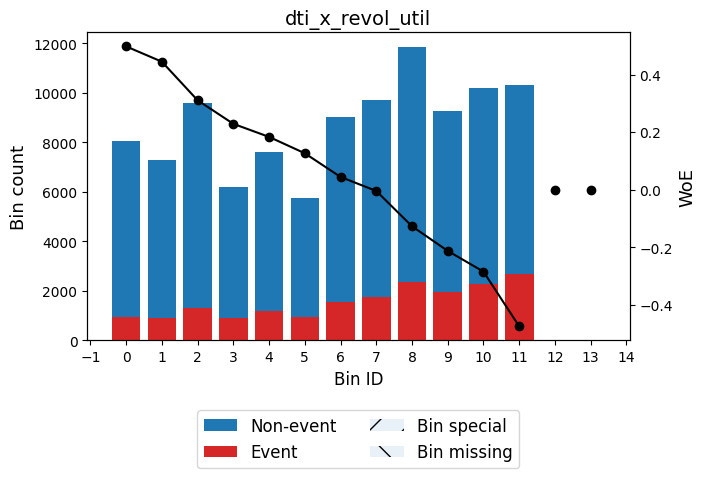

✅ Total IV for avail_ratio: 0.0280
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, -96.95)   │    5246 │             0.2461 │ -0.4022336188957232   │ 0.00915632  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [-96.95, -92.35) │    8742 │             0.2077 │ -0.1831509424497062   │ 0.00296366  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [-92.35, -77.95) │   19772 │             0.1963 │ -0.11213704940710478  │ 0.00245797  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [-77.95, -68.55) │   11248 │             0.1891 │ -0.06593019727091365  │ 0.000476383 │
├──────────────────┼─────────┼────────────────────┼──────────────

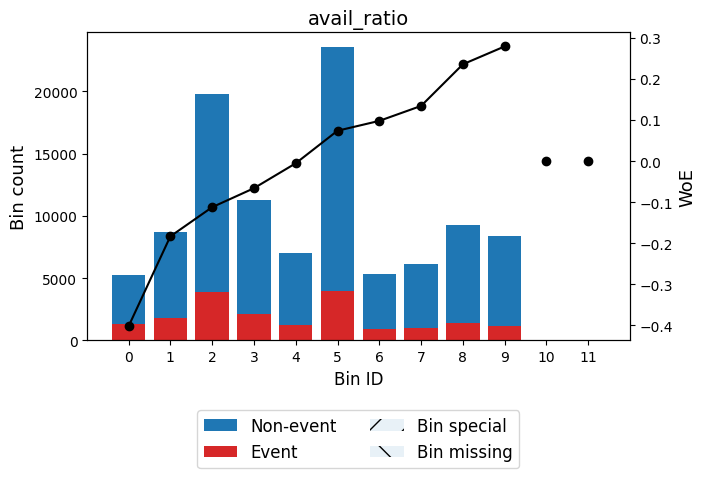

✅ Total IV for tl_op12m_x_inq6m: 0.0453
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   62990 │             0.1597 │ 0.13896094518270075  │ 0.0110927   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │    5978 │             0.1601 │ 0.13578389633091636  │ 0.0010062   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10197 │             0.1782 │ 0.006864016829122743 │ 4.57363e-06 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │    5854 │             0.2099 │ -0.19652156787034403 │ 0.00229433  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │    6437 

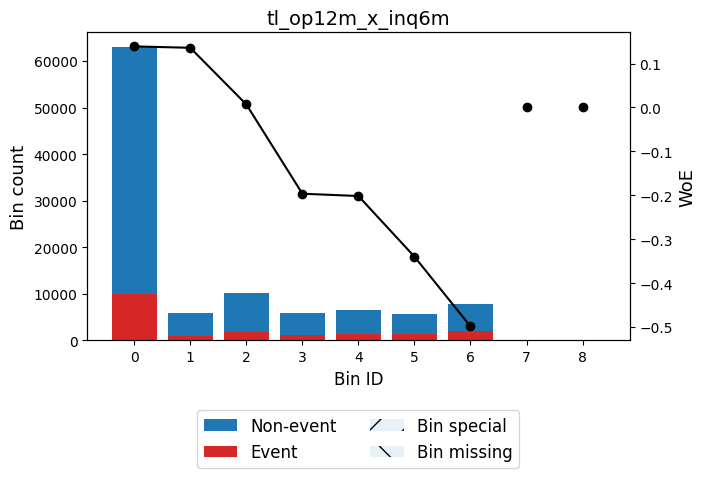

✅ Total IV for dti_x_inq: 0.0575
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 14.41)  │   70668 │             0.1575 │ 0.1550668512613469   │ 0.0154148   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14.41, 18.39) │    5806 │             0.1779 │ 0.008710739635423348 │ 4.19142e-06 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [18.39, 23.56) │    7033 │             0.1939 │ -0.09720593232993857 │ 0.000653915 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23.56, 32.05) │    8495 │             0.2211 │ -0.2623623940069837  │ 0.00605383  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [32.05, 

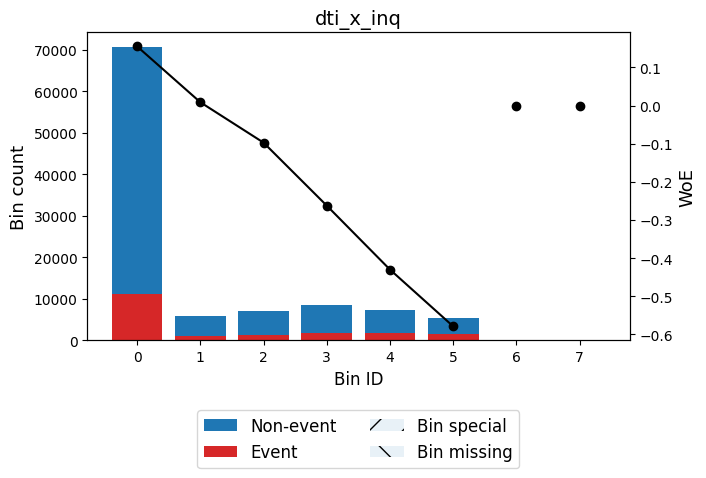

✅ Total IV for dti_x_term: 0.2265
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 199.98)     │    5417 │             0.1004 │ 0.6707186877367288   │ 0.0185649   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [199.98, 288.90)   │    5375 │             0.1068 │ 0.602153003960539    │ 0.0152013   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [288.90, 426.42)   │   11738 │             0.1112 │ 0.5569737104603409   │ 0.0288458   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [426.42, 486.90)   │    6371 │             0.1296 │ 0.3822600180126545   │ 0.00782715  │
├────────────────────┼─────────┼────────────────────┼───

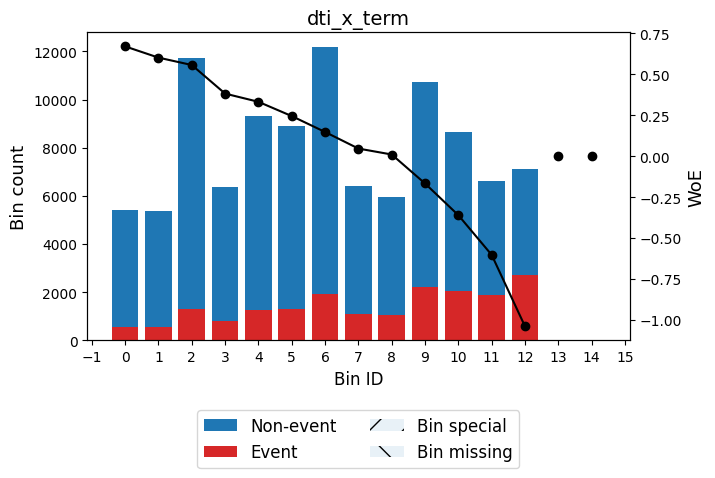

✅ Total IV for term_x_revol_util: 0.1237
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 587.40)     │    6990 │             0.1126 │ 0.5427629683048796   │ 0.0163919   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [587.40, 1255.20)  │   15489 │             0.1371 │ 0.3180868781169244   │ 0.0134648   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1255.20, 1474.20) │    6967 │             0.148  │ 0.2287091925794218   │ 0.00322622  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1474.20, 1829.40) │   12339 │             0.1541 │ 0.1806541124638814   │ 0.00362229  │
├────────────────────┼─────────┼─────────────────

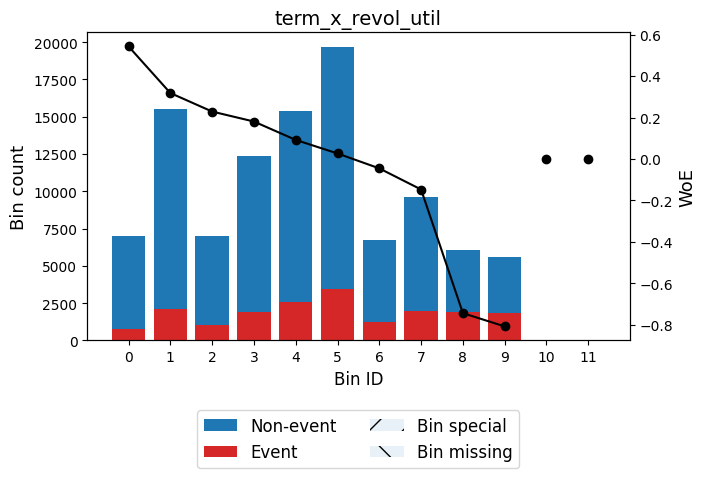

✅ Total IV for dti/fico_ratio: 0.1131
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.01) │    5286 │             0.108  │ 0.5893178771607128   │ 0.0143823   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.02) │   16360 │             0.1229 │ 0.44381811188381093  │ 0.0265336   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.02) │    5241 │             0.1372 │ 0.3170511868660335   │ 0.00452804  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.02) │    5597 │             0.1399 │ 0.2943538141013793   │ 0.00419995  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.02, 0.02) │    7201 │ 

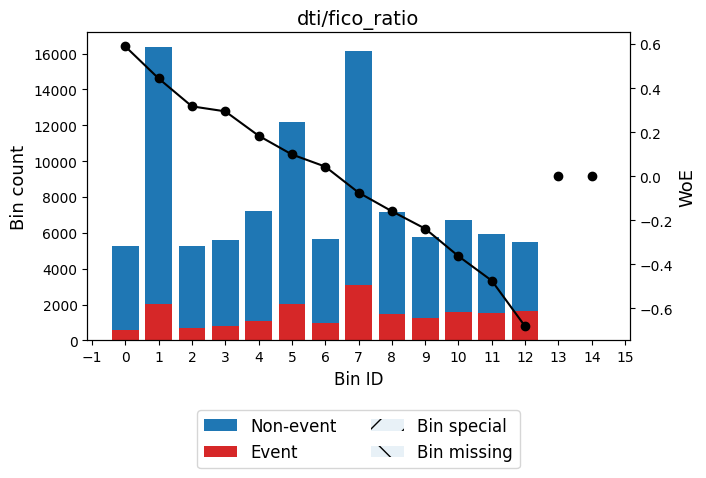

✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0720
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.03) │    8468 │             0.1101 │ 0.5683168933197731   │ 0.021582    │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.04) │    7789 │             0.1266 │ 0.4096655074915905   │ 0.0108889   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.06) │   10718 │             0.1346 │ 0.3388012204509303   │ 0.0104969   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.07) │    5545 │             0.156  │ 0.16652677372897817  │ 0.00138965  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.07, 0.10) │

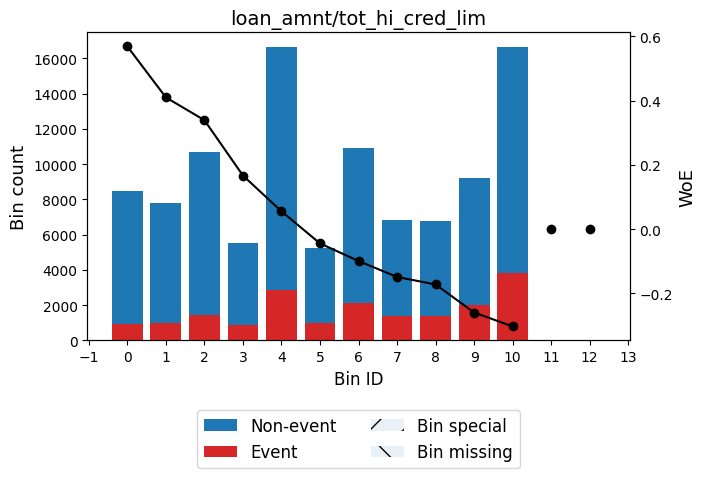

✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0412
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.01) │    6334 │             0.2425 │ -0.3827795785588124  │ 0.00995579  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.01, 0.03) │    6052 │             0.2087 │ -0.18896533025871665 │ 0.00218796  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.03, 0.10) │   17996 │             0.2048 │ -0.16538037393010674 │ 0.00494726  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, 0.16) │   12278 │             0.1964 │ -0.11264285157483944 │ 0.0015404   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.16, 0

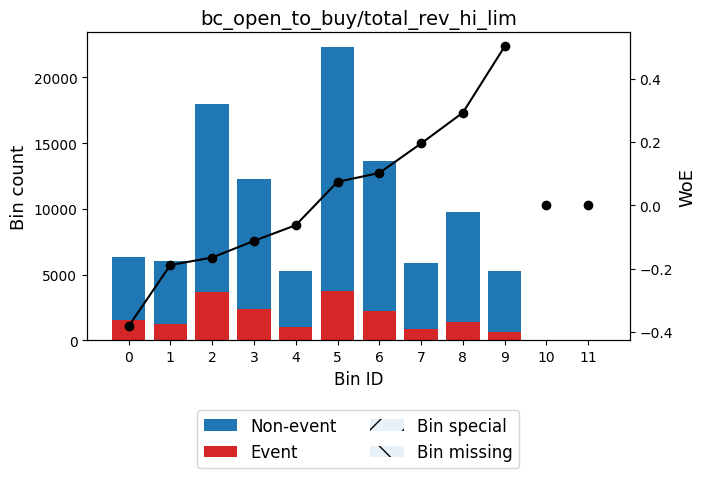

✅ Total IV for fico_score/int_rate: 0.4667
╒═════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 33.89)   │    7591 │             0.392  │ -1.0830653572668647  │ 0.113511    │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33.89, 37.96)  │    7693 │             0.315  │ -0.7447731875319524  │ 0.0504575   │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37.96, 40.76)  │    5824 │             0.2747 │ -0.5510181910926102  │ 0.0198856   │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40.76, 43.47)  │    5424 │             0.2443 │ -0.39246652616681965 │ 0.00898752  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼────

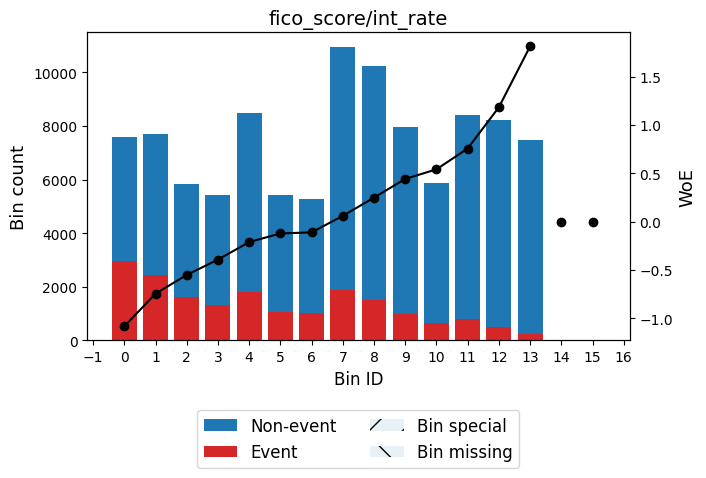

✅ Total IV for installment/annual_inc/12: 0.0928
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.03) │   10604 │             0.1093 │ 0.5761308283450233    │ 0.0276999   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.03, 0.05) │   13180 │             0.1317 │ 0.36408485069887053   │ 0.0147798   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.05, 0.05) │    5599 │             0.1395 │ 0.2977419250842961    │ 0.00429384  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.05, 0.06) │   11118 │             0.1579 │ 0.15182333941411907   │ 0.00232726  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.

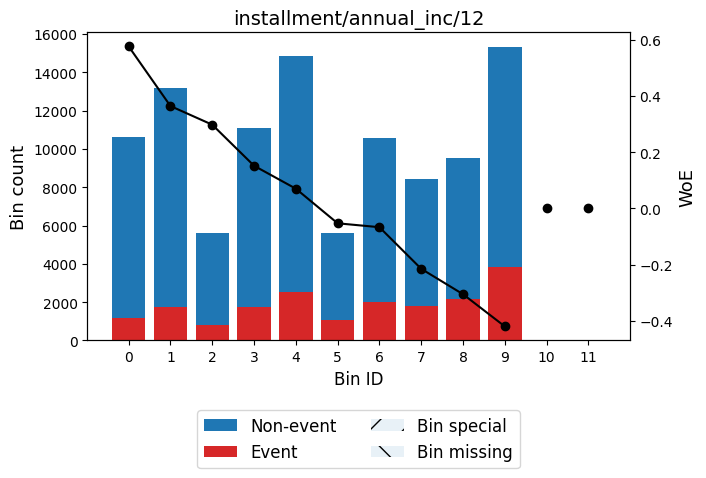

✅ Total IV for installment/annual_inc/12_x_term: 0.2222
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │         IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪════════════╡
│ (-inf, 1.17) │   11502 │             0.1042 │ 0.6291501306667189    │ 0.0351839  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [1.17, 1.82) │   14233 │             0.1154 │ 0.5145819007502901    │ 0.0302919  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [1.82, 2.41) │   13917 │             0.1335 │ 0.34851352047897377   │ 0.0143753  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [2.41, 2.75) │    7675 │             0.1444 │ 0.2577034106329086    │ 0.00446888 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [2.75, 

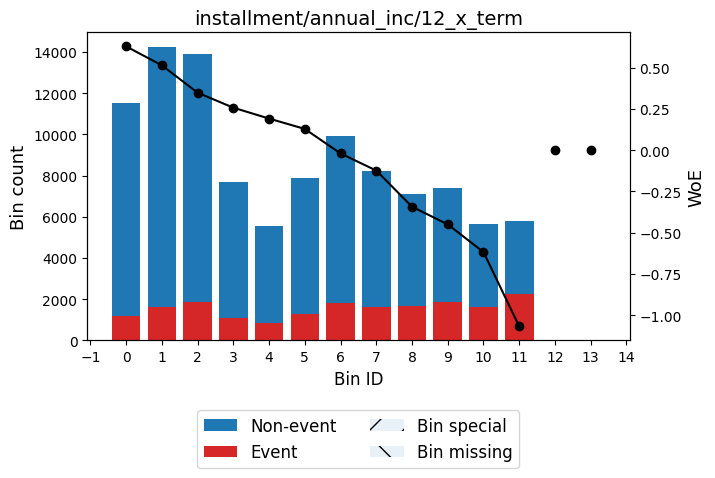

✅ Total IV for grade_numeric: 0.4549
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 1.50) │   18844 │             0.0549 │ 1.3235054125257015   │ 0.201045   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   31135 │             0.1206 │ 0.46462462658697423  │ 0.0549515  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50) │   28953 │             0.2003 │ -0.13709939881758326 │ 0.00542222 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50) │   15254 │             0.2714 │ -0.5342873212303285  │ 0.0487464  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, inf)  │   10626 │             

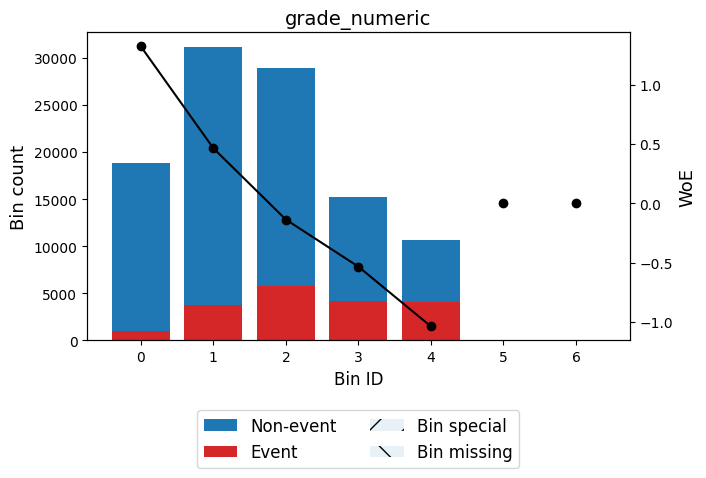

25/08/10 20:19:45 WARN HeartbeatReceiver: Removing executor driver with no recent heartbeats: 400954 ms exceeds timeout 120000 ms
25/08/10 20:19:45 WARN SparkContext: Killing executors is not supported by current scheduler.
25/08/10 20:19:50 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:53)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:342)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:81)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:669)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1296)
	at o

In [57]:
for feature in train_df1.columns: 
    x, y = train_df1[feature], train_df1[TARGET_COL]

    if feature == 'id': 
        continue
    if train_df1[feature].dtype == 'object': 
        first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto', dtype='categorical')
    else: 
        first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto')
